In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import numpy as np
from tqdm import tqdm
from collections import defaultdict
import time
import copy
import gc
import torchvision
import matplotlib.pyplot as plt
import os
from torch.utils.data import Dataset
from torchvision import transforms
from torch.utils.data import DataLoader
from PIL import Image
from torch.utils.data import random_split

import matplotlib.pyplot as plt
import numpy as np


# Process Data

In [2]:
import os

root_dir = 'D:/Data'
k01_path = os.path.join(root_dir, 'K-01', 'image')
k03_path = os.path.join(root_dir, 'K-03', 'image')

k01_image_count = len(os.listdir(k01_path))
k03_image_count = len(os.listdir(k03_path))

total_images = k01_image_count + k03_image_count
print("Total images in K-01 and K-03:", total_images)

Total images in K-01 and K-03: 3571


In [3]:
import os

root_dir = 'D:/Data'
k01_label_path = os.path.join(root_dir, 'K-01', 'indexLabel')
k03_label_path = os.path.join(root_dir, 'K-03', 'indexLabel')

k01_label_count = len(os.listdir(k01_label_path))
k03_label_count = len(os.listdir(k03_label_path))

total_labels = k01_label_count + k03_label_count
print("Total labels in K-01 and K-03 indexLabel folders:", total_labels)


Total labels in K-01 and K-03 indexLabel folders: 2892


In [4]:
class K13Dataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.samples = []
        
        # Only use K-01 and K-03 folders
        use_folders = ['K-01', 'K-03']
        
        for folder in use_folders:
            folder_path = os.path.join(root_dir, folder)
            if os.path.isdir(folder_path):
                image_dir = os.path.join(folder_path, 'image')
                label_dir = os.path.join(folder_path, 'indexLabel')
                
                # Match image and label files
                for img_name in os.listdir(image_dir):
                    img_path = os.path.join(image_dir, img_name)
                    label_path = os.path.join(label_dir, img_name)
                    
                    if os.path.exists(label_path):
                        self.samples.append((img_path, label_path))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, label_path = self.samples[idx]
        
        # Load image
        image = Image.open(img_path).convert('RGB').resize((256, 256))
        label = Image.open(label_path).resize((256, 256), Image.NEAREST)
        
        if self.transform:
            image = self.transform(image)
        label = torch.tensor(np.array(label), dtype=torch.long)
        
        return image, label

    def split_dataset(self, train_ratio=0.7, val_ratio=0.15, test_ratio=0.15):
        assert abs(train_ratio + val_ratio + test_ratio - 1.0) < 1e-5, "Ratios must sum to 1"
        
        dataset_size = len(self)
        train_size = int(train_ratio * dataset_size)
        val_size = int(val_ratio * dataset_size)
        test_size = dataset_size - train_size - val_size

        return random_split(self, [train_size, val_size, test_size])



In [5]:

# Define your transformations
transform = transforms.Compose([
    transforms.ToTensor(),
])

# Create the dataset
full_dataset = K13Dataset(root_dir='D:/Data', transform=transform)

len(full_dataset)


2338

## Split the dataset

In [6]:
# Split the dataset
train_dataset, val_dataset, test_dataset = full_dataset.split_dataset()

# Create DataLoaders
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=True, num_workers=0)
val_loader = DataLoader(val_dataset, batch_size=16, shuffle=False, num_workers=0)
test_loader = DataLoader(test_dataset, batch_size=16, shuffle=False, num_workers=0)
print(1)

1


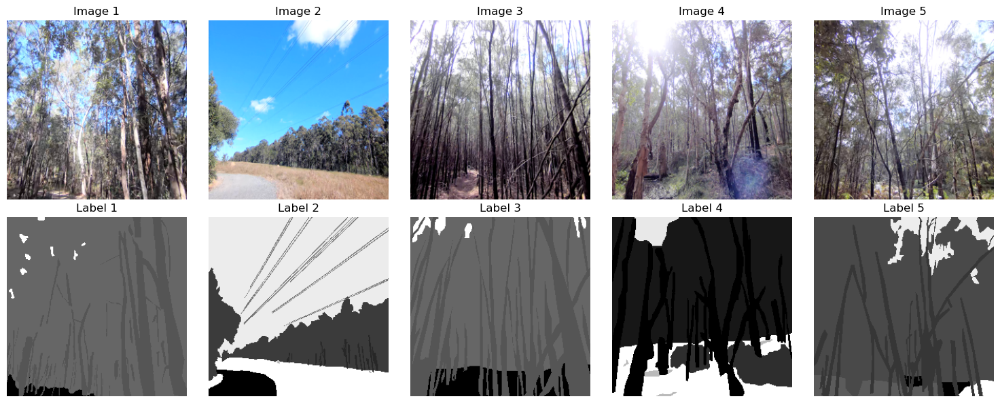

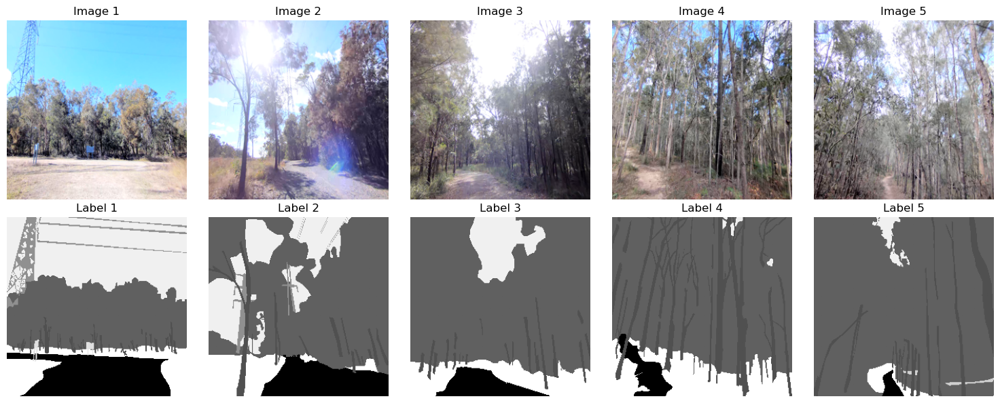

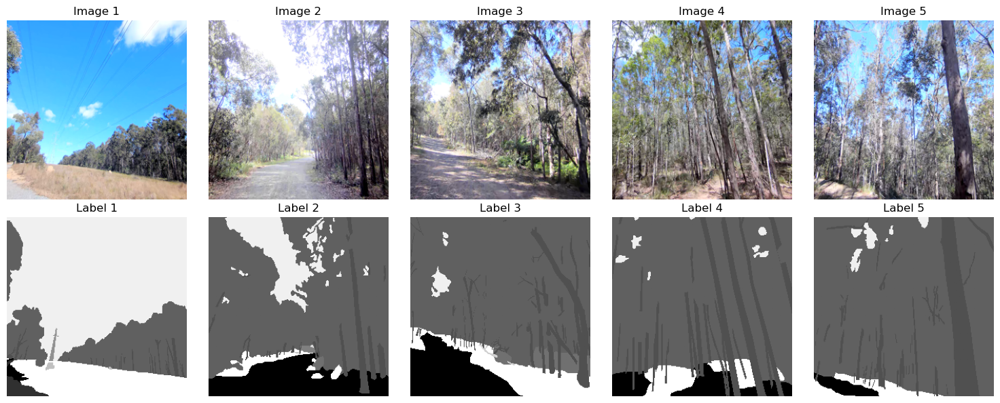

In [7]:


def visualize_batch(dataloader, num_images=5):
    # Get a batch of images
    images, labels = next(iter(dataloader))
    
    # Convert tensors to numpy arrays
    images = images.numpy()
    labels = labels.numpy()
    
    # Create a grid of subplots
    fig, axes = plt.subplots(2, num_images, figsize=(15, 6))
    
    for i in range(num_images):
        # Display image
        axes[0, i].imshow(np.transpose(images[i], (1, 2, 0)))
        axes[0, i].axis('off')
        axes[0, i].set_title(f'Image {i+1}')
        
        # Display label (assuming labels are images too)
        axes[1, i].imshow(labels[i], cmap='gray')
        axes[1, i].axis('off')
        axes[1, i].set_title(f'Label {i+1}')
    
    plt.tight_layout()
    plt.show()

# Visualize a batch from the train loader
visualize_batch(train_loader)

# Visualize a batch from the validation loader
visualize_batch(val_loader)

# Visualize a batch from the test loader
visualize_batch(test_loader)

In [8]:
len(train_dataset), len(val_dataset), len(test_dataset)

(1636, 350, 352)

# Runner

In [9]:
class ModelTrainValid:
    def __init__(self, model, device, num_classes, train_loader, valid_loader, test_loader, optimizer):
        self.model = model
        self.device = device
        self.num_classes = num_classes
        self.train_loader = train_loader
        self.valid_loader = valid_loader
        self.test_loader = test_loader
        self.optimizer = optimizer
        self.criterion = nn.CrossEntropyLoss()


    def train_one_epoch(self, epoch):
        self.model.train()
        dataset_size = 0
        running_loss = 0.0
        pbar = tqdm(enumerate(self.train_loader), total=len(self.train_loader), desc='Training')
        for step, (images, masks) in pbar:
            images, masks = images.to(self.device), masks.to(self.device)
            self.optimizer.zero_grad()
            y_pred = self.model(images)['out']
            # print(y_pred)
            # print(masks)
            loss = self.criterion(y_pred, masks)
            loss.backward()
            self.optimizer.step()

            running_loss += (loss.item() * images.size(0))
            dataset_size += images.size(0)
            epoch_loss = running_loss / dataset_size

            mem = torch.cuda.memory_reserved() / 1E9 if torch.cuda.is_available() else 0
            current_lr = self.optimizer.param_groups[0]['lr']
            pbar.set_postfix(epoch=epoch, train_loss=epoch_loss, lr=current_lr, gpu_mem=f'{mem:.2f} GB')
            print(1)
        return epoch_loss

    def valid_one_epoch(self, epoch):
        self.model.eval()
        running_loss = 0.0
        dataset_size = 0
        pbar = tqdm(enumerate(self.valid_loader), total=len(self.valid_loader), desc='Validating')
        print(2)
        with torch.no_grad():
            for step, (images, masks) in pbar:
                images, masks = images.to(self.device), masks.to(self.device)
                y_pred = self.model(images)['out']
                loss = self.criterion(y_pred, masks)
                running_loss += (loss.item() * images.size(0))
                dataset_size += images.size(0)
                epoch_loss = running_loss / dataset_size

                y_pred = torch.sigmoid(y_pred)

                mem = torch.cuda.memory_reserved() / 1E9 if torch.cuda.is_available() else 0
                pbar.set_postfix(valid_loss=epoch_loss, lr=self.optimizer.param_groups[0]['lr'], gpu_memory=f'{mem:.2f} GB')
                
        return epoch_loss

    def do_training(self, num_epochs, save_name):
        best_loss = np.inf
        best_model_wts = copy.deepcopy(self.model.state_dict())
        result = defaultdict(list)

        for epoch in range(1, num_epochs + 1):
            print(f'Epoch {epoch}/{num_epochs}')
            train_loss = self.train_one_epoch(epoch)
            val_loss = self.valid_one_epoch(epoch)

            result['Train Loss'].append(train_loss)
            result['Valid Loss'].append(val_loss)

            if val_loss < best_loss:
                best_loss = val_loss
                best_model_wts = copy.deepcopy(self.model.state_dict())
                torch.save(self.model.state_dict(), f'{save_name}_best_model.pth')
                print(f'Saved Best Model')
                self.mIoU_compute(self.valid_loader)
                print("plot valid image")
                self.plot_images(self.valid_loader)

            torch.save(self.model.state_dict(), f'{save_name}_last_model.pth')

        self.model.load_state_dict(best_model_wts)
        return self.model, result
    

    def mIoU_compute(self, dataloder):
        self.model.eval()
        hist = np.zeros((self.num_classes, self.num_classes))
        with torch.no_grad():
            pbar = tqdm(enumerate(dataloder), total=len(dataloder), desc='compute_mIoU')
            for step, (images, gt_img) in pbar:
                images = images.to(self.device)
                gt_img = gt_img.to(self.device)
                pred = self.model(images)['out']
                pred = torch.argmax(pred, dim=1).detach().cpu().numpy()
                label = gt_img.detach().cpu().numpy()
                for i in range(len(label)):
                    k = (label[i] >= 0) & (label[i] < num_classes)
                    hist += np.bincount(num_classes * label[i][k].astype(int) + pred[i][k], minlength=num_classes**2).reshape(num_classes, num_classes)
        IoUs = np.diag(hist) / np.maximum(hist.sum(1) + hist.sum(0) - np.diag(hist), 1)
        PA_Recall = np.diag(hist) / np.maximum(hist.sum(1), 1)
        Precision = np.diag(hist) / np.maximum(hist.sum(0), 1)
        Accuracy = np.sum(np.diag(hist)) / np.maximum(np.sum(hist), 1)
        # result_data = {name_classes[i]: (IoUs[i], PA_Recall[i], Precision[i]) for i in range(num_classes)}
        print('Validation metric:')
        print(f'mIoU: {np.nanmean(IoUs) * 100:.2f}')
        print(f'mPA: {np.nanmean(PA_Recall) * 100:.2f}')
        print(f'Accuracy: {Accuracy * 100:.2f}')
        return IoUs, PA_Recall, Precision

    def plot_images(self, dataloader, num_images=4, nrow=2):
        self.model.eval()
        images_list = []
        labels_list = []
        preds_list = []
        with torch.no_grad():
            image_count = 0
            for images, labels in dataloader:
                images, labels = images.to(self.device), labels.to(self.device)
                outputs = self.model(images)['out']
                preds = torch.argmax(outputs, dim=1)
                images_list.append(images.cpu())
                labels_list.append(labels.cpu())
                preds_list.append(preds.cpu())
                image_count += images.size(0)
                if image_count >= num_images:
                    break
            images_grid = torch.cat(images_list)[:num_images]
            labels_grid = torch.cat(labels_list)[:num_images]
            preds_grid = torch.cat(preds_list)[:num_images]
            fig, axs = plt.subplots(1, 3, figsize=(18, 6))  # 1 row, 3 columns
            self.show_grid(images_grid, "Input Images", nrow, axs[0])
            self.show_grid(labels_grid.unsqueeze(1).float(), "Ground Truth Labels", nrow, axs[1])
            self.show_grid(preds_grid.unsqueeze(1).float(), "Model Predictions", nrow, axs[2])
            plt.tight_layout()
            plt.show()
    

    @staticmethod
    def show_grid(tensor, title, nrow, ax):
        grid = torchvision.utils.make_grid(tensor, nrow=nrow, padding=2, normalize=True)
        ax.imshow(grid.permute(1, 2, 0))
        ax.set_title(title)
        ax.axis('off')


In [10]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
name_classes = [
    "unlabelled", "asphalt", "dirt", "mud", "water", "gravel", 
    "other-terrain", "tree-trunk", "tree-foliage", "bush", 
    "fence", "structure", "pole", "vehicle", "rock", "log", 
    "other-object", "sky", "grass",
    ]
num_classes = len(name_classes)
batch_size=16




In [11]:
from tqdm import tqdm
import time

for i in tqdm(range(100)):
    time.sleep(0.1)


100%|██████████| 100/100 [00:11<00:00,  9.04it/s]


# Model

## FCN

In [12]:
model_fcn = torchvision.models.segmentation.fcn_resnet50(pretrained=True)
model_fcn.classifier

D:\Anaconda\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
D:\Anaconda\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FCN_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=FCN_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


FCNHead(
  (0): Conv2d(2048, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (2): ReLU()
  (3): Dropout(p=0.1, inplace=False)
  (4): Conv2d(512, 21, kernel_size=(1, 1), stride=(1, 1))
)

In [13]:

class MyHead(nn.Module):
    def __init__(self, num_classes):
        super(MyHead, self).__init__()
        self.classifier = nn.Sequential(
            nn.Conv2d(2048, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False),
            nn.BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True),
            nn.ReLU(),
            nn.Dropout(p=0.1, inplace=False),
            nn.Conv2d(512, num_classes, kernel_size=(1, 1), stride=(1, 1))
        )
    def forward(self,x):
        return self.classifier(x)

model_fcn.classifier = MyHead(num_classes)


In [14]:
model_fcn.to(device)

optimizer = optim.Adam(model_fcn.parameters(), lr=1e-4, weight_decay=1e-6)
import torch
print(torch.cuda.is_available())  # 检查 CUDA 是否可用
print(torch.cuda.current_device())  # 查看当前激活的 CUDA 设备索引
print(torch.cuda.device_count())  # 查看可用的 GPU 数量
print(torch.cuda.get_device_name(0))  # 查看 GPU 的名称，如果有多个GPU，可以更改索引



True
0
1
NVIDIA GeForce RTX 4090


Epoch 1/10


Training:   1%|          | 1/103 [00:09<15:23,  9.06s/it, epoch=1, gpu_mem=5.62 GB, lr=0.0001, train_loss=3.03]

1


Training:   2%|▏         | 2/103 [00:11<08:25,  5.00s/it, epoch=1, gpu_mem=5.62 GB, lr=0.0001, train_loss=2.63]

1


Training:   3%|▎         | 3/103 [00:13<06:28,  3.88s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=2.38]

1


Training:   4%|▍         | 4/103 [00:15<05:18,  3.21s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=2.18]

1


Training:   5%|▍         | 5/103 [00:18<04:45,  2.92s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=2.03]

1


Training:   6%|▌         | 6/103 [00:20<04:19,  2.68s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.94]

1


Training:   7%|▋         | 7/103 [00:22<04:02,  2.52s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.83]

1


Training:   8%|▊         | 8/103 [00:25<03:55,  2.48s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.76]

1


Training:   9%|▊         | 9/103 [00:27<03:45,  2.40s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.7] 

1


Training:  10%|▉         | 10/103 [00:29<03:36,  2.33s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.65]

1


Training:  11%|█         | 11/103 [00:31<03:36,  2.35s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.62]

1


Training:  12%|█▏        | 12/103 [00:34<03:32,  2.33s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.57]

1


Training:  13%|█▎        | 13/103 [00:36<03:29,  2.33s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.54]

1


Training:  14%|█▎        | 14/103 [00:38<03:23,  2.29s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.51]

1


Training:  15%|█▍        | 15/103 [00:41<03:23,  2.32s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.47]

1


Training:  16%|█▌        | 16/103 [00:43<03:18,  2.29s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.44]

1


Training:  17%|█▋        | 17/103 [00:45<03:14,  2.26s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.41]

1


Training:  17%|█▋        | 18/103 [00:47<03:15,  2.30s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.39]

1


Training:  18%|█▊        | 19/103 [00:50<03:12,  2.29s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.37]

1


Training:  19%|█▉        | 20/103 [00:52<03:11,  2.31s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.34]

1


Training:  20%|██        | 21/103 [00:54<03:05,  2.26s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.32]

1


Training:  21%|██▏       | 22/103 [00:57<03:03,  2.27s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.3] 

1


Training:  22%|██▏       | 23/103 [00:59<03:03,  2.29s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.28]

1


Training:  23%|██▎       | 24/103 [01:01<03:01,  2.29s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.26]

1


Training:  24%|██▍       | 25/103 [01:04<03:03,  2.35s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.25]

1


Training:  25%|██▌       | 26/103 [01:06<02:57,  2.31s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.23]

1


Training:  26%|██▌       | 27/103 [01:08<02:52,  2.28s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.22]

1


Training:  27%|██▋       | 28/103 [01:10<02:48,  2.25s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.21]

1


Training:  28%|██▊       | 29/103 [01:12<02:45,  2.23s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.19]

1


Training:  29%|██▉       | 30/103 [01:15<02:42,  2.22s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.18]

1


Training:  30%|███       | 31/103 [01:17<02:42,  2.26s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.17]

1


Training:  31%|███       | 32/103 [01:19<02:40,  2.26s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.16]

1


Training:  32%|███▏      | 33/103 [01:22<02:39,  2.28s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.15]

1


Training:  33%|███▎      | 34/103 [01:24<02:35,  2.26s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.14]

1


Training:  34%|███▍      | 35/103 [01:26<02:37,  2.32s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.13]

1


Training:  35%|███▍      | 36/103 [01:29<02:37,  2.35s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.12]

1


Training:  36%|███▌      | 37/103 [01:31<02:32,  2.30s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.11]

1


Training:  37%|███▋      | 38/103 [01:33<02:27,  2.27s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.1] 

1


Training:  38%|███▊      | 39/103 [01:35<02:26,  2.28s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.09]

1


Training:  39%|███▉      | 40/103 [01:38<02:23,  2.27s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.08]

1


Training:  40%|███▉      | 41/103 [01:40<02:22,  2.29s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.07]

1


Training:  41%|████      | 42/103 [01:42<02:19,  2.29s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.06]

1


Training:  42%|████▏     | 43/103 [01:44<02:15,  2.26s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.06]

1


Training:  43%|████▎     | 44/103 [01:47<02:12,  2.25s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.05]

1


Training:  44%|████▎     | 45/103 [01:49<02:09,  2.23s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.04]

1


Training:  45%|████▍     | 46/103 [01:51<02:09,  2.28s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.04]

1


Training:  46%|████▌     | 47/103 [01:53<02:06,  2.26s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.03]

1


Training:  47%|████▋     | 48/103 [01:56<02:03,  2.24s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.02]

1


Training:  48%|████▊     | 49/103 [01:58<02:01,  2.25s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.02]

1


Training:  49%|████▊     | 50/103 [02:00<02:00,  2.28s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.01]

1


Training:  50%|████▉     | 51/103 [02:03<01:58,  2.28s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1.01]

1


Training:  50%|█████     | 52/103 [02:05<01:56,  2.28s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=1]   

1


Training:  51%|█████▏    | 53/103 [02:07<01:55,  2.32s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.994]

1


Training:  52%|█████▏    | 54/103 [02:09<01:52,  2.29s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.988]

1


Training:  53%|█████▎    | 55/103 [02:12<01:49,  2.29s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.984]

1


Training:  54%|█████▍    | 56/103 [02:14<01:47,  2.29s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.978]

1


Training:  55%|█████▌    | 57/103 [02:17<01:48,  2.36s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.974]

1


Training:  56%|█████▋    | 58/103 [02:19<01:44,  2.32s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.968]

1


Training:  57%|█████▋    | 59/103 [02:21<01:43,  2.34s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.962]

1


Training:  58%|█████▊    | 60/103 [02:24<01:43,  2.41s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.957]

1


Training:  59%|█████▉    | 61/103 [02:26<01:42,  2.43s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.953]

1


Training:  60%|██████    | 62/103 [02:28<01:36,  2.36s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.948]

1


Training:  61%|██████    | 63/103 [02:31<01:35,  2.38s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.942]

1


Training:  62%|██████▏   | 64/103 [02:33<01:30,  2.33s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.938]

1


Training:  63%|██████▎   | 65/103 [02:35<01:26,  2.29s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.934]

1


Training:  64%|██████▍   | 66/103 [02:37<01:23,  2.26s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.93] 

1


Training:  65%|██████▌   | 67/103 [02:40<01:21,  2.27s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.925]

1


Training:  66%|██████▌   | 68/103 [02:42<01:19,  2.28s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.922]

1


Training:  67%|██████▋   | 69/103 [02:44<01:17,  2.28s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.917]

1


Training:  68%|██████▊   | 70/103 [02:47<01:15,  2.29s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.913]

1


Training:  69%|██████▉   | 71/103 [02:49<01:14,  2.33s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.908]

1


Training:  70%|██████▉   | 72/103 [02:51<01:10,  2.29s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.904]

1


Training:  71%|███████   | 73/103 [02:53<01:07,  2.26s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.9]  

1


Training:  72%|███████▏  | 74/103 [02:56<01:08,  2.36s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.896]

1


Training:  73%|███████▎  | 75/103 [02:58<01:04,  2.31s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.892]

1


Training:  74%|███████▍  | 76/103 [03:01<01:02,  2.33s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.888]

1


Training:  75%|███████▍  | 77/103 [03:03<00:59,  2.29s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.885]

1


Training:  76%|███████▌  | 78/103 [03:05<00:56,  2.27s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.88] 

1


Training:  77%|███████▋  | 79/103 [03:07<00:53,  2.25s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.877]

1


Training:  78%|███████▊  | 80/103 [03:10<00:52,  2.28s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.873]

1


Training:  79%|███████▊  | 81/103 [03:12<00:49,  2.27s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.869]

1


Training:  80%|███████▉  | 82/103 [03:14<00:47,  2.25s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.864]

1


Training:  81%|████████  | 83/103 [03:16<00:44,  2.23s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.861]

1


Training:  82%|████████▏ | 84/103 [03:19<00:43,  2.28s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.859]

1


Training:  83%|████████▎ | 85/103 [03:21<00:41,  2.31s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.856]

1


Training:  83%|████████▎ | 86/103 [03:23<00:39,  2.34s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.853]

1


Training:  84%|████████▍ | 87/103 [03:26<00:36,  2.31s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.849]

1


Training:  85%|████████▌ | 88/103 [03:28<00:34,  2.33s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.847]

1


Training:  86%|████████▋ | 89/103 [03:30<00:32,  2.29s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.845]

1


Training:  87%|████████▋ | 90/103 [03:33<00:30,  2.32s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.842]

1


Training:  88%|████████▊ | 91/103 [03:35<00:27,  2.29s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.839]

1


Training:  89%|████████▉ | 92/103 [03:37<00:24,  2.26s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.837]

1


Training:  90%|█████████ | 93/103 [03:39<00:22,  2.24s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.835]

1


Training:  91%|█████████▏| 94/103 [03:42<00:20,  2.33s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.831]

1


Training:  92%|█████████▏| 95/103 [03:44<00:18,  2.35s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.828]

1


Training:  93%|█████████▎| 96/103 [03:46<00:15,  2.28s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.827]

1


Training:  94%|█████████▍| 97/103 [03:49<00:13,  2.29s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.824]

1


Training:  95%|█████████▌| 98/103 [03:51<00:11,  2.26s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.822]

1


Training:  96%|█████████▌| 99/103 [03:53<00:09,  2.33s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.819]

1


Training:  97%|█████████▋| 100/103 [03:55<00:06,  2.28s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.816]

1


Training:  98%|█████████▊| 101/103 [03:58<00:04,  2.26s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.814]

1


Training:  99%|█████████▉| 102/103 [04:00<00:02,  2.29s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.812]

1


Training: 100%|██████████| 103/103 [04:01<00:00,  2.34s/it, epoch=1, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.811]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:48<00:00,  2.20s/it, gpu_memory=6.15 GB, lr=0.0001, valid_loss=0.558]


Saved Best Model


compute_mIoU: 100%|██████████| 22/22 [00:48<00:00,  2.22s/it]


Validation metric:
mIoU: 19.86
mPA: 25.49
Accuracy: 80.77
plot valid image


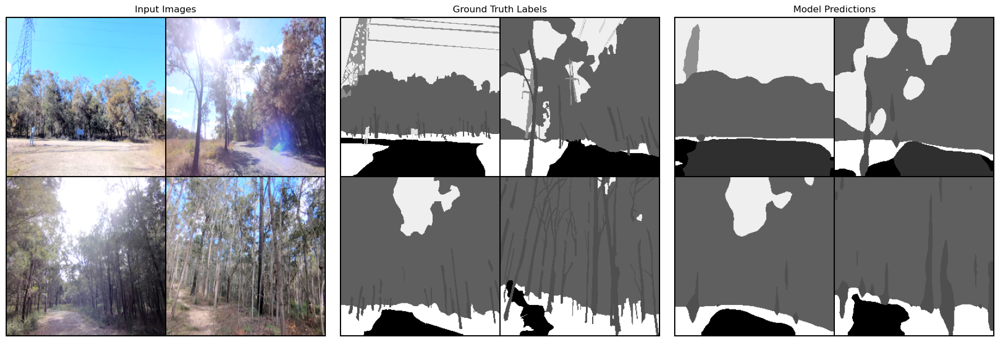

Epoch 2/10


Training:   1%|          | 1/103 [00:02<04:03,  2.38s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.532]

1


Training:   2%|▏         | 2/103 [00:04<03:55,  2.33s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.579]

1


Training:   3%|▎         | 3/103 [00:06<03:47,  2.27s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.574]

1


Training:   4%|▍         | 4/103 [00:09<03:43,  2.25s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.565]

1


Training:   5%|▍         | 5/103 [00:11<03:40,  2.25s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.569]

1


Training:   6%|▌         | 6/103 [00:13<03:41,  2.28s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.558]

1


Training:   7%|▋         | 7/103 [00:15<03:36,  2.25s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.552]

1


Training:   8%|▊         | 8/103 [00:18<03:30,  2.22s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.544]

1


Training:   9%|▊         | 9/103 [00:20<03:29,  2.23s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.546]

1


Training:  10%|▉         | 10/103 [00:22<03:26,  2.22s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.548]

1


Training:  11%|█         | 11/103 [00:24<03:29,  2.27s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.549]

1


Training:  12%|█▏        | 12/103 [00:27<03:25,  2.26s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.545]

1


Training:  13%|█▎        | 13/103 [00:29<03:21,  2.24s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.543]

1


Training:  14%|█▎        | 14/103 [00:31<03:18,  2.23s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.542]

1


Training:  15%|█▍        | 15/103 [00:33<03:14,  2.21s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.54] 

1


Training:  16%|█▌        | 16/103 [00:36<03:17,  2.28s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.544]

1


Training:  17%|█▋        | 17/103 [00:38<03:18,  2.31s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.541]

1


Training:  17%|█▋        | 18/103 [00:40<03:15,  2.30s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.537]

1


Training:  18%|█▊        | 19/103 [00:42<03:09,  2.26s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.533]

1


Training:  19%|█▉        | 20/103 [00:45<03:04,  2.23s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.53] 

1


Training:  20%|██        | 21/103 [00:47<03:02,  2.22s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.527]

1


Training:  21%|██▏       | 22/103 [00:49<02:59,  2.22s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.528]

1


Training:  22%|██▏       | 23/103 [00:51<02:56,  2.20s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.525]

1


Training:  23%|██▎       | 24/103 [00:53<02:54,  2.21s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.524]

1


Training:  24%|██▍       | 25/103 [00:56<02:51,  2.20s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.524]

1


Training:  25%|██▌       | 26/103 [00:58<02:53,  2.26s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.524]

1


Training:  26%|██▌       | 27/103 [01:00<02:52,  2.27s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.523]

1


Training:  27%|██▋       | 28/103 [01:03<02:50,  2.28s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.524]

1


Training:  28%|██▊       | 29/103 [01:05<02:47,  2.26s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.522]

1


Training:  29%|██▉       | 30/103 [01:07<02:43,  2.24s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.522]

1


Training:  30%|███       | 31/103 [01:09<02:40,  2.23s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.522]

1


Training:  31%|███       | 32/103 [01:11<02:39,  2.24s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.522]

1


Training:  32%|███▏      | 33/103 [01:14<02:38,  2.27s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.521]

1


Training:  33%|███▎      | 34/103 [01:16<02:37,  2.28s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.521]

1


Training:  34%|███▍      | 35/103 [01:18<02:34,  2.28s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.518]

1


Training:  35%|███▍      | 36/103 [01:21<02:31,  2.26s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.516]

1


Training:  36%|███▌      | 37/103 [01:23<02:31,  2.30s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.516]

1


Training:  37%|███▋      | 38/103 [01:25<02:27,  2.27s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.516]

1


Training:  38%|███▊      | 39/103 [01:27<02:24,  2.25s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.515]

1


Training:  39%|███▉      | 40/103 [01:30<02:20,  2.23s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.516]

1


Training:  40%|███▉      | 41/103 [01:32<02:21,  2.28s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.516]

1


Training:  41%|████      | 42/103 [01:34<02:21,  2.32s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.516]

1


Training:  42%|████▏     | 43/103 [01:37<02:19,  2.32s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.515]

1


Training:  43%|████▎     | 44/103 [01:39<02:16,  2.32s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.516]

1


Training:  44%|████▎     | 45/103 [01:41<02:13,  2.30s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.515]

1


Training:  45%|████▍     | 46/103 [01:44<02:15,  2.37s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.515]

1


Training:  46%|████▌     | 47/103 [01:46<02:11,  2.34s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.516]

1


Training:  47%|████▋     | 48/103 [01:48<02:08,  2.33s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.516]

1


Training:  48%|████▊     | 49/103 [01:51<02:03,  2.29s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.515]

1


Training:  49%|████▊     | 50/103 [01:53<02:00,  2.27s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.514]

1


Training:  50%|████▉     | 51/103 [01:55<01:59,  2.29s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.514]

1


Training:  50%|█████     | 52/103 [01:57<01:56,  2.28s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.514]

1


Training:  51%|█████▏    | 53/103 [02:00<01:53,  2.28s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.514]

1


Training:  52%|█████▏    | 54/103 [02:02<01:51,  2.28s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.514]

1


Training:  53%|█████▎    | 55/103 [02:04<01:48,  2.26s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.515]

1


Training:  54%|█████▍    | 56/103 [02:06<01:45,  2.25s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.514]

1


Training:  55%|█████▌    | 57/103 [02:09<01:43,  2.25s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.512]

1


Training:  56%|█████▋    | 58/103 [02:11<01:40,  2.23s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.511]

1


Training:  57%|█████▋    | 59/103 [02:13<01:39,  2.27s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.51] 

1


Training:  58%|█████▊    | 60/103 [02:16<01:39,  2.31s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.51]

1


Training:  59%|█████▉    | 61/103 [02:18<01:37,  2.33s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.51]

1


Training:  60%|██████    | 62/103 [02:20<01:33,  2.29s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.511]

1


Training:  61%|██████    | 63/103 [02:22<01:30,  2.27s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.51] 

1


Training:  62%|██████▏   | 64/103 [02:25<01:28,  2.28s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.509]

1


Training:  63%|██████▎   | 65/103 [02:27<01:26,  2.28s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.51] 

1


Training:  64%|██████▍   | 66/103 [02:29<01:23,  2.26s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.509]

1


Training:  65%|██████▌   | 67/103 [02:31<01:20,  2.24s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.51] 

1


Training:  66%|██████▌   | 68/103 [02:34<01:17,  2.23s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.509]

1


Training:  67%|██████▋   | 69/103 [02:36<01:16,  2.25s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.509]

1


Training:  68%|██████▊   | 70/103 [02:38<01:14,  2.26s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.509]

1


Training:  69%|██████▉   | 71/103 [02:40<01:12,  2.27s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.509]

1


Training:  70%|██████▉   | 72/103 [02:43<01:09,  2.24s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.51] 

1


Training:  71%|███████   | 73/103 [02:45<01:06,  2.23s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.51]

1


Training:  72%|███████▏  | 74/103 [02:47<01:05,  2.26s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.511]

1


Training:  73%|███████▎  | 75/103 [02:49<01:02,  2.24s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.51] 

1


Training:  74%|███████▍  | 76/103 [02:52<01:01,  2.28s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.511]

1


Training:  75%|███████▍  | 77/103 [02:54<00:57,  2.23s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.51] 

1


Training:  76%|███████▌  | 78/103 [02:56<00:56,  2.26s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.51]

1


Training:  77%|███████▋  | 79/103 [02:58<00:53,  2.22s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.51]

1


Training:  78%|███████▊  | 80/103 [03:00<00:50,  2.20s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.509]

1


Training:  79%|███████▊  | 81/103 [03:03<00:49,  2.24s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.508]

1


Training:  80%|███████▉  | 82/103 [03:05<00:47,  2.28s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.507]

1


Training:  81%|████████  | 83/103 [03:07<00:45,  2.26s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.506]

1


Training:  82%|████████▏ | 84/103 [03:10<00:42,  2.23s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.505]

1


Training:  83%|████████▎ | 85/103 [03:12<00:40,  2.23s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.506]

1


Training:  83%|████████▎ | 86/103 [03:14<00:37,  2.22s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.506]

1


Training:  84%|████████▍ | 87/103 [03:16<00:36,  2.26s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.506]

1


Training:  85%|████████▌ | 88/103 [03:18<00:33,  2.23s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.505]

1


Training:  86%|████████▋ | 89/103 [03:21<00:32,  2.30s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.505]

1


Training:  87%|████████▋ | 90/103 [03:23<00:29,  2.28s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.504]

1


Training:  88%|████████▊ | 91/103 [03:25<00:27,  2.25s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.504]

1


Training:  89%|████████▉ | 92/103 [03:28<00:25,  2.35s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.504]

1


Training:  90%|█████████ | 93/103 [03:30<00:23,  2.31s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.505]

1


Training:  91%|█████████▏| 94/103 [03:32<00:20,  2.28s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.505]

1


Training:  92%|█████████▏| 95/103 [03:35<00:18,  2.29s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.504]

1


Training:  93%|█████████▎| 96/103 [03:37<00:16,  2.41s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.504]

1


Training:  94%|█████████▍| 97/103 [03:40<00:14,  2.40s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.503]

1


Training:  95%|█████████▌| 98/103 [03:42<00:11,  2.34s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.504]

1


Training:  96%|█████████▌| 99/103 [03:44<00:09,  2.31s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.503]

1


Training:  97%|█████████▋| 100/103 [03:47<00:06,  2.32s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.502]

1


Training:  98%|█████████▊| 101/103 [03:49<00:04,  2.29s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.503]

1


Training:  99%|█████████▉| 102/103 [03:51<00:02,  2.26s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.502]

1


Training: 100%|██████████| 103/103 [03:52<00:00,  2.25s/it, epoch=2, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.502]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:48<00:00,  2.20s/it, gpu_memory=6.15 GB, lr=0.0001, valid_loss=0.5]  


Saved Best Model


compute_mIoU: 100%|██████████| 22/22 [00:49<00:00,  2.23s/it]


Validation metric:
mIoU: 23.40
mPA: 28.98
Accuracy: 81.72
plot valid image


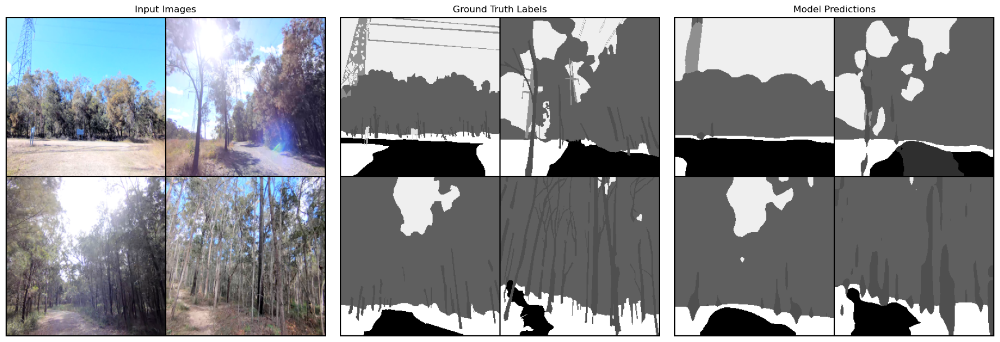

Epoch 3/10


Training:   1%|          | 1/103 [00:02<03:43,  2.20s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.452]

1


Training:   2%|▏         | 2/103 [00:04<03:38,  2.16s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.457]

1


Training:   3%|▎         | 3/103 [00:06<03:47,  2.28s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.466]

1


Training:   4%|▍         | 4/103 [00:09<03:46,  2.29s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.459]

1


Training:   5%|▍         | 5/103 [00:11<03:57,  2.42s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.451]

1


Training:   6%|▌         | 6/103 [00:13<03:47,  2.35s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.445]

1


Training:   7%|▋         | 7/103 [00:16<03:40,  2.30s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.444]

1


Training:   8%|▊         | 8/103 [00:18<03:35,  2.27s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.448]

1


Training:   9%|▊         | 9/103 [00:20<03:31,  2.25s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.453]

1


Training:  10%|▉         | 10/103 [00:22<03:27,  2.23s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.451]

1


Training:  11%|█         | 11/103 [00:25<03:27,  2.26s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.449]

1


Training:  12%|█▏        | 12/103 [00:27<03:26,  2.27s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.45] 

1


Training:  13%|█▎        | 13/103 [00:29<03:28,  2.31s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.453]

1


Training:  14%|█▎        | 14/103 [00:32<03:27,  2.33s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.451]

1


Training:  15%|█▍        | 15/103 [00:34<03:21,  2.29s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.452]

1


Training:  16%|█▌        | 16/103 [00:36<03:17,  2.27s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.452]

1


Training:  17%|█▋        | 17/103 [00:38<03:12,  2.24s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.449]

1


Training:  17%|█▋        | 18/103 [00:40<03:09,  2.23s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.447]

1


Training:  18%|█▊        | 19/103 [00:43<03:07,  2.23s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.446]

1


Training:  19%|█▉        | 20/103 [00:45<03:07,  2.26s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.446]

1


Training:  20%|██        | 21/103 [00:47<03:05,  2.26s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.448]

1


Training:  21%|██▏       | 22/103 [00:49<03:01,  2.24s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.45] 

1


Training:  22%|██▏       | 23/103 [00:52<02:57,  2.22s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.449]

1


Training:  23%|██▎       | 24/103 [00:54<02:55,  2.22s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.451]

1


Training:  24%|██▍       | 25/103 [00:56<02:52,  2.21s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.449]

1


Training:  25%|██▌       | 26/103 [00:58<02:50,  2.21s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.448]

1


Training:  26%|██▌       | 27/103 [01:00<02:47,  2.20s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.448]

1


Training:  27%|██▋       | 28/103 [01:03<02:45,  2.20s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.447]

1


Training:  28%|██▊       | 29/103 [01:05<02:42,  2.20s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.448]

1


Training:  29%|██▉       | 30/103 [01:07<02:40,  2.20s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.447]

1


Training:  30%|███       | 31/103 [01:09<02:42,  2.25s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.45] 

1


Training:  31%|███       | 32/103 [01:12<02:44,  2.31s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.448]

1


Training:  32%|███▏      | 33/103 [01:14<02:41,  2.30s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.448]

1


Training:  33%|███▎      | 34/103 [01:16<02:38,  2.30s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.448]

1


Training:  34%|███▍      | 35/103 [01:19<02:35,  2.29s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.451]

1


Training:  35%|███▍      | 36/103 [01:21<02:30,  2.25s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.452]

1


Training:  36%|███▌      | 37/103 [01:23<02:28,  2.26s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.452]

1


Training:  37%|███▋      | 38/103 [01:25<02:27,  2.28s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.452]

1


Training:  38%|███▊      | 39/103 [01:28<02:23,  2.25s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.452]

1


Training:  39%|███▉      | 40/103 [01:30<02:20,  2.23s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.452]

1


Training:  40%|███▉      | 41/103 [01:32<02:19,  2.24s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.452]

1


Training:  41%|████      | 42/103 [01:34<02:18,  2.26s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.453]

1


Training:  42%|████▏     | 43/103 [01:37<02:14,  2.24s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.451]

1


Training:  43%|████▎     | 44/103 [01:39<02:11,  2.22s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.451]

1


Training:  44%|████▎     | 45/103 [01:41<02:07,  2.19s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.449]

1


Training:  45%|████▍     | 46/103 [01:43<02:06,  2.22s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.448]

1


Training:  46%|████▌     | 47/103 [01:45<02:04,  2.23s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.448]

1


Training:  47%|████▋     | 48/103 [01:48<02:03,  2.24s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.448]

1


Training:  48%|████▊     | 49/103 [01:50<02:02,  2.27s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.449]

1


Training:  49%|████▊     | 50/103 [01:52<02:02,  2.30s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.449]

1


Training:  50%|████▉     | 51/103 [01:55<01:58,  2.27s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.448]

1


Training:  50%|█████     | 52/103 [01:57<01:54,  2.24s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.447]

1


Training:  51%|█████▏    | 53/103 [01:59<01:52,  2.25s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.447]

1


Training:  52%|█████▏    | 54/103 [02:01<01:49,  2.23s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.447]

1


Training:  53%|█████▎    | 55/103 [02:04<01:48,  2.27s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.447]

1


Training:  54%|█████▍    | 56/103 [02:06<01:45,  2.25s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.446]

1


Training:  55%|█████▌    | 57/103 [02:08<01:42,  2.23s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.446]

1


Training:  56%|█████▋    | 58/103 [02:10<01:39,  2.22s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.446]

1


Training:  57%|█████▋    | 59/103 [02:12<01:37,  2.22s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.445]

1


Training:  58%|█████▊    | 60/103 [02:15<01:36,  2.23s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.444]

1


Training:  59%|█████▉    | 61/103 [02:17<01:32,  2.21s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.444]

1


Training:  60%|██████    | 62/103 [02:19<01:32,  2.25s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.444]

1


Training:  61%|██████    | 63/103 [02:21<01:29,  2.24s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.444]

1


Training:  62%|██████▏   | 64/103 [02:24<01:26,  2.23s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.444]

1


Training:  63%|██████▎   | 65/103 [02:26<01:24,  2.22s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  64%|██████▍   | 66/103 [02:28<01:22,  2.24s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  65%|██████▌   | 67/103 [02:31<01:23,  2.32s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.444]

1


Training:  66%|██████▌   | 68/103 [02:33<01:20,  2.29s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.444]

1


Training:  67%|██████▋   | 69/103 [02:35<01:18,  2.30s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  68%|██████▊   | 70/103 [02:37<01:15,  2.29s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  69%|██████▉   | 71/103 [02:40<01:12,  2.26s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.444]

1


Training:  70%|██████▉   | 72/103 [02:42<01:09,  2.24s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  71%|███████   | 73/103 [02:44<01:06,  2.23s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  72%|███████▏  | 74/103 [02:46<01:04,  2.21s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  73%|███████▎  | 75/103 [02:48<01:03,  2.25s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  74%|███████▍  | 76/103 [02:51<01:03,  2.33s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  75%|███████▍  | 77/103 [02:53<01:00,  2.34s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  76%|███████▌  | 78/103 [02:56<00:57,  2.30s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  77%|███████▋  | 79/103 [02:58<00:54,  2.27s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  78%|███████▊  | 80/103 [03:00<00:51,  2.25s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  79%|███████▊  | 81/103 [03:02<00:49,  2.23s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  80%|███████▉  | 82/103 [03:04<00:46,  2.23s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  81%|████████  | 83/103 [03:07<00:44,  2.25s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.444]

1


Training:  82%|████████▏ | 84/103 [03:09<00:44,  2.32s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.444]

1


Training:  83%|████████▎ | 85/103 [03:12<00:41,  2.33s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  83%|████████▎ | 86/103 [03:14<00:39,  2.31s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.444]

1


Training:  84%|████████▍ | 87/103 [03:16<00:36,  2.27s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.444]

1


Training:  85%|████████▌ | 88/103 [03:18<00:33,  2.26s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.444]

1


Training:  86%|████████▋ | 89/103 [03:20<00:31,  2.25s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.444]

1


Training:  87%|████████▋ | 90/103 [03:23<00:29,  2.29s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.444]

1


Training:  88%|████████▊ | 91/103 [03:25<00:27,  2.26s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  89%|████████▉ | 92/103 [03:27<00:24,  2.26s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  90%|█████████ | 93/103 [03:30<00:23,  2.34s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  91%|█████████▏| 94/103 [03:32<00:20,  2.30s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  92%|█████████▏| 95/103 [03:34<00:18,  2.27s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  93%|█████████▎| 96/103 [03:37<00:16,  2.31s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  94%|█████████▍| 97/103 [03:39<00:14,  2.33s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  95%|█████████▌| 98/103 [03:41<00:11,  2.30s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.443]

1


Training:  96%|█████████▌| 99/103 [03:43<00:09,  2.30s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.442]

1


Training:  97%|█████████▋| 100/103 [03:46<00:07,  2.37s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.442]

1


Training:  98%|█████████▊| 101/103 [03:49<00:04,  2.42s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.441]

1


Training:  99%|█████████▉| 102/103 [03:51<00:02,  2.42s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.441]

1


Training: 100%|██████████| 103/103 [03:52<00:00,  2.25s/it, epoch=3, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.441]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:47<00:00,  2.16s/it, gpu_memory=6.15 GB, lr=0.0001, valid_loss=0.479]


Saved Best Model


compute_mIoU: 100%|██████████| 22/22 [00:45<00:00,  2.09s/it]


Validation metric:
mIoU: 26.93
mPA: 32.73
Accuracy: 81.92
plot valid image


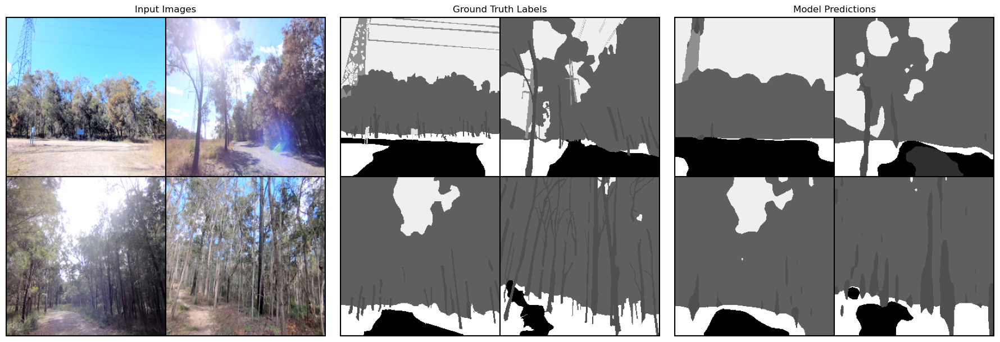

Epoch 4/10


Training:   1%|          | 1/103 [00:02<03:39,  2.15s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.41]

1


Training:   2%|▏         | 2/103 [00:04<03:37,  2.16s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.427]

1


Training:   3%|▎         | 3/103 [00:06<03:33,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.405]

1


Training:   4%|▍         | 4/103 [00:08<03:32,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.406]

1


Training:   5%|▍         | 5/103 [00:10<03:30,  2.15s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.417]

1


Training:   6%|▌         | 6/103 [00:12<03:29,  2.16s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.414]

1


Training:   7%|▋         | 7/103 [00:15<03:27,  2.16s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.416]

1


Training:   8%|▊         | 8/103 [00:17<03:24,  2.15s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.412]

1


Training:   9%|▊         | 9/103 [00:19<03:21,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.414]

1


Training:  10%|▉         | 10/103 [00:21<03:19,  2.15s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.415]

1


Training:  11%|█         | 11/103 [00:23<03:17,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.412]

1


Training:  12%|█▏        | 12/103 [00:25<03:15,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.412]

1


Training:  13%|█▎        | 13/103 [00:27<03:13,  2.15s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.411]

1


Training:  14%|█▎        | 14/103 [00:30<03:11,  2.15s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.41] 

1


Training:  15%|█▍        | 15/103 [00:32<03:10,  2.16s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.409]

1


Training:  16%|█▌        | 16/103 [00:34<03:08,  2.16s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.409]

1


Training:  17%|█▋        | 17/103 [00:36<03:05,  2.15s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.408]

1


Training:  17%|█▋        | 18/103 [00:38<03:02,  2.15s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.408]

1


Training:  18%|█▊        | 19/103 [00:40<03:00,  2.15s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.406]

1


Training:  19%|█▉        | 20/103 [00:42<02:57,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.404]

1


Training:  20%|██        | 21/103 [00:45<02:54,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.403]

1


Training:  21%|██▏       | 22/103 [00:47<02:51,  2.11s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.402]

1


Training:  22%|██▏       | 23/103 [00:49<02:49,  2.12s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.404]

1


Training:  23%|██▎       | 24/103 [00:51<02:48,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.409]

1


Training:  24%|██▍       | 25/103 [00:53<02:45,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.408]

1


Training:  25%|██▌       | 26/103 [00:55<02:44,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.407]

1


Training:  26%|██▌       | 27/103 [00:57<02:42,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.406]

1


Training:  27%|██▋       | 28/103 [00:59<02:39,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.405]

1


Training:  28%|██▊       | 29/103 [01:02<02:38,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.405]

1


Training:  29%|██▉       | 30/103 [01:04<02:36,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.406]

1


Training:  30%|███       | 31/103 [01:06<02:34,  2.15s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.407]

1


Training:  31%|███       | 32/103 [01:08<02:32,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.405]

1


Training:  32%|███▏      | 33/103 [01:10<02:29,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.405]

1


Training:  33%|███▎      | 34/103 [01:12<02:27,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.405]

1


Training:  34%|███▍      | 35/103 [01:14<02:25,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.405]

1


Training:  35%|███▍      | 36/103 [01:17<02:23,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.404]

1


Training:  36%|███▌      | 37/103 [01:19<02:21,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.404]

1


Training:  37%|███▋      | 38/103 [01:21<02:18,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.403]

1


Training:  38%|███▊      | 39/103 [01:23<02:16,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.403]

1


Training:  39%|███▉      | 40/103 [01:25<02:14,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.402]

1


Training:  40%|███▉      | 41/103 [01:27<02:12,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.402]

1


Training:  41%|████      | 42/103 [01:29<02:09,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.401]

1


Training:  42%|████▏     | 43/103 [01:32<02:08,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.401]

1


Training:  43%|████▎     | 44/103 [01:34<02:05,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.401]

1


Training:  44%|████▎     | 45/103 [01:36<02:03,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.402]

1


Training:  45%|████▍     | 46/103 [01:38<02:01,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.402]

1


Training:  46%|████▌     | 47/103 [01:40<01:59,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.402]

1


Training:  47%|████▋     | 48/103 [01:42<01:57,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.403]

1


Training:  48%|████▊     | 49/103 [01:44<01:55,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.402]

1


Training:  49%|████▊     | 50/103 [01:46<01:52,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.402]

1


Training:  50%|████▉     | 51/103 [01:49<01:51,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.401]

1


Training:  50%|█████     | 52/103 [01:51<01:48,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.401]

1


Training:  51%|█████▏    | 53/103 [01:53<01:46,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]  

1


Training:  52%|█████▏    | 54/103 [01:55<01:43,  2.12s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]

1


Training:  53%|█████▎    | 55/103 [01:57<01:41,  2.11s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.399]

1


Training:  54%|█████▍    | 56/103 [01:59<01:39,  2.12s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.399]

1


Training:  55%|█████▌    | 57/103 [02:01<01:37,  2.12s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.399]

1


Training:  56%|█████▋    | 58/103 [02:03<01:35,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.399]

1


Training:  57%|█████▋    | 59/103 [02:06<01:33,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.399]

1


Training:  58%|█████▊    | 60/103 [02:08<01:32,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]  

1


Training:  59%|█████▉    | 61/103 [02:10<01:29,  2.12s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]

1


Training:  60%|██████    | 62/103 [02:12<01:27,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.399]

1


Training:  61%|██████    | 63/103 [02:14<01:25,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]  

1


Training:  62%|██████▏   | 64/103 [02:16<01:23,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.399]

1


Training:  63%|██████▎   | 65/103 [02:18<01:21,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.399]

1


Training:  64%|██████▍   | 66/103 [02:20<01:18,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.398]

1


Training:  65%|██████▌   | 67/103 [02:23<01:16,  2.12s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.398]

1


Training:  66%|██████▌   | 68/103 [02:25<01:14,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.399]

1


Training:  67%|██████▋   | 69/103 [02:27<01:12,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.398]

1


Training:  68%|██████▊   | 70/103 [02:29<01:10,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.399]

1


Training:  69%|██████▉   | 71/103 [02:31<01:08,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.399]

1


Training:  70%|██████▉   | 72/103 [02:33<01:06,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]  

1


Training:  71%|███████   | 73/103 [02:35<01:03,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.401]

1


Training:  72%|███████▏  | 74/103 [02:38<01:01,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.401]

1


Training:  73%|███████▎  | 75/103 [02:40<00:59,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.401]

1


Training:  74%|███████▍  | 76/103 [02:42<00:57,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]  

1


Training:  75%|███████▍  | 77/103 [02:44<00:55,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]

1


Training:  76%|███████▌  | 78/103 [02:46<00:53,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]

1


Training:  77%|███████▋  | 79/103 [02:48<00:51,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.401]

1


Training:  78%|███████▊  | 80/103 [02:50<00:49,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.401]

1


Training:  79%|███████▊  | 81/103 [02:53<00:47,  2.16s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.402]

1


Training:  80%|███████▉  | 82/103 [02:55<00:45,  2.16s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.401]

1


Training:  81%|████████  | 83/103 [02:57<00:43,  2.16s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.401]

1


Training:  82%|████████▏ | 84/103 [02:59<00:40,  2.15s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.401]

1


Training:  83%|████████▎ | 85/103 [03:01<00:38,  2.15s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.401]

1


Training:  83%|████████▎ | 86/103 [03:03<00:36,  2.16s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.402]

1


Training:  84%|████████▍ | 87/103 [03:06<00:34,  2.17s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.401]

1


Training:  85%|████████▌ | 88/103 [03:08<00:32,  2.16s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.401]

1


Training:  86%|████████▋ | 89/103 [03:10<00:30,  2.15s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.401]

1


Training:  87%|████████▋ | 90/103 [03:12<00:27,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]  

1


Training:  88%|████████▊ | 91/103 [03:14<00:25,  2.15s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]

1


Training:  89%|████████▉ | 92/103 [03:16<00:23,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]

1


Training:  90%|█████████ | 93/103 [03:18<00:21,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]

1


Training:  91%|█████████▏| 94/103 [03:20<00:19,  2.12s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]

1


Training:  92%|█████████▏| 95/103 [03:23<00:17,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]

1


Training:  93%|█████████▎| 96/103 [03:25<00:14,  2.13s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]

1


Training:  94%|█████████▍| 97/103 [03:27<00:12,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]

1


Training:  95%|█████████▌| 98/103 [03:29<00:10,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]

1


Training:  96%|█████████▌| 99/103 [03:31<00:08,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]

1


Training:  97%|█████████▋| 100/103 [03:33<00:06,  2.16s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.401]

1


Training:  98%|█████████▊| 101/103 [03:35<00:04,  2.15s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]  

1


Training:  99%|█████████▉| 102/103 [03:38<00:02,  2.14s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]

1


Training: 100%|██████████| 103/103 [03:38<00:00,  2.12s/it, epoch=4, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.4]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:45<00:00,  2.06s/it, gpu_memory=6.15 GB, lr=0.0001, valid_loss=0.461]


Saved Best Model


compute_mIoU: 100%|██████████| 22/22 [00:45<00:00,  2.08s/it]


Validation metric:
mIoU: 30.23
mPA: 36.20
Accuracy: 82.53
plot valid image


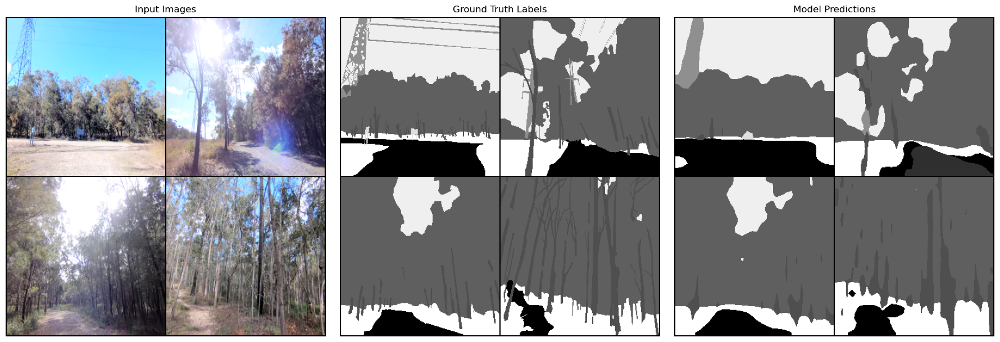

Epoch 5/10


Training:   1%|          | 1/103 [00:02<03:43,  2.19s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.378]

1


Training:   2%|▏         | 2/103 [00:04<03:29,  2.07s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.352]

1


Training:   3%|▎         | 3/103 [00:06<03:31,  2.11s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.35] 

1


Training:   4%|▍         | 4/103 [00:08<03:28,  2.11s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:   5%|▍         | 5/103 [00:10<03:26,  2.11s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.351]

1


Training:   6%|▌         | 6/103 [00:12<03:23,  2.10s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.348]

1


Training:   7%|▋         | 7/103 [00:14<03:22,  2.11s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.355]

1


Training:   8%|▊         | 8/103 [00:16<03:21,  2.12s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:   9%|▊         | 9/103 [00:19<03:19,  2.12s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.362]

1


Training:  10%|▉         | 10/103 [00:21<03:17,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  11%|█         | 11/103 [00:23<03:16,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.376]

1


Training:  12%|█▏        | 12/103 [00:25<03:13,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.376]

1


Training:  13%|█▎        | 13/103 [00:27<03:11,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.378]

1


Training:  14%|█▎        | 14/103 [00:29<03:09,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.375]

1


Training:  15%|█▍        | 15/103 [00:31<03:09,  2.15s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.376]

1


Training:  16%|█▌        | 16/103 [00:33<03:05,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.374]

1


Training:  17%|█▋        | 17/103 [00:36<03:03,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.374]

1


Training:  17%|█▋        | 18/103 [00:38<03:01,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.372]

1


Training:  18%|█▊        | 19/103 [00:40<02:58,  2.12s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.371]

1


Training:  19%|█▉        | 20/103 [00:42<02:55,  2.11s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  20%|██        | 21/103 [00:44<02:53,  2.11s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37] 

1


Training:  21%|██▏       | 22/103 [00:46<02:51,  2.12s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.371]

1


Training:  22%|██▏       | 23/103 [00:48<02:50,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.371]

1


Training:  23%|██▎       | 24/103 [00:50<02:47,  2.12s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.371]

1


Training:  24%|██▍       | 25/103 [00:53<02:46,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37] 

1


Training:  25%|██▌       | 26/103 [00:55<02:43,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.371]

1


Training:  26%|██▌       | 27/103 [00:57<02:42,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.372]

1


Training:  27%|██▋       | 28/103 [00:59<02:40,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  28%|██▊       | 29/103 [01:01<02:39,  2.15s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  29%|██▉       | 30/103 [01:03<02:36,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  30%|███       | 31/103 [01:05<02:34,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  31%|███       | 32/103 [01:07<02:30,  2.11s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.372]

1


Training:  32%|███▏      | 33/103 [01:10<02:28,  2.12s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.371]

1


Training:  33%|███▎      | 34/103 [01:12<02:27,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37] 

1


Training:  34%|███▍      | 35/103 [01:14<02:26,  2.15s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37]

1


Training:  35%|███▍      | 36/103 [01:16<02:21,  2.12s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37]

1


Training:  36%|███▌      | 37/103 [01:18<02:19,  2.12s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.369]

1


Training:  37%|███▋      | 38/103 [01:20<02:18,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37] 

1


Training:  38%|███▊      | 39/103 [01:22<02:16,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37]

1


Training:  39%|███▉      | 40/103 [01:25<02:14,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37]

1


Training:  40%|███▉      | 41/103 [01:27<02:12,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.371]

1


Training:  41%|████      | 42/103 [01:29<02:10,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37] 

1


Training:  42%|████▏     | 43/103 [01:31<02:07,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.369]

1


Training:  43%|████▎     | 44/103 [01:33<02:05,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.368]

1


Training:  44%|████▎     | 45/103 [01:35<02:03,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.368]

1


Training:  45%|████▍     | 46/103 [01:37<02:01,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.369]

1


Training:  46%|████▌     | 47/103 [01:40<01:59,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.369]

1


Training:  47%|████▋     | 48/103 [01:42<01:57,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37] 

1


Training:  48%|████▊     | 49/103 [01:44<01:54,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.369]

1


Training:  49%|████▊     | 50/103 [01:46<01:53,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.369]

1


Training:  50%|████▉     | 51/103 [01:48<01:50,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.369]

1


Training:  50%|█████     | 52/103 [01:50<01:48,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.369]

1


Training:  51%|█████▏    | 53/103 [01:52<01:46,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.369]

1


Training:  52%|█████▏    | 54/103 [01:54<01:44,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.369]

1


Training:  53%|█████▎    | 55/103 [01:57<01:42,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.369]

1


Training:  54%|█████▍    | 56/103 [01:59<01:40,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37] 

1


Training:  55%|█████▌    | 57/103 [02:01<01:38,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37]

1


Training:  56%|█████▋    | 58/103 [02:03<01:36,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37]

1


Training:  57%|█████▋    | 59/103 [02:05<01:33,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37]

1


Training:  58%|█████▊    | 60/103 [02:07<01:31,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37]

1


Training:  59%|█████▉    | 61/103 [02:09<01:29,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37]

1


Training:  60%|██████    | 62/103 [02:11<01:26,  2.11s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37]

1


Training:  61%|██████    | 63/103 [02:14<01:24,  2.12s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37]

1


Training:  62%|██████▏   | 64/103 [02:16<01:23,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37]

1


Training:  63%|██████▎   | 65/103 [02:18<01:20,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.37]

1


Training:  64%|██████▍   | 66/103 [02:20<01:18,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.372]

1


Training:  65%|██████▌   | 67/103 [02:22<01:16,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.371]

1


Training:  66%|██████▌   | 68/103 [02:24<01:14,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.372]

1


Training:  67%|██████▋   | 69/103 [02:26<01:12,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.372]

1


Training:  68%|██████▊   | 70/103 [02:29<01:10,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.372]

1


Training:  69%|██████▉   | 71/103 [02:31<01:07,  2.12s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.372]

1


Training:  70%|██████▉   | 72/103 [02:33<01:05,  2.12s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  71%|███████   | 73/103 [02:35<01:03,  2.11s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.372]

1


Training:  72%|███████▏  | 74/103 [02:37<01:01,  2.12s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.372]

1


Training:  73%|███████▎  | 75/103 [02:39<00:59,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.372]

1


Training:  74%|███████▍  | 76/103 [02:41<00:57,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.371]

1


Training:  75%|███████▍  | 77/103 [02:43<00:55,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.371]

1


Training:  76%|███████▌  | 78/103 [02:46<00:53,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.371]

1


Training:  77%|███████▋  | 79/103 [02:48<00:51,  2.15s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.371]

1


Training:  78%|███████▊  | 80/103 [02:50<00:49,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.371]

1


Training:  79%|███████▊  | 81/103 [02:52<00:47,  2.15s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.372]

1


Training:  80%|███████▉  | 82/103 [02:54<00:45,  2.15s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.372]

1


Training:  81%|████████  | 83/103 [02:56<00:43,  2.15s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  82%|████████▏ | 84/103 [02:58<00:40,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  83%|████████▎ | 85/103 [03:01<00:38,  2.15s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  83%|████████▎ | 86/103 [03:03<00:36,  2.15s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  84%|████████▍ | 87/103 [03:05<00:34,  2.18s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  85%|████████▌ | 88/103 [03:07<00:32,  2.17s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.374]

1


Training:  86%|████████▋ | 89/103 [03:09<00:30,  2.16s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.374]

1


Training:  87%|████████▋ | 90/103 [03:11<00:27,  2.15s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  88%|████████▊ | 91/103 [03:13<00:25,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.374]

1


Training:  89%|████████▉ | 92/103 [03:16<00:23,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  90%|█████████ | 93/103 [03:18<00:21,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  91%|█████████▏| 94/103 [03:20<00:19,  2.16s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.374]

1


Training:  92%|█████████▏| 95/103 [03:22<00:17,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.374]

1


Training:  93%|█████████▎| 96/103 [03:24<00:14,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  94%|█████████▍| 97/103 [03:26<00:12,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  95%|█████████▌| 98/103 [03:28<00:10,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  96%|█████████▌| 99/103 [03:31<00:08,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.373]

1


Training:  97%|█████████▋| 100/103 [03:33<00:06,  2.13s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.374]

1


Training:  98%|█████████▊| 101/103 [03:35<00:04,  2.14s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.374]

1


Training:  99%|█████████▉| 102/103 [03:37<00:02,  2.18s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.374]

1


Training: 100%|██████████| 103/103 [03:38<00:00,  2.12s/it, epoch=5, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.374]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:45<00:00,  2.06s/it, gpu_memory=6.15 GB, lr=0.0001, valid_loss=0.478]


Epoch 6/10


Training:   1%|          | 1/103 [00:02<03:51,  2.26s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.35]

1


Training:   2%|▏         | 2/103 [00:04<03:30,  2.08s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:   3%|▎         | 3/103 [00:06<03:27,  2.07s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.355]

1


Training:   4%|▍         | 4/103 [00:08<03:25,  2.08s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.354]

1


Training:   5%|▍         | 5/103 [00:10<03:26,  2.11s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.356]

1


Training:   6%|▌         | 6/103 [00:12<03:26,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.359]

1


Training:   7%|▋         | 7/103 [00:14<03:24,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:   8%|▊         | 8/103 [00:16<03:23,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.356]

1


Training:   9%|▊         | 9/103 [00:19<03:21,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.354]

1


Training:  10%|▉         | 10/103 [00:21<03:17,  2.12s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.352]

1


Training:  11%|█         | 11/103 [00:23<03:16,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.356]

1


Training:  12%|█▏        | 12/103 [00:25<03:14,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  13%|█▎        | 13/103 [00:27<03:11,  2.12s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.354]

1


Training:  14%|█▎        | 14/103 [00:29<03:09,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.355]

1


Training:  15%|█▍        | 15/103 [00:31<03:07,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.353]

1


Training:  16%|█▌        | 16/103 [00:34<03:09,  2.17s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.352]

1


Training:  17%|█▋        | 17/103 [00:36<03:07,  2.18s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.351]

1


Training:  17%|█▋        | 18/103 [00:38<03:04,  2.17s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.352]

1


Training:  18%|█▊        | 19/103 [00:40<03:00,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.353]

1


Training:  19%|█▉        | 20/103 [00:42<02:58,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.352]

1


Training:  20%|██        | 21/103 [00:44<02:56,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.352]

1


Training:  21%|██▏       | 22/103 [00:47<02:54,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.353]

1


Training:  22%|██▏       | 23/103 [00:49<02:51,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.351]

1


Training:  23%|██▎       | 24/103 [00:51<02:50,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.352]

1


Training:  24%|██▍       | 25/103 [00:53<02:47,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.352]

1


Training:  25%|██▌       | 26/103 [00:55<02:44,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.352]

1


Training:  26%|██▌       | 27/103 [00:57<02:42,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.352]

1


Training:  27%|██▋       | 28/103 [00:59<02:41,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.351]

1


Training:  28%|██▊       | 29/103 [01:02<02:38,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.351]

1


Training:  29%|██▉       | 30/103 [01:04<02:35,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.354]

1


Training:  30%|███       | 31/103 [01:06<02:34,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.355]

1


Training:  31%|███       | 32/103 [01:08<02:30,  2.12s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.356]

1


Training:  32%|███▏      | 33/103 [01:10<02:28,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.355]

1


Training:  33%|███▎      | 34/103 [01:12<02:27,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.356]

1


Training:  34%|███▍      | 35/103 [01:14<02:24,  2.12s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.356]

1


Training:  35%|███▍      | 36/103 [01:16<02:22,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.356]

1


Training:  36%|███▌      | 37/103 [01:19<02:21,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.356]

1


Training:  37%|███▋      | 38/103 [01:21<02:21,  2.17s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.356]

1


Training:  38%|███▊      | 39/103 [01:23<02:19,  2.18s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.356]

1


Training:  39%|███▉      | 40/103 [01:25<02:16,  2.17s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  40%|███▉      | 41/103 [01:27<02:13,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  41%|████      | 42/103 [01:29<02:10,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  42%|████▏     | 43/103 [01:31<02:07,  2.12s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  43%|████▎     | 44/103 [01:34<02:05,  2.12s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  44%|████▎     | 45/103 [01:36<02:03,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  45%|████▍     | 46/103 [01:38<02:01,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  46%|████▌     | 47/103 [01:40<01:59,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  47%|████▋     | 48/103 [01:42<01:57,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  48%|████▊     | 49/103 [01:44<01:54,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  49%|████▊     | 50/103 [01:46<01:53,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  50%|████▉     | 51/103 [01:49<01:50,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  50%|█████     | 52/103 [01:51<01:48,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  51%|█████▏    | 53/103 [01:53<01:47,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.359]

1


Training:  52%|█████▏    | 54/103 [01:55<01:44,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.359]

1


Training:  53%|█████▎    | 55/103 [01:57<01:42,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.359]

1


Training:  54%|█████▍    | 56/103 [01:59<01:39,  2.12s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.359]

1


Training:  55%|█████▌    | 57/103 [02:01<01:37,  2.12s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  56%|█████▋    | 58/103 [02:03<01:35,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.359]

1


Training:  57%|█████▋    | 59/103 [02:06<01:34,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.359]

1


Training:  58%|█████▊    | 60/103 [02:08<01:31,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  59%|█████▉    | 61/103 [02:10<01:29,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  60%|██████    | 62/103 [02:12<01:27,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.359]

1


Training:  61%|██████    | 63/103 [02:14<01:25,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  62%|██████▏   | 64/103 [02:16<01:23,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  63%|██████▎   | 65/103 [02:18<01:21,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  64%|██████▍   | 66/103 [02:21<01:19,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  65%|██████▌   | 67/103 [02:23<01:17,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  66%|██████▌   | 68/103 [02:25<01:15,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  67%|██████▋   | 69/103 [02:27<01:13,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  68%|██████▊   | 70/103 [02:29<01:10,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  69%|██████▉   | 71/103 [02:31<01:08,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  70%|██████▉   | 72/103 [02:34<01:07,  2.18s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  71%|███████   | 73/103 [02:36<01:04,  2.16s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.359]

1


Training:  72%|███████▏  | 74/103 [02:38<01:02,  2.16s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  73%|███████▎  | 75/103 [02:40<01:00,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  74%|███████▍  | 76/103 [02:42<00:58,  2.16s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  75%|███████▍  | 77/103 [02:44<00:55,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  76%|███████▌  | 78/103 [02:46<00:53,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  77%|███████▋  | 79/103 [02:49<00:51,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  78%|███████▊  | 80/103 [02:51<00:49,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  79%|███████▊  | 81/103 [02:53<00:47,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  80%|███████▉  | 82/103 [02:55<00:45,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  81%|████████  | 83/103 [02:57<00:42,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  82%|████████▏ | 84/103 [02:59<00:40,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  83%|████████▎ | 85/103 [03:02<00:38,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  83%|████████▎ | 86/103 [03:04<00:36,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  84%|████████▍ | 87/103 [03:06<00:34,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  85%|████████▌ | 88/103 [03:08<00:32,  2.16s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  86%|████████▋ | 89/103 [03:10<00:30,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  87%|████████▋ | 90/103 [03:12<00:27,  2.15s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  88%|████████▊ | 91/103 [03:14<00:25,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  89%|████████▉ | 92/103 [03:17<00:23,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  90%|█████████ | 93/103 [03:19<00:21,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  91%|█████████▏| 94/103 [03:21<00:19,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.358]

1


Training:  92%|█████████▏| 95/103 [03:23<00:17,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  93%|█████████▎| 96/103 [03:25<00:14,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.357]

1


Training:  94%|█████████▍| 97/103 [03:27<00:12,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.356]

1


Training:  95%|█████████▌| 98/103 [03:29<00:10,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.356]

1


Training:  96%|█████████▌| 99/103 [03:32<00:08,  2.14s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.356]

1


Training:  97%|█████████▋| 100/103 [03:34<00:06,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.356]

1


Training:  98%|█████████▊| 101/103 [03:36<00:04,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.356]

1


Training:  99%|█████████▉| 102/103 [03:38<00:02,  2.12s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.356]

1


Training: 100%|██████████| 103/103 [03:38<00:00,  2.13s/it, epoch=6, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.356]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:45<00:00,  2.05s/it, gpu_memory=6.15 GB, lr=0.0001, valid_loss=0.472]


Epoch 7/10


Training:   1%|          | 1/103 [00:02<03:36,  2.12s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.317]

1


Training:   2%|▏         | 2/103 [00:04<03:35,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.321]

1


Training:   3%|▎         | 3/103 [00:06<03:34,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.333]

1


Training:   4%|▍         | 4/103 [00:08<03:30,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.333]

1


Training:   5%|▍         | 5/103 [00:10<03:28,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.332]

1


Training:   6%|▌         | 6/103 [00:12<03:26,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.329]

1


Training:   7%|▋         | 7/103 [00:14<03:25,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.329]

1


Training:   8%|▊         | 8/103 [00:17<03:21,  2.12s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:   9%|▊         | 9/103 [00:19<03:19,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  10%|▉         | 10/103 [00:21<03:18,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  11%|█         | 11/103 [00:23<03:12,  2.10s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.323]

1


Training:  12%|█▏        | 12/103 [00:25<03:11,  2.10s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  13%|█▎        | 13/103 [00:27<03:10,  2.11s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  14%|█▎        | 14/103 [00:29<03:08,  2.12s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  15%|█▍        | 15/103 [00:31<03:10,  2.17s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.329]

1


Training:  16%|█▌        | 16/103 [00:34<03:08,  2.17s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.33] 

1


Training:  17%|█▋        | 17/103 [00:36<03:05,  2.15s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.329]

1


Training:  17%|█▋        | 18/103 [00:38<03:01,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  18%|█▊        | 19/103 [00:40<02:59,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.324]

1


Training:  19%|█▉        | 20/103 [00:42<02:57,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.324]

1


Training:  20%|██        | 21/103 [00:44<02:55,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.325]

1


Training:  21%|██▏       | 22/103 [00:46<02:52,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.324]

1


Training:  22%|██▏       | 23/103 [00:49<02:50,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.325]

1


Training:  23%|██▎       | 24/103 [00:51<02:48,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.325]

1


Training:  24%|██▍       | 25/103 [00:53<02:48,  2.16s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  25%|██▌       | 26/103 [00:55<02:45,  2.15s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  26%|██▌       | 27/103 [00:57<02:42,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.325]

1


Training:  27%|██▋       | 28/103 [00:59<02:40,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.325]

1


Training:  28%|██▊       | 29/103 [01:01<02:38,  2.15s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  29%|██▉       | 30/103 [01:04<02:35,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  30%|███       | 31/103 [01:06<02:33,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  31%|███       | 32/103 [01:08<02:31,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  32%|███▏      | 33/103 [01:10<02:29,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  33%|███▎      | 34/103 [01:12<02:27,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  34%|███▍      | 35/103 [01:14<02:25,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  35%|███▍      | 36/103 [01:16<02:25,  2.18s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.325]

1


Training:  36%|███▌      | 37/103 [01:19<02:23,  2.17s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  37%|███▋      | 38/103 [01:21<02:20,  2.16s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  38%|███▊      | 39/103 [01:23<02:18,  2.16s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  39%|███▉      | 40/103 [01:25<02:15,  2.16s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  40%|███▉      | 41/103 [01:27<02:14,  2.17s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  41%|████      | 42/103 [01:29<02:12,  2.18s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  42%|████▏     | 43/103 [01:32<02:10,  2.18s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  43%|████▎     | 44/103 [01:34<02:07,  2.17s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  44%|████▎     | 45/103 [01:36<02:05,  2.16s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  45%|████▍     | 46/103 [01:38<02:02,  2.15s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  46%|████▌     | 47/103 [01:40<02:00,  2.15s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  47%|████▋     | 48/103 [01:42<01:57,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.325]

1


Training:  48%|████▊     | 49/103 [01:44<01:55,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  49%|████▊     | 50/103 [01:47<01:52,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  50%|████▉     | 51/103 [01:49<01:51,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  50%|█████     | 52/103 [01:51<01:48,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  51%|█████▏    | 53/103 [01:53<01:46,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  52%|█████▏    | 54/103 [01:55<01:44,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.325]

1


Training:  53%|█████▎    | 55/103 [01:57<01:42,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.325]

1


Training:  54%|█████▍    | 56/103 [01:59<01:40,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.325]

1


Training:  55%|█████▌    | 57/103 [02:02<01:38,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.325]

1


Training:  56%|█████▋    | 58/103 [02:04<01:36,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.325]

1


Training:  57%|█████▋    | 59/103 [02:06<01:34,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  58%|█████▊    | 60/103 [02:08<01:31,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  59%|█████▉    | 61/103 [02:10<01:29,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  60%|██████    | 62/103 [02:12<01:27,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  61%|██████    | 63/103 [02:14<01:25,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  62%|██████▏   | 64/103 [02:16<01:22,  2.12s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  63%|██████▎   | 65/103 [02:19<01:21,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  64%|██████▍   | 66/103 [02:21<01:18,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  65%|██████▌   | 67/103 [02:23<01:16,  2.12s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  66%|██████▌   | 68/103 [02:25<01:14,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  67%|██████▋   | 69/103 [02:27<01:12,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  68%|██████▊   | 70/103 [02:29<01:10,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.326]

1


Training:  69%|██████▉   | 71/103 [02:31<01:07,  2.11s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  70%|██████▉   | 72/103 [02:33<01:05,  2.11s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  71%|███████   | 73/103 [02:35<01:03,  2.10s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  72%|███████▏  | 74/103 [02:38<01:01,  2.12s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  73%|███████▎  | 75/103 [02:40<00:59,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  74%|███████▍  | 76/103 [02:42<00:57,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  75%|███████▍  | 77/103 [02:44<00:55,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  76%|███████▌  | 78/103 [02:46<00:53,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  77%|███████▋  | 79/103 [02:48<00:51,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  78%|███████▊  | 80/103 [02:50<00:49,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  79%|███████▊  | 81/103 [02:53<00:46,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  80%|███████▉  | 82/103 [02:55<00:44,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  81%|████████  | 83/103 [02:57<00:42,  2.12s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  82%|████████▏ | 84/103 [02:59<00:40,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  83%|████████▎ | 85/103 [03:01<00:38,  2.11s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  83%|████████▎ | 86/103 [03:03<00:36,  2.12s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  84%|████████▍ | 87/103 [03:05<00:33,  2.12s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  85%|████████▌ | 88/103 [03:07<00:31,  2.11s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  86%|████████▋ | 89/103 [03:10<00:29,  2.12s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  87%|████████▋ | 90/103 [03:12<00:27,  2.12s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  88%|████████▊ | 91/103 [03:14<00:25,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  89%|████████▉ | 92/103 [03:16<00:23,  2.15s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  90%|█████████ | 93/103 [03:18<00:21,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  91%|█████████▏| 94/103 [03:20<00:19,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  92%|█████████▏| 95/103 [03:22<00:17,  2.15s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  93%|█████████▎| 96/103 [03:25<00:14,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.327]

1


Training:  94%|█████████▍| 97/103 [03:27<00:12,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  95%|█████████▌| 98/103 [03:29<00:10,  2.14s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  96%|█████████▌| 99/103 [03:31<00:08,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  97%|█████████▋| 100/103 [03:33<00:06,  2.13s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  98%|█████████▊| 101/103 [03:35<00:04,  2.12s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.328]

1


Training:  99%|█████████▉| 102/103 [03:37<00:02,  2.11s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.329]

1


Training: 100%|██████████| 103/103 [03:38<00:00,  2.12s/it, epoch=7, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.329]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:45<00:00,  2.08s/it, gpu_memory=6.15 GB, lr=0.0001, valid_loss=0.489]


Epoch 8/10


Training:   1%|          | 1/103 [00:02<03:58,  2.34s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.317]

1


Training:   2%|▏         | 2/103 [00:04<03:38,  2.16s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.303]

1


Training:   3%|▎         | 3/103 [00:06<03:34,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.316]

1


Training:   4%|▍         | 4/103 [00:08<03:31,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.319]

1


Training:   5%|▍         | 5/103 [00:10<03:29,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.313]

1


Training:   6%|▌         | 6/103 [00:12<03:26,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.308]

1


Training:   7%|▋         | 7/103 [00:15<03:25,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.306]

1


Training:   8%|▊         | 8/103 [00:17<03:23,  2.15s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.304]

1


Training:   9%|▊         | 9/103 [00:19<03:19,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]  

1


Training:  10%|▉         | 10/103 [00:21<03:18,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.301]

1


Training:  11%|█         | 11/103 [00:23<03:16,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.302]

1


Training:  12%|█▏        | 12/103 [00:25<03:13,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.306]

1


Training:  13%|█▎        | 13/103 [00:27<03:11,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.309]

1


Training:  14%|█▎        | 14/103 [00:29<03:07,  2.11s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.311]

1


Training:  15%|█▍        | 15/103 [00:32<03:07,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.311]

1


Training:  16%|█▌        | 16/103 [00:34<03:05,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.31] 

1


Training:  17%|█▋        | 17/103 [00:36<03:02,  2.12s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.312]

1


Training:  17%|█▋        | 18/103 [00:38<03:00,  2.12s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.312]

1


Training:  18%|█▊        | 19/103 [00:40<02:59,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.313]

1


Training:  19%|█▉        | 20/103 [00:42<02:56,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.313]

1


Training:  20%|██        | 21/103 [00:44<02:55,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.313]

1


Training:  21%|██▏       | 22/103 [00:46<02:52,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.313]

1


Training:  22%|██▏       | 23/103 [00:49<02:51,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.312]

1


Training:  23%|██▎       | 24/103 [00:51<02:48,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.311]

1


Training:  24%|██▍       | 25/103 [00:53<02:46,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.312]

1


Training:  25%|██▌       | 26/103 [00:55<02:43,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.311]

1


Training:  26%|██▌       | 27/103 [00:57<02:41,  2.12s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.312]

1


Training:  27%|██▋       | 28/103 [00:59<02:39,  2.12s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.311]

1


Training:  28%|██▊       | 29/103 [01:01<02:37,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.312]

1


Training:  29%|██▉       | 30/103 [01:04<02:35,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.312]

1


Training:  30%|███       | 31/103 [01:06<02:35,  2.16s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.312]

1


Training:  31%|███       | 32/103 [01:08<02:33,  2.16s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.313]

1


Training:  32%|███▏      | 33/103 [01:10<02:32,  2.17s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.313]

1


Training:  33%|███▎      | 34/103 [01:12<02:29,  2.16s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  34%|███▍      | 35/103 [01:14<02:26,  2.16s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  35%|███▍      | 36/103 [01:17<02:24,  2.15s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  36%|███▌      | 37/103 [01:19<02:21,  2.15s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  37%|███▋      | 38/103 [01:21<02:19,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  38%|███▊      | 39/103 [01:23<02:17,  2.15s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  39%|███▉      | 40/103 [01:25<02:15,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  40%|███▉      | 41/103 [01:27<02:11,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  41%|████      | 42/103 [01:29<02:09,  2.12s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  42%|████▏     | 43/103 [01:31<02:07,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.316]

1


Training:  43%|████▎     | 44/103 [01:34<02:05,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.316]

1


Training:  44%|████▎     | 45/103 [01:36<02:02,  2.11s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  45%|████▍     | 46/103 [01:38<02:00,  2.11s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  46%|████▌     | 47/103 [01:40<01:59,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  47%|████▋     | 48/103 [01:42<01:58,  2.15s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  48%|████▊     | 49/103 [01:44<01:54,  2.12s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  49%|████▊     | 50/103 [01:46<01:53,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  50%|████▉     | 51/103 [01:48<01:50,  2.12s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  50%|█████     | 52/103 [01:51<01:48,  2.12s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.316]

1


Training:  51%|█████▏    | 53/103 [01:53<01:46,  2.12s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  52%|█████▏    | 54/103 [01:55<01:44,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  53%|█████▎    | 55/103 [01:57<01:42,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  54%|█████▍    | 56/103 [01:59<01:40,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  55%|█████▌    | 57/103 [02:01<01:38,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  56%|█████▋    | 58/103 [02:03<01:35,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.316]

1


Training:  57%|█████▋    | 59/103 [02:06<01:34,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.317]

1


Training:  58%|█████▊    | 60/103 [02:08<01:31,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.317]

1


Training:  59%|█████▉    | 61/103 [02:10<01:29,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.317]

1


Training:  60%|██████    | 62/103 [02:12<01:27,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.317]

1


Training:  61%|██████    | 63/103 [02:14<01:25,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.317]

1


Training:  62%|██████▏   | 64/103 [02:16<01:23,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.317]

1


Training:  63%|██████▎   | 65/103 [02:18<01:20,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.317]

1


Training:  64%|██████▍   | 66/103 [02:20<01:18,  2.11s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.317]

1


Training:  65%|██████▌   | 67/103 [02:23<01:16,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.317]

1


Training:  66%|██████▌   | 68/103 [02:25<01:14,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.316]

1


Training:  67%|██████▋   | 69/103 [02:27<01:12,  2.12s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.316]

1


Training:  68%|██████▊   | 70/103 [02:29<01:09,  2.10s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.316]

1


Training:  69%|██████▉   | 71/103 [02:31<01:07,  2.12s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.316]

1


Training:  70%|██████▉   | 72/103 [02:33<01:05,  2.12s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.316]

1


Training:  71%|███████   | 73/103 [02:35<01:03,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.316]

1


Training:  72%|███████▏  | 74/103 [02:37<01:01,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.316]

1


Training:  73%|███████▎  | 75/103 [02:39<00:59,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  74%|███████▍  | 76/103 [02:42<00:57,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  75%|███████▍  | 77/103 [02:44<00:55,  2.12s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  76%|███████▌  | 78/103 [02:46<00:53,  2.12s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  77%|███████▋  | 79/103 [02:48<00:50,  2.11s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  78%|███████▊  | 80/103 [02:50<00:48,  2.11s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  79%|███████▊  | 81/103 [02:52<00:47,  2.15s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  80%|███████▉  | 82/103 [02:54<00:45,  2.15s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  81%|████████  | 83/103 [02:57<00:42,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  82%|████████▏ | 84/103 [02:59<00:43,  2.27s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  83%|████████▎ | 85/103 [03:01<00:40,  2.23s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  83%|████████▎ | 86/103 [03:03<00:37,  2.20s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  84%|████████▍ | 87/103 [03:06<00:34,  2.19s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  85%|████████▌ | 88/103 [03:08<00:32,  2.17s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  86%|████████▋ | 89/103 [03:10<00:30,  2.17s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.315]

1


Training:  87%|████████▋ | 90/103 [03:12<00:28,  2.16s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  88%|████████▊ | 91/103 [03:14<00:25,  2.16s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  89%|████████▉ | 92/103 [03:16<00:23,  2.15s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  90%|█████████ | 93/103 [03:18<00:21,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  91%|█████████▏| 94/103 [03:20<00:19,  2.12s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  92%|█████████▏| 95/103 [03:23<00:17,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  93%|█████████▎| 96/103 [03:25<00:14,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  94%|█████████▍| 97/103 [03:27<00:12,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  95%|█████████▌| 98/103 [03:29<00:10,  2.15s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  96%|█████████▌| 99/103 [03:31<00:08,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  97%|█████████▋| 100/103 [03:33<00:06,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.313]

1


Training:  98%|█████████▊| 101/103 [03:35<00:04,  2.14s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training:  99%|█████████▉| 102/103 [03:38<00:02,  2.13s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]

1


Training: 100%|██████████| 103/103 [03:38<00:00,  2.12s/it, epoch=8, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.314]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:45<00:00,  2.07s/it, gpu_memory=6.15 GB, lr=0.0001, valid_loss=0.481]


Epoch 9/10


Training:   1%|          | 1/103 [00:02<03:52,  2.27s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.276]

1


Training:   2%|▏         | 2/103 [00:04<03:38,  2.16s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:   3%|▎         | 3/103 [00:06<03:35,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.294]

1


Training:   4%|▍         | 4/103 [00:08<03:33,  2.16s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.297]

1


Training:   5%|▍         | 5/103 [00:10<03:30,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.296]

1


Training:   6%|▌         | 6/103 [00:12<03:27,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.292]

1


Training:   7%|▋         | 7/103 [00:15<03:25,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.29] 

1


Training:   8%|▊         | 8/103 [00:17<03:22,  2.13s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.29]

1


Training:   9%|▊         | 9/103 [00:19<03:18,  2.11s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.291]

1


Training:  10%|▉         | 10/103 [00:21<03:17,  2.13s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  11%|█         | 11/103 [00:23<03:16,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.292]

1


Training:  12%|█▏        | 12/103 [00:25<03:14,  2.13s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.292]

1


Training:  13%|█▎        | 13/103 [00:27<03:12,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  14%|█▎        | 14/103 [00:29<03:10,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.295]

1


Training:  15%|█▍        | 15/103 [00:32<03:08,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.295]

1


Training:  16%|█▌        | 16/103 [00:34<03:06,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.295]

1


Training:  17%|█▋        | 17/103 [00:36<03:04,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.295]

1


Training:  17%|█▋        | 18/103 [00:38<03:00,  2.13s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.294]

1


Training:  18%|█▊        | 19/103 [00:40<02:58,  2.13s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.292]

1


Training:  19%|█▉        | 20/103 [00:42<02:56,  2.13s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.291]

1


Training:  20%|██        | 21/103 [00:44<02:56,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  21%|██▏       | 22/103 [00:47<02:53,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.291]

1


Training:  22%|██▏       | 23/103 [00:49<02:51,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  23%|██▎       | 24/103 [00:51<02:49,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  24%|██▍       | 25/103 [00:53<02:46,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  25%|██▌       | 26/103 [00:55<02:44,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.295]

1


Training:  26%|██▌       | 27/103 [00:57<02:41,  2.13s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.296]

1


Training:  27%|██▋       | 28/103 [00:59<02:39,  2.13s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.296]

1


Training:  28%|██▊       | 29/103 [01:01<02:37,  2.12s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.297]

1


Training:  29%|██▉       | 30/103 [01:04<02:34,  2.12s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.296]

1


Training:  30%|███       | 31/103 [01:06<02:32,  2.12s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.296]

1


Training:  31%|███       | 32/103 [01:08<02:31,  2.13s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.296]

1


Training:  32%|███▏      | 33/103 [01:10<02:30,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.297]

1


Training:  33%|███▎      | 34/103 [01:12<02:28,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.297]

1


Training:  34%|███▍      | 35/103 [01:14<02:25,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:  35%|███▍      | 36/103 [01:17<02:24,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.297]

1


Training:  36%|███▌      | 37/103 [01:19<02:22,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:  37%|███▋      | 38/103 [01:21<02:20,  2.16s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:  38%|███▊      | 39/103 [01:23<02:16,  2.13s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:  39%|███▉      | 40/103 [01:25<02:14,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:  40%|███▉      | 41/103 [01:27<02:13,  2.16s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  41%|████      | 42/103 [01:29<02:12,  2.17s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]  

1


Training:  42%|████▏     | 43/103 [01:32<02:10,  2.18s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  43%|████▎     | 44/103 [01:34<02:07,  2.17s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:  44%|████▎     | 45/103 [01:36<02:04,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  45%|████▍     | 46/103 [01:38<02:02,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  46%|████▌     | 47/103 [01:40<01:59,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:  47%|████▋     | 48/103 [01:42<01:57,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:  48%|████▊     | 49/103 [01:44<01:55,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:  49%|████▊     | 50/103 [01:47<01:53,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:  50%|████▉     | 51/103 [01:49<01:50,  2.13s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:  50%|█████     | 52/103 [01:51<01:48,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:  51%|█████▏    | 53/103 [01:53<01:46,  2.13s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:  52%|█████▏    | 54/103 [01:55<01:44,  2.12s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:  53%|█████▎    | 55/103 [01:57<01:41,  2.12s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:  54%|█████▍    | 56/103 [01:59<01:39,  2.12s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:  55%|█████▌    | 57/103 [02:01<01:37,  2.13s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  56%|█████▋    | 58/103 [02:04<01:36,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  57%|█████▋    | 59/103 [02:06<01:35,  2.16s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  58%|█████▊    | 60/103 [02:08<01:33,  2.17s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  59%|█████▉    | 61/103 [02:10<01:30,  2.16s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]  

1


Training:  60%|██████    | 62/103 [02:12<01:27,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  61%|██████    | 63/103 [02:14<01:25,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  62%|██████▏   | 64/103 [02:17<01:23,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  63%|██████▎   | 65/103 [02:19<01:21,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  64%|██████▍   | 66/103 [02:21<01:19,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  65%|██████▌   | 67/103 [02:23<01:17,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  66%|██████▌   | 68/103 [02:25<01:14,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]  

1


Training:  67%|██████▋   | 69/103 [02:27<01:12,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  68%|██████▊   | 70/103 [02:29<01:10,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]  

1


Training:  69%|██████▉   | 71/103 [02:32<01:09,  2.18s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  70%|██████▉   | 72/103 [02:34<01:07,  2.18s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  71%|███████   | 73/103 [02:36<01:04,  2.16s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  72%|███████▏  | 74/103 [02:38<01:02,  2.16s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  73%|███████▎  | 75/103 [02:40<01:00,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  74%|███████▍  | 76/103 [02:42<00:57,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  75%|███████▍  | 77/103 [02:45<00:55,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  76%|███████▌  | 78/103 [02:47<00:53,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  77%|███████▋  | 79/103 [02:49<00:51,  2.16s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  78%|███████▊  | 80/103 [02:51<00:49,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  79%|███████▊  | 81/103 [02:53<00:47,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  80%|███████▉  | 82/103 [02:55<00:44,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  81%|████████  | 83/103 [02:57<00:43,  2.16s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  82%|████████▏ | 84/103 [03:00<00:41,  2.17s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:  83%|████████▎ | 85/103 [03:02<00:38,  2.16s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.301]

1


Training:  83%|████████▎ | 86/103 [03:04<00:36,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.301]

1


Training:  84%|████████▍ | 87/103 [03:06<00:34,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]  

1


Training:  85%|████████▌ | 88/103 [03:08<00:32,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  86%|████████▋ | 89/103 [03:10<00:30,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  87%|████████▋ | 90/103 [03:12<00:27,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  88%|████████▊ | 91/103 [03:15<00:25,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  89%|████████▉ | 92/103 [03:17<00:23,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  90%|█████████ | 93/103 [03:19<00:21,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  91%|█████████▏| 94/103 [03:21<00:19,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  92%|█████████▏| 95/103 [03:23<00:17,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  93%|█████████▎| 96/103 [03:25<00:14,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  94%|█████████▍| 97/103 [03:27<00:12,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  95%|█████████▌| 98/103 [03:30<00:10,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.301]

1


Training:  96%|█████████▌| 99/103 [03:32<00:08,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]  

1


Training:  97%|█████████▋| 100/103 [03:34<00:06,  2.14s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  98%|█████████▊| 101/103 [03:36<00:04,  2.15s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training:  99%|█████████▉| 102/103 [03:38<00:02,  2.13s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]

1


Training: 100%|██████████| 103/103 [03:39<00:00,  2.13s/it, epoch=9, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.301]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:45<00:00,  2.06s/it, gpu_memory=6.15 GB, lr=0.0001, valid_loss=0.497]


Epoch 10/10


Training:   1%|          | 1/103 [00:02<03:54,  2.30s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:   2%|▏         | 2/103 [00:04<03:39,  2.17s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.284]

1


Training:   3%|▎         | 3/103 [00:06<03:35,  2.16s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.289]

1


Training:   4%|▍         | 4/103 [00:08<03:33,  2.16s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.296]

1


Training:   5%|▍         | 5/103 [00:10<03:31,  2.16s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.295]

1


Training:   6%|▌         | 6/103 [00:12<03:28,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.297]

1


Training:   7%|▋         | 7/103 [00:15<03:24,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.299]

1


Training:   8%|▊         | 8/103 [00:17<03:23,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.3]  

1


Training:   9%|▊         | 9/103 [00:19<03:21,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.296]

1


Training:  10%|▉         | 10/103 [00:21<03:19,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.297]

1


Training:  11%|█         | 11/103 [00:23<03:16,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.296]

1


Training:  12%|█▏        | 12/103 [00:25<03:14,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:  13%|█▎        | 13/103 [00:27<03:12,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.295]

1


Training:  14%|█▎        | 14/103 [00:30<03:10,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.296]

1


Training:  15%|█▍        | 15/103 [00:32<03:08,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.297]

1


Training:  16%|█▌        | 16/103 [00:34<03:07,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.295]

1


Training:  17%|█▋        | 17/103 [00:36<03:05,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.296]

1


Training:  17%|█▋        | 18/103 [00:38<03:02,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.297]

1


Training:  18%|█▊        | 19/103 [00:40<03:00,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.298]

1


Training:  19%|█▉        | 20/103 [00:42<02:56,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.297]

1


Training:  20%|██        | 21/103 [00:45<02:54,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.295]

1


Training:  21%|██▏       | 22/103 [00:47<02:53,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.295]

1


Training:  22%|██▏       | 23/103 [00:49<02:51,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.294]

1


Training:  23%|██▎       | 24/103 [00:51<02:51,  2.17s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.294]

1


Training:  24%|██▍       | 25/103 [00:53<02:48,  2.16s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  25%|██▌       | 26/103 [00:55<02:45,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.294]

1


Training:  26%|██▌       | 27/103 [00:58<02:43,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.295]

1


Training:  27%|██▋       | 28/103 [01:00<02:41,  2.16s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.295]

1


Training:  28%|██▊       | 29/103 [01:02<02:39,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.294]

1


Training:  29%|██▉       | 30/103 [01:04<02:36,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  30%|███       | 31/103 [01:06<02:34,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  31%|███       | 32/103 [01:08<02:32,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  32%|███▏      | 33/103 [01:10<02:30,  2.16s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  33%|███▎      | 34/103 [01:13<02:28,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  34%|███▍      | 35/103 [01:15<02:25,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  35%|███▍      | 36/103 [01:17<02:23,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  36%|███▌      | 37/103 [01:19<02:21,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  37%|███▋      | 38/103 [01:21<02:19,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  38%|███▊      | 39/103 [01:23<02:16,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  39%|███▉      | 40/103 [01:25<02:14,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  40%|███▉      | 41/103 [01:28<02:12,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.292]

1


Training:  41%|████      | 42/103 [01:30<02:11,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  42%|████▏     | 43/103 [01:32<02:08,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  43%|████▎     | 44/103 [01:34<02:06,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  44%|████▎     | 45/103 [01:36<02:03,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  45%|████▍     | 46/103 [01:38<02:00,  2.11s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.294]

1


Training:  46%|████▌     | 47/103 [01:40<01:59,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.294]

1


Training:  47%|████▋     | 48/103 [01:42<01:56,  2.12s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  48%|████▊     | 49/103 [01:45<01:55,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  49%|████▊     | 50/103 [01:47<01:52,  2.12s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  50%|████▉     | 51/103 [01:49<01:50,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  50%|█████     | 52/103 [01:51<01:48,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  51%|█████▏    | 53/103 [01:53<01:46,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  52%|█████▏    | 54/103 [01:55<01:44,  2.12s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  53%|█████▎    | 55/103 [01:57<01:42,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.293]

1


Training:  54%|█████▍    | 56/103 [01:59<01:40,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.292]

1


Training:  55%|█████▌    | 57/103 [02:02<01:38,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.292]

1


Training:  56%|█████▋    | 58/103 [02:04<01:36,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.292]

1


Training:  57%|█████▋    | 59/103 [02:06<01:34,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.292]

1


Training:  58%|█████▊    | 60/103 [02:08<01:32,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.292]

1


Training:  59%|█████▉    | 61/103 [02:10<01:28,  2.11s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.292]

1


Training:  60%|██████    | 62/103 [02:12<01:26,  2.12s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.292]

1


Training:  61%|██████    | 63/103 [02:14<01:25,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.292]

1


Training:  62%|██████▏   | 64/103 [02:17<01:23,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.292]

1


Training:  63%|██████▎   | 65/103 [02:19<01:21,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.292]

1


Training:  64%|██████▍   | 66/103 [02:21<01:19,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.291]

1


Training:  65%|██████▌   | 67/103 [02:23<01:17,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.291]

1


Training:  66%|██████▌   | 68/103 [02:25<01:15,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.29] 

1


Training:  67%|██████▋   | 69/103 [02:27<01:12,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.29]

1


Training:  68%|██████▊   | 70/103 [02:29<01:10,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.29]

1


Training:  69%|██████▉   | 71/103 [02:32<01:08,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.29]

1


Training:  70%|██████▉   | 72/103 [02:34<01:06,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.29]

1


Training:  71%|███████   | 73/103 [02:36<01:03,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.289]

1


Training:  72%|███████▏  | 74/103 [02:38<01:01,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.289]

1


Training:  73%|███████▎  | 75/103 [02:40<00:59,  2.12s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.289]

1


Training:  74%|███████▍  | 76/103 [02:42<00:56,  2.11s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.289]

1


Training:  75%|███████▍  | 77/103 [02:44<00:54,  2.11s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.289]

1


Training:  76%|███████▌  | 78/103 [02:46<00:52,  2.12s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.289]

1


Training:  77%|███████▋  | 79/103 [02:49<00:51,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.289]

1


Training:  78%|███████▊  | 80/103 [02:51<00:48,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.289]

1


Training:  79%|███████▊  | 81/103 [02:53<00:46,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.289]

1


Training:  80%|███████▉  | 82/103 [02:55<00:44,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.288]

1


Training:  81%|████████  | 83/103 [02:57<00:42,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.288]

1


Training:  82%|████████▏ | 84/103 [03:00<00:42,  2.23s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.288]

1


Training:  83%|████████▎ | 85/103 [03:02<00:39,  2.21s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.288]

1


Training:  83%|████████▎ | 86/103 [03:04<00:37,  2.18s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.288]

1


Training:  84%|████████▍ | 87/103 [03:06<00:34,  2.17s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.288]

1


Training:  85%|████████▌ | 88/103 [03:08<00:32,  2.16s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.288]

1


Training:  86%|████████▋ | 89/103 [03:10<00:30,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.288]

1


Training:  87%|████████▋ | 90/103 [03:12<00:28,  2.16s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.289]

1


Training:  88%|████████▊ | 91/103 [03:14<00:25,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.288]

1


Training:  89%|████████▉ | 92/103 [03:17<00:23,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.288]

1


Training:  90%|█████████ | 93/103 [03:19<00:21,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.288]

1


Training:  91%|█████████▏| 94/103 [03:21<00:19,  2.15s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.288]

1


Training:  92%|█████████▏| 95/103 [03:23<00:17,  2.14s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.288]

1


Training:  93%|█████████▎| 96/103 [03:25<00:14,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.288]

1


Training:  94%|█████████▍| 97/103 [03:27<00:12,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.288]

1


Training:  95%|█████████▌| 98/103 [03:29<00:10,  2.12s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.287]

1


Training:  96%|█████████▌| 99/103 [03:32<00:08,  2.12s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.287]

1


Training:  97%|█████████▋| 100/103 [03:34<00:06,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.287]

1


Training:  98%|█████████▊| 101/103 [03:36<00:04,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.287]

1


Training:  99%|█████████▉| 102/103 [03:38<00:02,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.287]

1


Training: 100%|██████████| 103/103 [03:38<00:00,  2.13s/it, epoch=10, gpu_mem=6.15 GB, lr=0.0001, train_loss=0.287]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:45<00:00,  2.06s/it, gpu_memory=6.15 GB, lr=0.0001, valid_loss=0.487]


In [15]:
model_fcn.to(device)
runner = ModelTrainValid(model_fcn, device, num_classes, train_loader, val_loader, test_loader, optimizer)
model_fcn, history = runner.do_training(num_epochs=10, save_name='model_fcn')

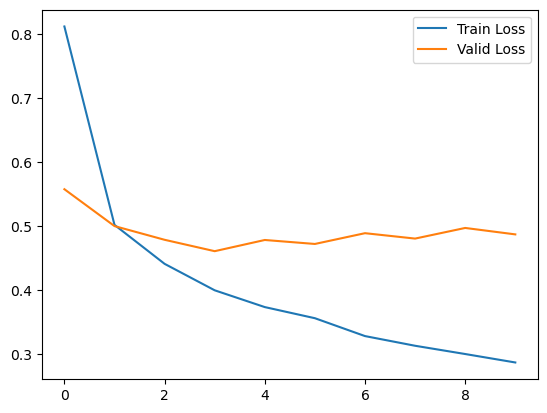

In [16]:
import pandas as pd
df = pd.DataFrame(history)
df.plot()
plt.show()

### Test

In [17]:
result_each_class = runner.mIoU_compute(runner.test_loader)

compute_mIoU: 100%|██████████| 22/22 [00:49<00:00,  2.26s/it]

Validation metric:
mIoU: 32.66
mPA: 39.02
Accuracy: 82.66


In [18]:
IoUs, PA_Recall, Precision = result_each_class

In [19]:
result_data = {name_classes[i]: (IoUs[i], PA_Recall[i], Precision[i]) for i in range(num_classes)}

In [20]:
result_df = pd.DataFrame(result_data).T
result_df.rename(columns={0: 'IoU', 1:'PA_Recal', 2:'Precision'}, inplace=True)
result_df

,IoU,PA_Recal,Precision
unlabelled,0.000000,0.000000,0.000000
asphalt,0.000000,0.000000,0.000000
dirt,0.627949,0.750436,0.793697
mud,0.103181,0.104227,0.911392
water,0.636310,0.827973,0.733250
gravel,0.632489,0.691633,0.880901
other-terrain,0.480492,0.507070,0.901645
tree-trunk,0.413286,0.506546,0.691813
tree-foliage,0.817642,0.929543,0.871664
bush,0.172477,0.269381,0.324081


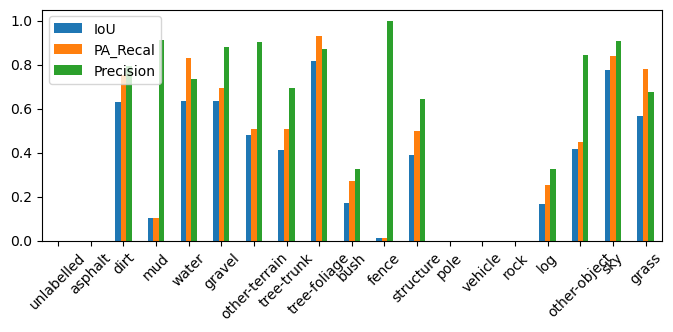

In [21]:
result_df.plot(kind='bar', figsize=(8, 3), rot=45)
plt.show()

## Deeplabv3

In [24]:
from torchvision.models.segmentation.deeplabv3 import DeepLabHead

model_deeplabv3 = torchvision.models.segmentation.deeplabv3_resnet50(pretrained=True)

model_deeplabv3.classifier = DeepLabHead(2048, num_classes)


Epoch 1/10


Training:   1%|          | 1/103 [00:02<04:10,  2.46s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=2.96]

1


Training:   2%|▏         | 2/103 [00:04<03:56,  2.34s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=2.85]

1


Training:   3%|▎         | 3/103 [00:07<03:53,  2.33s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=2.76]

1


Training:   4%|▍         | 4/103 [00:09<03:49,  2.32s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=2.66]

1


Training:   5%|▍         | 5/103 [00:11<03:48,  2.33s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=2.57]

1


Training:   6%|▌         | 6/103 [00:13<03:43,  2.30s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=2.5] 

1


Training:   7%|▋         | 7/103 [00:16<03:40,  2.29s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=2.43]

1


Training:   8%|▊         | 8/103 [00:18<03:39,  2.31s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=2.37]

1


Training:   9%|▊         | 9/103 [00:20<03:33,  2.27s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=2.3] 

1


Training:  10%|▉         | 10/103 [00:22<03:28,  2.24s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=2.25]

1


Training:  11%|█         | 11/103 [00:25<03:25,  2.23s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=2.2] 

1


Training:  12%|█▏        | 12/103 [00:27<03:21,  2.22s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=2.16]

1


Training:  13%|█▎        | 13/103 [00:29<03:22,  2.25s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=2.12]

1


Training:  14%|█▎        | 14/103 [00:31<03:20,  2.25s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=2.07]

1


Training:  15%|█▍        | 15/103 [00:34<03:23,  2.31s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=2.03]

1


Training:  16%|█▌        | 16/103 [00:36<03:19,  2.29s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.99]

1


Training:  17%|█▋        | 17/103 [00:38<03:18,  2.31s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.96]

1


Training:  17%|█▋        | 18/103 [00:41<03:15,  2.30s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.92]

1


Training:  18%|█▊        | 19/103 [00:43<03:13,  2.31s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.9] 

1


Training:  19%|█▉        | 20/103 [00:45<03:08,  2.27s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.87]

1


Training:  20%|██        | 21/103 [00:48<03:09,  2.31s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.85]

1


Training:  21%|██▏       | 22/103 [00:50<03:11,  2.37s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.82]

1


Training:  22%|██▏       | 23/103 [00:52<03:07,  2.34s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.81]

1


Training:  23%|██▎       | 24/103 [00:55<03:05,  2.35s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.79]

1


Training:  24%|██▍       | 25/103 [00:57<03:05,  2.37s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.78]

1


Training:  25%|██▌       | 26/103 [00:59<02:59,  2.33s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.76]

1


Training:  26%|██▌       | 27/103 [01:02<02:53,  2.28s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.73]

1


Training:  27%|██▋       | 28/103 [01:04<02:49,  2.26s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.72]

1


Training:  28%|██▊       | 29/103 [01:06<02:48,  2.28s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.71]

1


Training:  29%|██▉       | 30/103 [01:08<02:43,  2.25s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.69]

1


Training:  30%|███       | 31/103 [01:10<02:39,  2.21s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.67]

1


Training:  31%|███       | 32/103 [01:13<02:40,  2.25s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.65]

1


Training:  32%|███▏      | 33/103 [01:15<02:36,  2.24s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.64]

1


Training:  33%|███▎      | 34/103 [01:17<02:33,  2.22s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.63]

1


Training:  34%|███▍      | 35/103 [01:19<02:31,  2.22s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.62]

1


Training:  35%|███▍      | 36/103 [01:22<02:28,  2.21s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.61]

1


Training:  36%|███▌      | 37/103 [01:24<02:25,  2.21s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.59]

1


Training:  37%|███▋      | 38/103 [01:26<02:23,  2.21s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.58]

1


Training:  38%|███▊      | 39/103 [01:28<02:21,  2.21s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.57]

1


Training:  39%|███▉      | 40/103 [01:30<02:18,  2.21s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.56]

1


Training:  40%|███▉      | 41/103 [01:33<02:16,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.55]

1


Training:  41%|████      | 42/103 [01:35<02:14,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.54]

1


Training:  42%|████▏     | 43/103 [01:37<02:11,  2.19s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.53]

1


Training:  43%|████▎     | 44/103 [01:39<02:09,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.52]

1


Training:  44%|████▎     | 45/103 [01:41<02:07,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.51]

1


Training:  45%|████▍     | 46/103 [01:44<02:05,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.51]

1


Training:  46%|████▌     | 47/103 [01:46<02:03,  2.21s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.5] 

1


Training:  47%|████▋     | 48/103 [01:48<02:01,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.49]

1


Training:  48%|████▊     | 49/103 [01:50<01:58,  2.19s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.48]

1


Training:  49%|████▊     | 50/103 [01:52<01:55,  2.18s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.47]

1


Training:  50%|████▉     | 51/103 [01:55<01:53,  2.18s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.46]

1


Training:  50%|█████     | 52/103 [01:57<01:50,  2.16s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.46]

1


Training:  51%|█████▏    | 53/103 [01:59<01:48,  2.17s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.45]

1


Training:  52%|█████▏    | 54/103 [02:01<01:46,  2.17s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.44]

1


Training:  53%|█████▎    | 55/103 [02:03<01:44,  2.18s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.44]

1


Training:  54%|█████▍    | 56/103 [02:05<01:42,  2.18s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.43]

1


Training:  55%|█████▌    | 57/103 [02:08<01:40,  2.18s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.42]

1


Training:  56%|█████▋    | 58/103 [02:10<01:38,  2.18s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.41]

1


Training:  57%|█████▋    | 59/103 [02:12<01:36,  2.18s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.4] 

1


Training:  58%|█████▊    | 60/103 [02:14<01:34,  2.19s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.4]

1


Training:  59%|█████▉    | 61/103 [02:16<01:31,  2.18s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.39]

1


Training:  60%|██████    | 62/103 [02:18<01:28,  2.17s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.38]

1


Training:  61%|██████    | 63/103 [02:21<01:26,  2.16s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.37]

1


Training:  62%|██████▏   | 64/103 [02:23<01:24,  2.17s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.37]

1


Training:  63%|██████▎   | 65/103 [02:25<01:23,  2.19s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.36]

1


Training:  64%|██████▍   | 66/103 [02:27<01:20,  2.19s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.36]

1


Training:  65%|██████▌   | 67/103 [02:29<01:18,  2.19s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.35]

1


Training:  66%|██████▌   | 68/103 [02:32<01:16,  2.18s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.34]

1


Training:  67%|██████▋   | 69/103 [02:34<01:14,  2.19s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.34]

1


Training:  68%|██████▊   | 70/103 [02:36<01:12,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.33]

1


Training:  69%|██████▉   | 71/103 [02:38<01:10,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.33]

1


Training:  70%|██████▉   | 72/103 [02:40<01:08,  2.19s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.32]

1


Training:  71%|███████   | 73/103 [02:43<01:05,  2.19s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.31]

1


Training:  72%|███████▏  | 74/103 [02:45<01:03,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.31]

1


Training:  73%|███████▎  | 75/103 [02:47<01:01,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.31]

1


Training:  74%|███████▍  | 76/103 [02:49<00:59,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.3] 

1


Training:  75%|███████▍  | 77/103 [02:51<00:56,  2.19s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.29]

1


Training:  76%|███████▌  | 78/103 [02:54<00:54,  2.19s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.29]

1


Training:  77%|███████▋  | 79/103 [02:56<00:52,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.28]

1


Training:  78%|███████▊  | 80/103 [02:58<00:50,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.28]

1


Training:  79%|███████▊  | 81/103 [03:00<00:48,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.27]

1


Training:  80%|███████▉  | 82/103 [03:02<00:46,  2.19s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.27]

1


Training:  81%|████████  | 83/103 [03:04<00:43,  2.16s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.26]

1


Training:  82%|████████▏ | 84/103 [03:07<00:41,  2.16s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.26]

1


Training:  83%|████████▎ | 85/103 [03:09<00:39,  2.17s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.25]

1


Training:  83%|████████▎ | 86/103 [03:11<00:36,  2.16s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.25]

1


Training:  84%|████████▍ | 87/103 [03:13<00:34,  2.18s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.24]

1


Training:  85%|████████▌ | 88/103 [03:15<00:32,  2.19s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.24]

1


Training:  86%|████████▋ | 89/103 [03:18<00:30,  2.18s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.23]

1


Training:  87%|████████▋ | 90/103 [03:20<00:28,  2.19s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.23]

1


Training:  88%|████████▊ | 91/103 [03:22<00:26,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.22]

1


Training:  89%|████████▉ | 92/103 [03:24<00:24,  2.21s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.22]

1


Training:  90%|█████████ | 93/103 [03:26<00:22,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.22]

1


Training:  91%|█████████▏| 94/103 [03:29<00:19,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.21]

1


Training:  92%|█████████▏| 95/103 [03:31<00:17,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.21]

1


Training:  93%|█████████▎| 96/103 [03:33<00:15,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.21]

1


Training:  94%|█████████▍| 97/103 [03:35<00:13,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.2] 

1


Training:  95%|█████████▌| 98/103 [03:37<00:10,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.2]

1


Training:  96%|█████████▌| 99/103 [03:40<00:08,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.19]

1


Training:  97%|█████████▋| 100/103 [03:42<00:06,  2.19s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.19]

1


Training:  98%|█████████▊| 101/103 [03:44<00:04,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.18]

1


Training:  99%|█████████▉| 102/103 [03:46<00:02,  2.20s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.18]

1


Training: 100%|██████████| 103/103 [03:47<00:00,  2.21s/it, epoch=1, gpu_mem=6.18 GB, lr=0.0001, train_loss=1.18]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:45<00:00,  2.08s/it, gpu_memory=6.18 GB, lr=0.0001, valid_loss=0.792]


Saved Best Model


compute_mIoU: 100%|██████████| 22/22 [00:45<00:00,  2.08s/it]


Validation metric:
mIoU: 17.94
mPA: 22.84
Accuracy: 79.03
plot valid image


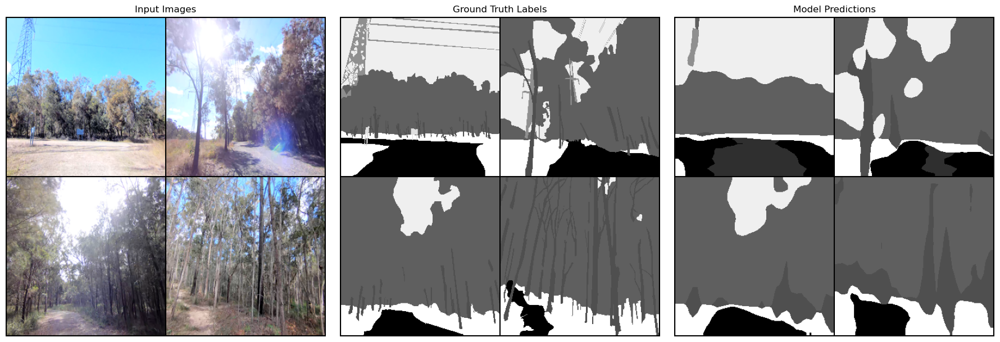

Epoch 2/10


Training:   1%|          | 1/103 [00:02<03:44,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.721]

1


Training:   2%|▏         | 2/103 [00:04<03:40,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.748]

1


Training:   3%|▎         | 3/103 [00:06<03:39,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.779]

1


Training:   4%|▍         | 4/103 [00:08<03:36,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.784]

1


Training:   5%|▍         | 5/103 [00:10<03:33,  2.17s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.753]

1


Training:   6%|▌         | 6/103 [00:13<03:30,  2.17s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.737]

1


Training:   7%|▋         | 7/103 [00:15<03:30,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.74] 

1


Training:   8%|▊         | 8/103 [00:17<03:27,  2.18s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.727]

1


Training:   9%|▊         | 9/103 [00:19<03:23,  2.16s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.716]

1


Training:  10%|▉         | 10/103 [00:21<03:21,  2.17s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.718]

1


Training:  11%|█         | 11/103 [00:23<03:19,  2.17s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.717]

1


Training:  12%|█▏        | 12/103 [00:26<03:18,  2.18s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.723]

1


Training:  13%|█▎        | 13/103 [00:28<03:16,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.732]

1


Training:  14%|█▎        | 14/103 [00:30<03:13,  2.18s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.728]

1


Training:  15%|█▍        | 15/103 [00:32<03:12,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.727]

1


Training:  16%|█▌        | 16/103 [00:34<03:10,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.729]

1


Training:  17%|█▋        | 17/103 [00:37<03:08,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.729]

1


Training:  17%|█▋        | 18/103 [00:39<03:07,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.736]

1


Training:  18%|█▊        | 19/103 [00:41<03:04,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.735]

1


Training:  19%|█▉        | 20/103 [00:43<03:02,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.733]

1


Training:  20%|██        | 21/103 [00:45<03:00,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.731]

1


Training:  21%|██▏       | 22/103 [00:48<02:57,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.728]

1


Training:  22%|██▏       | 23/103 [00:50<02:55,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.729]

1


Training:  23%|██▎       | 24/103 [00:52<02:52,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.728]

1


Training:  24%|██▍       | 25/103 [00:54<02:51,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.728]

1


Training:  25%|██▌       | 26/103 [00:56<02:49,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.727]

1


Training:  26%|██▌       | 27/103 [00:59<02:47,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.728]

1


Training:  27%|██▋       | 28/103 [01:01<02:44,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.722]

1


Training:  28%|██▊       | 29/103 [01:03<02:42,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.719]

1


Training:  29%|██▉       | 30/103 [01:05<02:40,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.72] 

1


Training:  30%|███       | 31/103 [01:07<02:38,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.723]

1


Training:  31%|███       | 32/103 [01:10<02:35,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.72] 

1


Training:  32%|███▏      | 33/103 [01:12<02:30,  2.16s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.717]

1


Training:  33%|███▎      | 34/103 [01:14<02:28,  2.16s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.717]

1


Training:  34%|███▍      | 35/103 [01:16<02:27,  2.17s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.716]

1


Training:  35%|███▍      | 36/103 [01:18<02:26,  2.18s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.717]

1


Training:  36%|███▌      | 37/103 [01:20<02:23,  2.17s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.715]

1


Training:  37%|███▋      | 38/103 [01:23<02:21,  2.18s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.714]

1


Training:  38%|███▊      | 39/103 [01:25<02:20,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.715]

1


Training:  39%|███▉      | 40/103 [01:27<02:17,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.713]

1


Training:  40%|███▉      | 41/103 [01:29<02:15,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.71] 

1


Training:  41%|████      | 42/103 [01:31<02:13,  2.18s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.707]

1


Training:  42%|████▏     | 43/103 [01:34<02:11,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.708]

1


Training:  43%|████▎     | 44/103 [01:36<02:07,  2.17s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.707]

1


Training:  44%|████▎     | 45/103 [01:38<02:05,  2.17s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.707]

1


Training:  45%|████▍     | 46/103 [01:40<02:03,  2.18s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.706]

1


Training:  46%|████▌     | 47/103 [01:42<02:02,  2.18s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.703]

1


Training:  47%|████▋     | 48/103 [01:44<01:59,  2.18s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.703]

1


Training:  48%|████▊     | 49/103 [01:47<01:58,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.702]

1


Training:  49%|████▊     | 50/103 [01:49<01:56,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.7]  

1


Training:  50%|████▉     | 51/103 [01:51<01:54,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.698]

1


Training:  50%|█████     | 52/103 [01:53<01:52,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.696]

1


Training:  51%|█████▏    | 53/103 [01:55<01:49,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.695]

1


Training:  52%|█████▏    | 54/103 [01:58<01:47,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.694]

1


Training:  53%|█████▎    | 55/103 [02:00<01:45,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.691]

1


Training:  54%|█████▍    | 56/103 [02:02<01:43,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.691]

1


Training:  55%|█████▌    | 57/103 [02:04<01:41,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.691]

1


Training:  56%|█████▋    | 58/103 [02:06<01:38,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.689]

1


Training:  57%|█████▋    | 59/103 [02:09<01:36,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.688]

1


Training:  58%|█████▊    | 60/103 [02:11<01:34,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.687]

1


Training:  59%|█████▉    | 61/103 [02:13<01:32,  2.21s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.686]

1


Training:  60%|██████    | 62/103 [02:15<01:30,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.686]

1


Training:  61%|██████    | 63/103 [02:17<01:28,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.685]

1


Training:  62%|██████▏   | 64/103 [02:20<01:25,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.684]

1


Training:  63%|██████▎   | 65/103 [02:22<01:23,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.683]

1


Training:  64%|██████▍   | 66/103 [02:24<01:21,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.682]

1


Training:  65%|██████▌   | 67/103 [02:26<01:18,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.682]

1


Training:  66%|██████▌   | 68/103 [02:28<01:17,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.683]

1


Training:  67%|██████▋   | 69/103 [02:31<01:14,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.682]

1


Training:  68%|██████▊   | 70/103 [02:33<01:12,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.682]

1


Training:  69%|██████▉   | 71/103 [02:35<01:10,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.681]

1


Training:  70%|██████▉   | 72/103 [02:37<01:08,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.68] 

1


Training:  71%|███████   | 73/103 [02:39<01:05,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.679]

1


Training:  72%|███████▏  | 74/103 [02:42<01:03,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.678]

1


Training:  73%|███████▎  | 75/103 [02:44<01:01,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.677]

1


Training:  74%|███████▍  | 76/103 [02:46<00:59,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.677]

1


Training:  75%|███████▍  | 77/103 [02:48<00:57,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.675]

1


Training:  76%|███████▌  | 78/103 [02:50<00:54,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.676]

1


Training:  77%|███████▋  | 79/103 [02:53<00:52,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.675]

1


Training:  78%|███████▊  | 80/103 [02:55<00:50,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.674]

1


Training:  79%|███████▊  | 81/103 [02:57<00:48,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.672]

1


Training:  80%|███████▉  | 82/103 [02:59<00:45,  2.17s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.672]

1


Training:  81%|████████  | 83/103 [03:01<00:43,  2.17s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.67] 

1


Training:  82%|████████▏ | 84/103 [03:03<00:41,  2.17s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.669]

1


Training:  83%|████████▎ | 85/103 [03:06<00:39,  2.18s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.668]

1


Training:  83%|████████▎ | 86/103 [03:08<00:37,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.667]

1


Training:  84%|████████▍ | 87/103 [03:10<00:34,  2.18s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.666]

1


Training:  85%|████████▌ | 88/103 [03:12<00:32,  2.18s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.666]

1


Training:  86%|████████▋ | 89/103 [03:14<00:30,  2.18s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.666]

1


Training:  87%|████████▋ | 90/103 [03:16<00:28,  2.16s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.665]

1


Training:  88%|████████▊ | 91/103 [03:19<00:25,  2.16s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.663]

1


Training:  89%|████████▉ | 92/103 [03:21<00:23,  2.17s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.663]

1


Training:  90%|█████████ | 93/103 [03:23<00:21,  2.17s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.662]

1


Training:  91%|█████████▏| 94/103 [03:25<00:19,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.663]

1


Training:  92%|█████████▏| 95/103 [03:27<00:17,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.662]

1


Training:  93%|█████████▎| 96/103 [03:30<00:15,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.661]

1


Training:  94%|█████████▍| 97/103 [03:32<00:13,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.66] 

1


Training:  95%|█████████▌| 98/103 [03:34<00:10,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.659]

1


Training:  96%|█████████▌| 99/103 [03:36<00:08,  2.20s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.658]

1


Training:  97%|█████████▋| 100/103 [03:38<00:06,  2.19s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.657]

1


Training:  98%|█████████▊| 101/103 [03:41<00:04,  2.18s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.656]

1


Training:  99%|█████████▉| 102/103 [03:43<00:02,  2.18s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.656]

1


Training: 100%|██████████| 103/103 [03:43<00:00,  2.17s/it, epoch=2, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.656]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:45<00:00,  2.08s/it, gpu_memory=6.18 GB, lr=0.0001, valid_loss=0.59] 


Saved Best Model


compute_mIoU: 100%|██████████| 22/22 [00:48<00:00,  2.20s/it]


Validation metric:
mIoU: 20.76
mPA: 25.83
Accuracy: 81.44
plot valid image


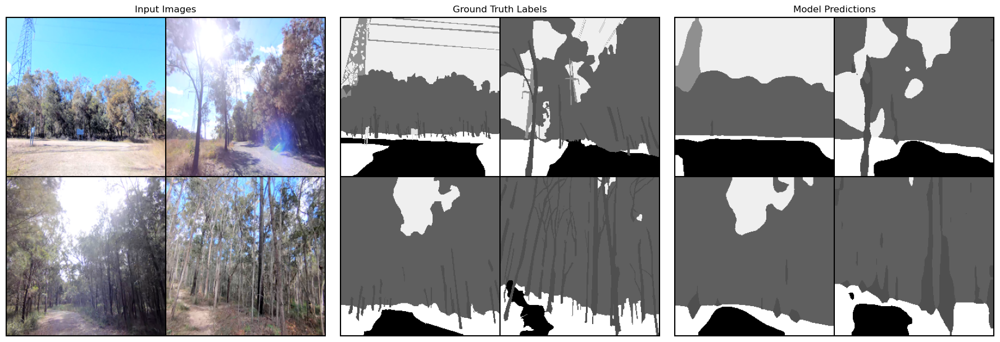

Epoch 3/10


Training:   1%|          | 1/103 [00:02<04:02,  2.37s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.562]

1


Training:   2%|▏         | 2/103 [00:04<03:48,  2.26s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.537]

1


Training:   3%|▎         | 3/103 [00:06<03:52,  2.33s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.539]

1


Training:   4%|▍         | 4/103 [00:09<03:44,  2.27s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.529]

1


Training:   5%|▍         | 5/103 [00:11<03:44,  2.29s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.545]

1


Training:   6%|▌         | 6/103 [00:13<03:38,  2.26s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.537]

1


Training:   7%|▋         | 7/103 [00:15<03:37,  2.27s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.538]

1


Training:   8%|▊         | 8/103 [00:18<03:33,  2.25s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.554]

1


Training:   9%|▊         | 9/103 [00:20<03:36,  2.30s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.559]

1


Training:  10%|▉         | 10/103 [00:22<03:30,  2.27s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.552]

1


Training:  11%|█         | 11/103 [00:25<03:29,  2.27s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.552]

1


Training:  12%|█▏        | 12/103 [00:27<03:28,  2.29s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.555]

1


Training:  13%|█▎        | 13/103 [00:29<03:23,  2.26s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.552]

1


Training:  14%|█▎        | 14/103 [00:31<03:21,  2.26s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.55] 

1


Training:  15%|█▍        | 15/103 [00:34<03:19,  2.27s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.545]

1


Training:  16%|█▌        | 16/103 [00:36<03:27,  2.38s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.546]

1


Training:  17%|█▋        | 17/103 [00:39<03:21,  2.35s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.544]

1


Training:  17%|█▋        | 18/103 [00:41<03:18,  2.33s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.545]

1


Training:  18%|█▊        | 19/103 [00:43<03:13,  2.30s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.543]

1


Training:  19%|█▉        | 20/103 [00:45<03:08,  2.27s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.538]

1


Training:  20%|██        | 21/103 [00:48<03:06,  2.27s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.542]

1


Training:  21%|██▏       | 22/103 [00:50<03:05,  2.29s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.546]

1


Training:  22%|██▏       | 23/103 [00:52<03:05,  2.32s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.545]

1


Training:  23%|██▎       | 24/103 [00:54<03:00,  2.28s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.544]

1


Training:  24%|██▍       | 25/103 [00:57<02:59,  2.31s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.544]

1


Training:  25%|██▌       | 26/103 [00:59<02:58,  2.32s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.542]

1


Training:  26%|██▌       | 27/103 [01:01<02:55,  2.31s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.542]

1


Training:  27%|██▋       | 28/103 [01:04<02:51,  2.28s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.544]

1


Training:  28%|██▊       | 29/103 [01:06<02:46,  2.26s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.543]

1


Training:  29%|██▉       | 30/103 [01:08<02:49,  2.33s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.543]

1


Training:  30%|███       | 31/103 [01:11<02:45,  2.30s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.542]

1


Training:  31%|███       | 32/103 [01:13<02:41,  2.28s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.541]

1


Training:  32%|███▏      | 33/103 [01:15<02:38,  2.26s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.539]

1


Training:  33%|███▎      | 34/103 [01:17<02:34,  2.24s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.537]

1


Training:  34%|███▍      | 35/103 [01:20<02:34,  2.28s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.538]

1


Training:  35%|███▍      | 36/103 [01:22<02:35,  2.33s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.54] 

1


Training:  36%|███▌      | 37/103 [01:24<02:33,  2.32s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.537]

1


Training:  37%|███▋      | 38/103 [01:27<02:30,  2.31s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.539]

1


Training:  38%|███▊      | 39/103 [01:29<02:29,  2.33s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.539]

1


Training:  39%|███▉      | 40/103 [01:31<02:24,  2.30s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.537]

1


Training:  40%|███▉      | 41/103 [01:33<02:20,  2.27s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.537]

1


Training:  41%|████      | 42/103 [01:36<02:17,  2.25s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.536]

1


Training:  42%|████▏     | 43/103 [01:38<02:16,  2.28s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.536]

1


Training:  43%|████▎     | 44/103 [01:40<02:16,  2.31s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.533]

1


Training:  44%|████▎     | 45/103 [01:43<02:13,  2.29s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.531]

1


Training:  45%|████▍     | 46/103 [01:45<02:09,  2.27s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.53] 

1


Training:  46%|████▌     | 47/103 [01:47<02:06,  2.27s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.531]

1


Training:  47%|████▋     | 48/103 [01:49<02:04,  2.27s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.529]

1


Training:  48%|████▊     | 49/103 [01:52<02:05,  2.32s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.53] 

1


Training:  49%|████▊     | 50/103 [01:54<02:03,  2.33s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.529]

1


Training:  50%|████▉     | 51/103 [01:56<01:59,  2.31s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.529]

1


Training:  50%|█████     | 52/103 [01:59<01:56,  2.28s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.53] 

1


Training:  51%|█████▏    | 53/103 [02:01<01:52,  2.26s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.53]

1


Training:  52%|█████▏    | 54/103 [02:03<01:50,  2.26s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.529]

1


Training:  53%|█████▎    | 55/103 [02:05<01:49,  2.27s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.528]

1


Training:  54%|█████▍    | 56/103 [02:08<01:47,  2.29s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.529]

1


Training:  55%|█████▌    | 57/103 [02:10<01:45,  2.28s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.528]

1


Training:  56%|█████▋    | 58/103 [02:12<01:44,  2.32s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.527]

1


Training:  57%|█████▋    | 59/103 [02:15<01:43,  2.35s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.527]

1


Training:  58%|█████▊    | 60/103 [02:17<01:38,  2.30s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.528]

1


Training:  59%|█████▉    | 61/103 [02:19<01:36,  2.30s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.529]

1


Training:  60%|██████    | 62/103 [02:22<01:33,  2.28s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.529]

1


Training:  61%|██████    | 63/103 [02:24<01:30,  2.26s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.529]

1


Training:  62%|██████▏   | 64/103 [02:26<01:28,  2.26s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.529]

1


Training:  63%|██████▎   | 65/103 [02:28<01:26,  2.28s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.529]

1


Training:  64%|██████▍   | 66/103 [02:31<01:24,  2.28s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.528]

1


Training:  65%|██████▌   | 67/103 [02:33<01:22,  2.30s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.528]

1


Training:  66%|██████▌   | 68/103 [02:35<01:21,  2.32s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.528]

1


Training:  67%|██████▋   | 69/103 [02:38<01:18,  2.30s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.528]

1


Training:  68%|██████▊   | 70/103 [02:40<01:15,  2.28s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.528]

1


Training:  69%|██████▉   | 71/103 [02:42<01:12,  2.25s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.528]

1


Training:  70%|██████▉   | 72/103 [02:44<01:11,  2.29s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.527]

1


Training:  71%|███████   | 73/103 [02:47<01:08,  2.27s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.527]

1


Training:  72%|███████▏  | 74/103 [02:49<01:05,  2.25s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.527]

1


Training:  73%|███████▎  | 75/103 [02:51<01:03,  2.29s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.527]

1


Training:  74%|███████▍  | 76/103 [02:53<01:01,  2.27s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.527]

1


Training:  75%|███████▍  | 77/103 [02:56<00:59,  2.28s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.527]

1


Training:  76%|███████▌  | 78/103 [02:58<00:56,  2.28s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.528]

1


Training:  77%|███████▋  | 79/103 [03:01<00:56,  2.36s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.528]

1


Training:  78%|███████▊  | 80/103 [03:03<00:54,  2.38s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.527]

1


Training:  79%|███████▊  | 81/103 [03:05<00:52,  2.39s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.527]

1


Training:  80%|███████▉  | 82/103 [03:08<00:49,  2.34s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.527]

1


Training:  81%|████████  | 83/103 [03:10<00:45,  2.30s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.528]

1


Training:  82%|████████▏ | 84/103 [03:12<00:43,  2.31s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.528]

1


Training:  83%|████████▎ | 85/103 [03:14<00:41,  2.30s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.528]

1


Training:  83%|████████▎ | 86/103 [03:17<00:39,  2.31s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.528]

1


Training:  84%|████████▍ | 87/103 [03:19<00:36,  2.29s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.527]

1


Training:  85%|████████▌ | 88/103 [03:21<00:33,  2.26s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.526]

1


Training:  86%|████████▋ | 89/103 [03:23<00:31,  2.25s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.525]

1


Training:  87%|████████▋ | 90/103 [03:26<00:28,  2.23s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.525]

1


Training:  88%|████████▊ | 91/103 [03:28<00:27,  2.26s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.525]

1


Training:  89%|████████▉ | 92/103 [03:30<00:24,  2.26s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.525]

1


Training:  90%|█████████ | 93/103 [03:33<00:23,  2.37s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.525]

1


Training:  91%|█████████▏| 94/103 [03:35<00:21,  2.34s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.525]

1


Training:  92%|█████████▏| 95/103 [03:37<00:18,  2.34s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.525]

1


Training:  93%|█████████▎| 96/103 [03:40<00:16,  2.29s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.524]

1


Training:  94%|█████████▍| 97/103 [03:42<00:13,  2.32s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.524]

1


Training:  95%|█████████▌| 98/103 [03:44<00:11,  2.34s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.523]

1


Training:  96%|█████████▌| 99/103 [03:47<00:09,  2.37s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.523]

1


Training:  97%|█████████▋| 100/103 [03:49<00:06,  2.31s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.522]

1


Training:  98%|█████████▊| 101/103 [03:51<00:04,  2.33s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.523]

1


Training:  99%|█████████▉| 102/103 [03:54<00:02,  2.30s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.522]

1


Training: 100%|██████████| 103/103 [03:54<00:00,  2.28s/it, epoch=3, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.522]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:48<00:00,  2.20s/it, gpu_memory=6.18 GB, lr=0.0001, valid_loss=0.537]


Saved Best Model


compute_mIoU: 100%|██████████| 22/22 [00:48<00:00,  2.21s/it]


Validation metric:
mIoU: 21.66
mPA: 26.28
Accuracy: 81.72
plot valid image


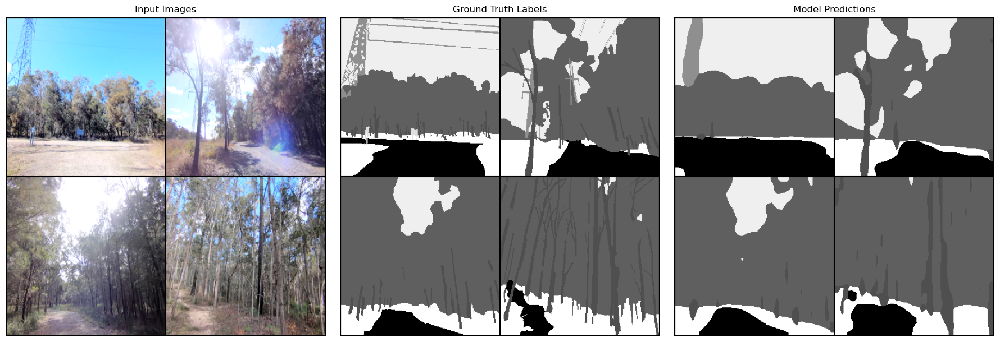

Epoch 4/10


Training:   1%|          | 1/103 [00:02<03:46,  2.22s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.475]

1


Training:   2%|▏         | 2/103 [00:04<03:50,  2.28s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.468]

1


Training:   3%|▎         | 3/103 [00:06<03:53,  2.33s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.499]

1


Training:   4%|▍         | 4/103 [00:09<03:46,  2.29s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.516]

1


Training:   5%|▍         | 5/103 [00:11<03:40,  2.25s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.501]

1


Training:   6%|▌         | 6/103 [00:13<03:37,  2.24s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.502]

1


Training:   7%|▋         | 7/103 [00:15<03:36,  2.26s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.497]

1


Training:   8%|▊         | 8/103 [00:18<03:33,  2.25s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.493]

1


Training:   9%|▊         | 9/103 [00:20<03:36,  2.30s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.488]

1


Training:  10%|▉         | 10/103 [00:22<03:37,  2.33s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.484]

1


Training:  11%|█         | 11/103 [00:25<03:32,  2.31s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.485]

1


Training:  12%|█▏        | 12/103 [00:27<03:26,  2.27s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.477]

1


Training:  13%|█▎        | 13/103 [00:29<03:22,  2.26s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.474]

1


Training:  14%|█▎        | 14/103 [00:31<03:24,  2.29s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.476]

1


Training:  15%|█▍        | 15/103 [00:34<03:24,  2.33s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.476]

1


Training:  16%|█▌        | 16/103 [00:36<03:29,  2.41s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.476]

1


Training:  17%|█▋        | 17/103 [00:39<03:21,  2.35s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.473]

1


Training:  17%|█▋        | 18/103 [00:41<03:15,  2.30s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.473]

1


Training:  18%|█▊        | 19/103 [00:43<03:15,  2.32s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.474]

1


Training:  19%|█▉        | 20/103 [00:45<03:10,  2.29s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.471]

1


Training:  20%|██        | 21/103 [00:48<03:05,  2.27s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.469]

1


Training:  21%|██▏       | 22/103 [00:50<03:06,  2.30s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.471]

1


Training:  22%|██▏       | 23/103 [00:52<03:01,  2.27s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.47] 

1


Training:  23%|██▎       | 24/103 [00:55<03:02,  2.31s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.468]

1


Training:  24%|██▍       | 25/103 [00:57<03:00,  2.32s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.469]

1


Training:  25%|██▌       | 26/103 [00:59<02:57,  2.31s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.466]

1


Training:  26%|██▌       | 27/103 [01:02<03:01,  2.39s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.466]

1


Training:  27%|██▋       | 28/103 [01:04<02:55,  2.34s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.465]

1


Training:  28%|██▊       | 29/103 [01:06<02:54,  2.35s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.464]

1


Training:  29%|██▉       | 30/103 [01:09<02:52,  2.37s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.462]

1


Training:  30%|███       | 31/103 [01:11<02:46,  2.32s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.462]

1


Training:  31%|███       | 32/103 [01:13<02:42,  2.28s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.46] 

1


Training:  32%|███▏      | 33/103 [01:15<02:37,  2.25s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  33%|███▎      | 34/103 [01:18<02:34,  2.25s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.458]

1


Training:  34%|███▍      | 35/103 [01:20<02:31,  2.23s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  35%|███▍      | 36/103 [01:22<02:28,  2.22s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.457]

1


Training:  36%|███▌      | 37/103 [01:24<02:26,  2.22s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.455]

1


Training:  37%|███▋      | 38/103 [01:26<02:23,  2.21s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.457]

1


Training:  38%|███▊      | 39/103 [01:29<02:24,  2.25s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.457]

1


Training:  39%|███▉      | 40/103 [01:31<02:23,  2.28s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.456]

1


Training:  40%|███▉      | 41/103 [01:33<02:21,  2.29s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.456]

1


Training:  41%|████      | 42/103 [01:36<02:18,  2.28s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.455]

1


Training:  42%|████▏     | 43/103 [01:38<02:17,  2.29s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.455]

1


Training:  43%|████▎     | 44/103 [01:40<02:13,  2.27s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.455]

1


Training:  44%|████▎     | 45/103 [01:43<02:13,  2.30s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.455]

1


Training:  45%|████▍     | 46/103 [01:45<02:09,  2.27s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.454]

1


Training:  46%|████▌     | 47/103 [01:47<02:06,  2.26s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.454]

1


Training:  47%|████▋     | 48/103 [01:49<02:03,  2.24s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.454]

1


Training:  48%|████▊     | 49/103 [01:51<02:00,  2.22s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.455]

1


Training:  49%|████▊     | 50/103 [01:54<02:00,  2.28s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.455]

1


Training:  50%|████▉     | 51/103 [01:56<01:57,  2.26s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.455]

1


Training:  50%|█████     | 52/103 [01:58<01:54,  2.24s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.455]

1


Training:  51%|█████▏    | 53/103 [02:00<01:51,  2.22s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.456]

1


Training:  52%|█████▏    | 54/103 [02:03<01:49,  2.24s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.456]

1


Training:  53%|█████▎    | 55/103 [02:05<01:48,  2.27s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.457]

1


Training:  54%|█████▍    | 56/103 [02:07<01:45,  2.24s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.457]

1


Training:  55%|█████▌    | 57/103 [02:09<01:42,  2.23s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.456]

1


Training:  56%|█████▋    | 58/103 [02:12<01:40,  2.22s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.457]

1


Training:  57%|█████▋    | 59/103 [02:14<01:37,  2.22s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.456]

1


Training:  58%|█████▊    | 60/103 [02:16<01:36,  2.23s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.457]

1


Training:  59%|█████▉    | 61/103 [02:18<01:34,  2.25s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.457]

1


Training:  60%|██████    | 62/103 [02:21<01:34,  2.31s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.456]

1


Training:  61%|██████    | 63/103 [02:23<01:33,  2.33s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.455]

1


Training:  62%|██████▏   | 64/103 [02:25<01:29,  2.29s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.455]

1


Training:  63%|██████▎   | 65/103 [02:28<01:28,  2.32s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.454]

1


Training:  64%|██████▍   | 66/103 [02:30<01:25,  2.32s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.455]

1


Training:  65%|██████▌   | 67/103 [02:32<01:23,  2.31s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.456]

1


Training:  66%|██████▌   | 68/103 [02:35<01:21,  2.33s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.456]

1


Training:  67%|██████▋   | 69/103 [02:37<01:19,  2.35s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.455]

1


Training:  68%|██████▊   | 70/103 [02:40<01:18,  2.37s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.456]

1


Training:  69%|██████▉   | 71/103 [02:42<01:14,  2.33s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.457]

1


Training:  70%|██████▉   | 72/103 [02:44<01:14,  2.40s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.458]

1


Training:  71%|███████   | 73/103 [02:47<01:10,  2.35s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.457]

1


Training:  72%|███████▏  | 74/103 [02:49<01:06,  2.30s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.457]

1


Training:  73%|███████▎  | 75/103 [02:51<01:05,  2.33s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.458]

1


Training:  74%|███████▍  | 76/103 [02:54<01:03,  2.35s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.458]

1


Training:  75%|███████▍  | 77/103 [02:56<01:02,  2.41s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  76%|███████▌  | 78/103 [02:59<00:59,  2.40s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  77%|███████▋  | 79/103 [03:01<00:56,  2.37s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  78%|███████▊  | 80/103 [03:03<00:53,  2.32s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.46] 

1


Training:  79%|███████▊  | 81/103 [03:05<00:50,  2.28s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  80%|███████▉  | 82/103 [03:07<00:47,  2.28s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  81%|████████  | 83/103 [03:10<00:45,  2.29s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  82%|████████▏ | 84/103 [03:12<00:43,  2.27s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  83%|████████▎ | 85/103 [03:14<00:40,  2.27s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.458]

1


Training:  83%|████████▎ | 86/103 [03:17<00:39,  2.34s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  84%|████████▍ | 87/103 [03:19<00:37,  2.35s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  85%|████████▌ | 88/103 [03:21<00:34,  2.32s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  86%|████████▋ | 89/103 [03:24<00:31,  2.28s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  87%|████████▋ | 90/103 [03:26<00:29,  2.25s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.458]

1


Training:  88%|████████▊ | 91/103 [03:28<00:27,  2.30s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  89%|████████▉ | 92/103 [03:31<00:25,  2.33s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  90%|█████████ | 93/103 [03:33<00:23,  2.35s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  91%|█████████▏| 94/103 [03:35<00:21,  2.35s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  92%|█████████▏| 95/103 [03:38<00:18,  2.31s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  93%|█████████▎| 96/103 [03:40<00:16,  2.29s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.458]

1


Training:  94%|█████████▍| 97/103 [03:42<00:13,  2.29s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  95%|█████████▌| 98/103 [03:45<00:11,  2.35s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.459]

1


Training:  96%|█████████▌| 99/103 [03:47<00:09,  2.36s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.458]

1


Training:  97%|█████████▋| 100/103 [03:49<00:07,  2.38s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.458]

1


Training:  98%|█████████▊| 101/103 [03:52<00:04,  2.42s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.458]

1


Training:  99%|█████████▉| 102/103 [03:54<00:02,  2.38s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.458]

1


Training: 100%|██████████| 103/103 [03:55<00:00,  2.28s/it, epoch=4, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.458]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:49<00:00,  2.23s/it, gpu_memory=6.18 GB, lr=0.0001, valid_loss=0.505]


Saved Best Model


compute_mIoU: 100%|██████████| 22/22 [00:49<00:00,  2.23s/it]


Validation metric:
mIoU: 23.94
mPA: 30.05
Accuracy: 81.97
plot valid image


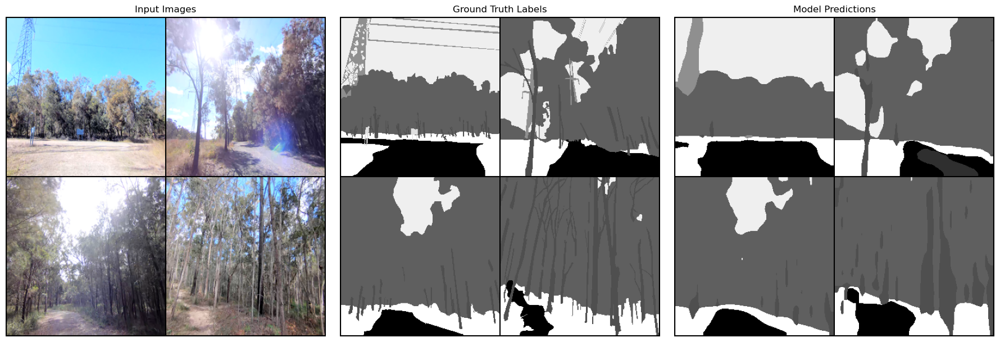

Epoch 5/10


Training:   1%|          | 1/103 [00:02<04:02,  2.37s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.403]

1


Training:   2%|▏         | 2/103 [00:04<03:52,  2.31s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.41] 

1


Training:   3%|▎         | 3/103 [00:06<03:48,  2.29s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.404]

1


Training:   4%|▍         | 4/103 [00:09<03:49,  2.32s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.419]

1


Training:   5%|▍         | 5/103 [00:11<03:46,  2.32s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.428]

1


Training:   6%|▌         | 6/103 [00:13<03:40,  2.27s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.429]

1


Training:   7%|▋         | 7/103 [00:15<03:35,  2.25s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.428]

1


Training:   8%|▊         | 8/103 [00:18<03:31,  2.23s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.434]

1


Training:   9%|▊         | 9/103 [00:20<03:40,  2.35s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.439]

1


Training:  10%|▉         | 10/103 [00:23<03:36,  2.33s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.438]

1


Training:  11%|█         | 11/103 [00:25<03:33,  2.32s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.443]

1


Training:  12%|█▏        | 12/103 [00:27<03:27,  2.28s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.439]

1


Training:  13%|█▎        | 13/103 [00:29<03:23,  2.26s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.438]

1


Training:  14%|█▎        | 14/103 [00:32<03:23,  2.29s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.438]

1


Training:  15%|█▍        | 15/103 [00:34<03:20,  2.28s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.434]

1


Training:  16%|█▌        | 16/103 [00:36<03:20,  2.31s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.433]

1


Training:  17%|█▋        | 17/103 [00:39<03:20,  2.33s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.429]

1


Training:  17%|█▋        | 18/103 [00:41<03:15,  2.30s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.426]

1


Training:  18%|█▊        | 19/103 [00:43<03:10,  2.27s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.425]

1


Training:  19%|█▉        | 20/103 [00:45<03:09,  2.29s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.425]

1


Training:  20%|██        | 21/103 [00:48<03:07,  2.28s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.427]

1


Training:  21%|██▏       | 22/103 [00:50<03:10,  2.35s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.425]

1


Training:  22%|██▏       | 23/103 [00:53<03:09,  2.37s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.426]

1


Training:  23%|██▎       | 24/103 [00:55<03:05,  2.34s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.428]

1


Training:  24%|██▍       | 25/103 [00:57<03:01,  2.32s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.427]

1


Training:  25%|██▌       | 26/103 [00:59<02:58,  2.32s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.426]

1


Training:  26%|██▌       | 27/103 [01:02<02:57,  2.34s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.424]

1


Training:  27%|██▋       | 28/103 [01:04<02:53,  2.31s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.422]

1


Training:  28%|██▊       | 29/103 [01:06<02:52,  2.33s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.421]

1


Training:  29%|██▉       | 30/103 [01:09<02:53,  2.37s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.421]

1


Training:  30%|███       | 31/103 [01:11<02:49,  2.35s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.422]

1


Training:  31%|███       | 32/103 [01:14<02:48,  2.38s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.424]

1


Training:  32%|███▏      | 33/103 [01:16<02:46,  2.38s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.423]

1


Training:  33%|███▎      | 34/103 [01:18<02:40,  2.33s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.422]

1


Training:  34%|███▍      | 35/103 [01:21<02:39,  2.34s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.42] 

1


Training:  35%|███▍      | 36/103 [01:23<02:34,  2.31s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.421]

1


Training:  36%|███▌      | 37/103 [01:25<02:30,  2.28s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.421]

1


Training:  37%|███▋      | 38/103 [01:27<02:27,  2.27s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.422]

1


Training:  38%|███▊      | 39/103 [01:30<02:26,  2.28s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.421]

1


Training:  39%|███▉      | 40/103 [01:32<02:22,  2.26s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.42] 

1


Training:  40%|███▉      | 41/103 [01:34<02:19,  2.24s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.419]

1


Training:  41%|████      | 42/103 [01:36<02:17,  2.26s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.419]

1


Training:  42%|████▏     | 43/103 [01:39<02:16,  2.27s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.419]

1


Training:  43%|████▎     | 44/103 [01:41<02:15,  2.30s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  44%|████▎     | 45/103 [01:43<02:12,  2.28s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  45%|████▍     | 46/103 [01:46<02:11,  2.31s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.419]

1


Training:  46%|████▌     | 47/103 [01:48<02:07,  2.28s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  47%|████▋     | 48/103 [01:50<02:06,  2.30s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.419]

1


Training:  48%|████▊     | 49/103 [01:52<02:03,  2.29s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  49%|████▊     | 50/103 [01:55<01:59,  2.26s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  50%|████▉     | 51/103 [01:57<01:57,  2.27s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.417]

1


Training:  50%|█████     | 52/103 [01:59<01:56,  2.28s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  51%|█████▏    | 53/103 [02:02<01:55,  2.31s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.417]

1


Training:  52%|█████▏    | 54/103 [02:04<01:51,  2.28s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  53%|█████▎    | 55/103 [02:06<01:51,  2.31s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.419]

1


Training:  54%|█████▍    | 56/103 [02:08<01:47,  2.28s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  55%|█████▌    | 57/103 [02:11<01:44,  2.26s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  56%|█████▋    | 58/103 [02:13<01:41,  2.26s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  57%|█████▋    | 59/103 [02:15<01:43,  2.35s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  58%|█████▊    | 60/103 [02:18<01:39,  2.32s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.417]

1


Training:  59%|█████▉    | 61/103 [02:20<01:37,  2.32s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.417]

1


Training:  60%|██████    | 62/103 [02:22<01:33,  2.29s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.417]

1


Training:  61%|██████    | 63/103 [02:25<01:32,  2.32s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  62%|██████▏   | 64/103 [02:27<01:31,  2.35s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  63%|██████▎   | 65/103 [02:29<01:27,  2.30s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  64%|██████▍   | 66/103 [02:31<01:24,  2.29s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.419]

1


Training:  65%|██████▌   | 67/103 [02:34<01:22,  2.29s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  66%|██████▌   | 68/103 [02:36<01:19,  2.27s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  67%|██████▋   | 69/103 [02:38<01:16,  2.25s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  68%|██████▊   | 70/103 [02:41<01:15,  2.29s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.419]

1


Training:  69%|██████▉   | 71/103 [02:43<01:16,  2.38s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  70%|██████▉   | 72/103 [02:46<01:13,  2.39s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  71%|███████   | 73/103 [02:48<01:11,  2.40s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  72%|███████▏  | 74/103 [02:50<01:08,  2.37s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  73%|███████▎  | 75/103 [02:53<01:05,  2.34s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  74%|███████▍  | 76/103 [02:55<01:02,  2.31s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  75%|███████▍  | 77/103 [02:57<01:00,  2.33s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  76%|███████▌  | 78/103 [02:59<00:57,  2.29s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  77%|███████▋  | 79/103 [03:02<00:54,  2.27s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  78%|███████▊  | 80/103 [03:04<00:52,  2.28s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.417]

1


Training:  79%|███████▊  | 81/103 [03:06<00:50,  2.28s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.417]

1


Training:  80%|███████▉  | 82/103 [03:09<00:48,  2.30s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  81%|████████  | 83/103 [03:11<00:45,  2.29s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  82%|████████▏ | 84/103 [03:13<00:44,  2.35s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  83%|████████▎ | 85/103 [03:16<00:41,  2.31s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  83%|████████▎ | 86/103 [03:18<00:39,  2.30s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  84%|████████▍ | 87/103 [03:20<00:36,  2.27s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  85%|████████▌ | 88/103 [03:22<00:33,  2.25s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  86%|████████▋ | 89/103 [03:25<00:32,  2.29s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.418]

1


Training:  87%|████████▋ | 90/103 [03:27<00:29,  2.27s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.417]

1


Training:  88%|████████▊ | 91/103 [03:29<00:27,  2.29s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.417]

1


Training:  89%|████████▉ | 92/103 [03:32<00:25,  2.35s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.417]

1


Training:  90%|█████████ | 93/103 [03:34<00:22,  2.30s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.417]

1


Training:  91%|█████████▏| 94/103 [03:36<00:20,  2.30s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.417]

1


Training:  92%|█████████▏| 95/103 [03:38<00:18,  2.30s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.416]

1


Training:  93%|█████████▎| 96/103 [03:41<00:16,  2.30s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.416]

1


Training:  94%|█████████▍| 97/103 [03:43<00:13,  2.30s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.416]

1


Training:  95%|█████████▌| 98/103 [03:45<00:11,  2.32s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.416]

1


Training:  96%|█████████▌| 99/103 [03:48<00:09,  2.35s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.416]

1


Training:  97%|█████████▋| 100/103 [03:50<00:06,  2.30s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.415]

1


Training:  98%|█████████▊| 101/103 [03:52<00:04,  2.28s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.415]

1


Training:  99%|█████████▉| 102/103 [03:55<00:02,  2.31s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.415]

1


Training: 100%|██████████| 103/103 [03:55<00:00,  2.29s/it, epoch=5, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.415]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:48<00:00,  2.22s/it, gpu_memory=6.18 GB, lr=0.0001, valid_loss=0.502]


Saved Best Model


compute_mIoU: 100%|██████████| 22/22 [00:48<00:00,  2.22s/it]


Validation metric:
mIoU: 24.71
mPA: 31.36
Accuracy: 82.07
plot valid image


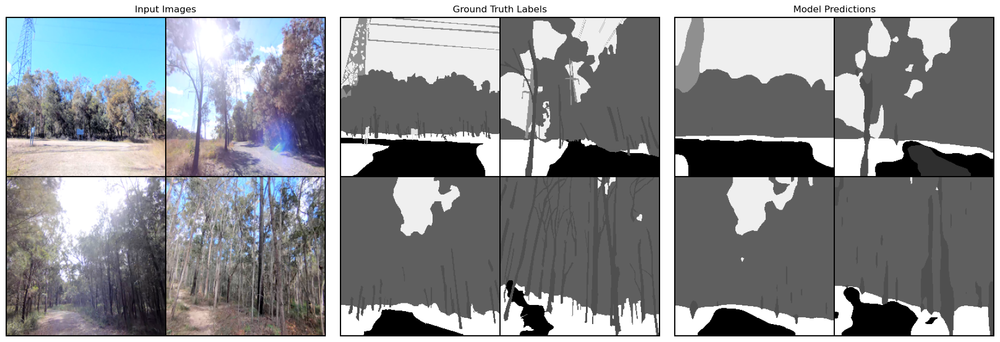

Epoch 6/10


Training:   1%|          | 1/103 [00:02<04:16,  2.51s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.431]

1


Training:   2%|▏         | 2/103 [00:04<04:01,  2.39s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.419]

1


Training:   3%|▎         | 3/103 [00:07<03:50,  2.31s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.413]

1


Training:   4%|▍         | 4/103 [00:09<03:44,  2.27s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.406]

1


Training:   5%|▍         | 5/103 [00:11<03:44,  2.29s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.416]

1


Training:   6%|▌         | 6/103 [00:13<03:41,  2.28s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.412]

1


Training:   7%|▋         | 7/103 [00:16<03:36,  2.26s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.41] 

1


Training:   8%|▊         | 8/103 [00:18<03:37,  2.29s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.404]

1


Training:   9%|▊         | 9/103 [00:20<03:36,  2.30s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.403]

1


Training:  10%|▉         | 10/103 [00:23<03:34,  2.30s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.4] 

1


Training:  11%|█         | 11/103 [00:25<03:28,  2.27s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.399]

1


Training:  12%|█▏        | 12/103 [00:27<03:36,  2.37s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.395]

1


Training:  13%|█▎        | 13/103 [00:30<03:30,  2.34s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.393]

1


Training:  14%|█▎        | 14/103 [00:32<03:26,  2.32s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.393]

1


Training:  15%|█▍        | 15/103 [00:34<03:22,  2.30s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.39] 

1


Training:  16%|█▌        | 16/103 [00:36<03:16,  2.26s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  17%|█▋        | 17/103 [00:39<03:17,  2.30s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.388]

1


Training:  17%|█▋        | 18/103 [00:41<03:18,  2.34s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.391]

1


Training:  18%|█▊        | 19/103 [00:43<03:13,  2.30s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.393]

1


Training:  19%|█▉        | 20/103 [00:46<03:07,  2.26s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.392]

1


Training:  20%|██        | 21/103 [00:48<03:04,  2.25s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.39] 

1


Training:  21%|██▏       | 22/103 [00:50<03:10,  2.36s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  22%|██▏       | 23/103 [00:53<03:04,  2.31s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.39] 

1


Training:  23%|██▎       | 24/103 [00:55<03:03,  2.33s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.391]

1


Training:  24%|██▍       | 25/103 [00:57<03:03,  2.35s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.392]

1


Training:  25%|██▌       | 26/103 [01:00<02:57,  2.31s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.392]

1


Training:  26%|██▌       | 27/103 [01:02<02:55,  2.31s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.395]

1


Training:  27%|██▋       | 28/103 [01:04<02:51,  2.29s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.394]

1


Training:  28%|██▊       | 29/103 [01:06<02:48,  2.28s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.393]

1


Training:  29%|██▉       | 30/103 [01:09<02:48,  2.30s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.394]

1


Training:  30%|███       | 31/103 [01:11<02:44,  2.28s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.393]

1


Training:  31%|███       | 32/103 [01:13<02:40,  2.25s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.394]

1


Training:  32%|███▏      | 33/103 [01:16<02:42,  2.33s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.393]

1


Training:  33%|███▎      | 34/103 [01:18<02:40,  2.32s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.393]

1


Training:  34%|███▍      | 35/103 [01:20<02:35,  2.29s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.392]

1


Training:  35%|███▍      | 36/103 [01:22<02:31,  2.26s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.392]

1


Training:  36%|███▌      | 37/103 [01:24<02:27,  2.24s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.391]

1


Training:  37%|███▋      | 38/103 [01:27<02:24,  2.23s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.391]

1


Training:  38%|███▊      | 39/103 [01:29<02:22,  2.22s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.392]

1


Training:  39%|███▉      | 40/103 [01:31<02:21,  2.24s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.392]

1


Training:  40%|███▉      | 41/103 [01:34<02:20,  2.27s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.392]

1


Training:  41%|████      | 42/103 [01:36<02:18,  2.27s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.391]

1


Training:  42%|████▏     | 43/103 [01:38<02:16,  2.28s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.39] 

1


Training:  43%|████▎     | 44/103 [01:40<02:12,  2.25s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  44%|████▎     | 45/103 [01:43<02:12,  2.28s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.39] 

1


Training:  45%|████▍     | 46/103 [01:45<02:09,  2.27s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  46%|████▌     | 47/103 [01:47<02:06,  2.25s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  47%|████▋     | 48/103 [01:49<02:03,  2.24s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  48%|████▊     | 49/103 [01:51<02:00,  2.23s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  49%|████▊     | 50/103 [01:54<01:59,  2.25s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.39] 

1


Training:  50%|████▉     | 51/103 [01:56<01:57,  2.26s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.39]

1


Training:  50%|█████     | 52/103 [01:58<01:54,  2.25s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  51%|█████▏    | 53/103 [02:01<01:53,  2.27s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  52%|█████▏    | 54/103 [02:03<01:53,  2.31s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  53%|█████▎    | 55/103 [02:05<01:51,  2.33s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  54%|█████▍    | 56/103 [02:08<01:48,  2.31s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  55%|█████▌    | 57/103 [02:10<01:49,  2.39s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  56%|█████▋    | 58/103 [02:13<01:45,  2.35s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  57%|█████▋    | 59/103 [02:15<01:43,  2.36s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  58%|█████▊    | 60/103 [02:17<01:39,  2.31s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  59%|█████▉    | 61/103 [02:19<01:35,  2.28s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.39] 

1


Training:  60%|██████    | 62/103 [02:22<01:35,  2.34s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.39]

1


Training:  61%|██████    | 63/103 [02:24<01:32,  2.31s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.39]

1


Training:  62%|██████▏   | 64/103 [02:26<01:29,  2.30s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  63%|██████▎   | 65/103 [02:29<01:28,  2.33s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.39] 

1


Training:  64%|██████▍   | 66/103 [02:31<01:26,  2.34s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  65%|██████▌   | 67/103 [02:33<01:22,  2.30s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  66%|██████▌   | 68/103 [02:36<01:20,  2.30s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  67%|██████▋   | 69/103 [02:38<01:18,  2.30s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  68%|██████▊   | 70/103 [02:40<01:14,  2.27s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.389]

1


Training:  69%|██████▉   | 71/103 [02:43<01:15,  2.35s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.388]

1


Training:  70%|██████▉   | 72/103 [02:45<01:12,  2.33s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.388]

1


Training:  71%|███████   | 73/103 [02:47<01:11,  2.38s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.388]

1


Training:  72%|███████▏  | 74/103 [02:50<01:08,  2.35s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.388]

1


Training:  73%|███████▎  | 75/103 [02:52<01:04,  2.31s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.388]

1


Training:  74%|███████▍  | 76/103 [02:54<01:01,  2.28s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.387]

1


Training:  75%|███████▍  | 77/103 [02:56<00:58,  2.25s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.387]

1


Training:  76%|███████▌  | 78/103 [02:58<00:55,  2.24s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.387]

1


Training:  77%|███████▋  | 79/103 [03:01<00:55,  2.31s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.387]

1


Training:  78%|███████▊  | 80/103 [03:03<00:53,  2.31s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.387]

1


Training:  79%|███████▊  | 81/103 [03:05<00:50,  2.28s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.387]

1


Training:  80%|███████▉  | 82/103 [03:08<00:48,  2.32s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.386]

1


Training:  81%|████████  | 83/103 [03:10<00:45,  2.28s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.386]

1


Training:  82%|████████▏ | 84/103 [03:12<00:42,  2.26s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.386]

1


Training:  83%|████████▎ | 85/103 [03:15<00:41,  2.30s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.386]

1


Training:  83%|████████▎ | 86/103 [03:17<00:38,  2.27s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.386]

1


Training:  84%|████████▍ | 87/103 [03:19<00:36,  2.25s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.386]

1


Training:  85%|████████▌ | 88/103 [03:21<00:33,  2.24s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.386]

1


Training:  86%|████████▋ | 89/103 [03:24<00:31,  2.28s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.386]

1


Training:  87%|████████▋ | 90/103 [03:26<00:29,  2.26s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.385]

1


Training:  88%|████████▊ | 91/103 [03:28<00:27,  2.28s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.385]

1


Training:  89%|████████▉ | 92/103 [03:31<00:26,  2.40s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.385]

1


Training:  90%|█████████ | 93/103 [03:33<00:23,  2.36s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.384]

1


Training:  91%|█████████▏| 94/103 [03:36<00:21,  2.40s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.385]

1


Training:  92%|█████████▏| 95/103 [03:38<00:18,  2.35s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.385]

1


Training:  93%|█████████▎| 96/103 [03:40<00:16,  2.32s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.385]

1


Training:  94%|█████████▍| 97/103 [03:42<00:13,  2.31s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.385]

1


Training:  95%|█████████▌| 98/103 [03:45<00:11,  2.29s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.386]

1


Training:  96%|█████████▌| 99/103 [03:47<00:09,  2.33s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.385]

1


Training:  97%|█████████▋| 100/103 [03:49<00:06,  2.32s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.385]

1


Training:  98%|█████████▊| 101/103 [03:52<00:04,  2.31s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.386]

1


Training:  99%|█████████▉| 102/103 [03:54<00:02,  2.33s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.386]

1


Training: 100%|██████████| 103/103 [03:55<00:00,  2.28s/it, epoch=6, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.386]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:47<00:00,  2.17s/it, gpu_memory=6.18 GB, lr=0.0001, valid_loss=0.498]


Saved Best Model


compute_mIoU: 100%|██████████| 22/22 [00:49<00:00,  2.24s/it]


Validation metric:
mIoU: 25.28
mPA: 32.35
Accuracy: 82.01
plot valid image


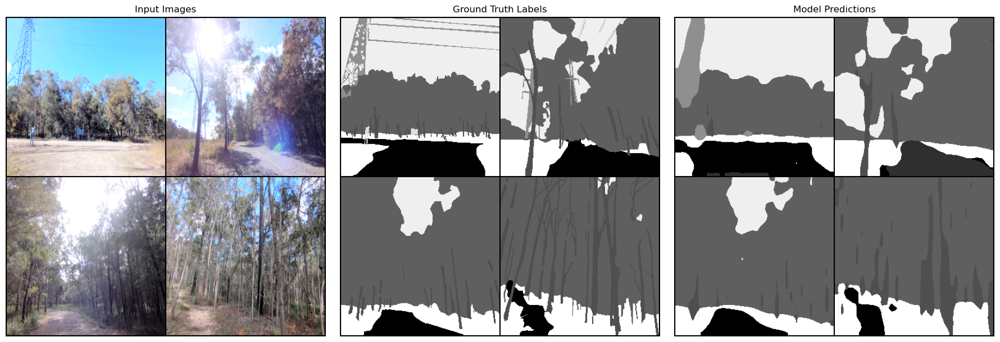

Epoch 7/10


Training:   1%|          | 1/103 [00:02<03:58,  2.34s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:   2%|▏         | 2/103 [00:04<03:59,  2.37s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.373]

1


Training:   3%|▎         | 3/103 [00:07<03:53,  2.34s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.381]

1


Training:   4%|▍         | 4/103 [00:09<03:49,  2.32s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.381]

1


Training:   5%|▍         | 5/103 [00:11<03:50,  2.35s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.375]

1


Training:   6%|▌         | 6/103 [00:14<03:48,  2.36s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.372]

1


Training:   7%|▋         | 7/103 [00:16<03:46,  2.36s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.375]

1


Training:   8%|▊         | 8/103 [00:18<03:47,  2.39s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.374]

1


Training:   9%|▊         | 9/103 [00:21<03:44,  2.38s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.375]

1


Training:  10%|▉         | 10/103 [00:23<03:37,  2.33s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.377]

1


Training:  11%|█         | 11/103 [00:25<03:36,  2.36s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.372]

1


Training:  12%|█▏        | 12/103 [00:28<03:35,  2.36s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.372]

1


Training:  13%|█▎        | 13/103 [00:30<03:32,  2.36s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.369]

1


Training:  14%|█▎        | 14/103 [00:32<03:28,  2.34s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.372]

1


Training:  15%|█▍        | 15/103 [00:35<03:31,  2.41s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.372]

1


Training:  16%|█▌        | 16/103 [00:37<03:26,  2.38s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.375]

1


Training:  17%|█▋        | 17/103 [00:40<03:23,  2.36s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.375]

1


Training:  17%|█▋        | 18/103 [00:42<03:21,  2.37s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.374]

1


Training:  18%|█▊        | 19/103 [00:44<03:17,  2.35s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.373]

1


Training:  19%|█▉        | 20/103 [00:47<03:15,  2.36s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.372]

1


Training:  20%|██        | 21/103 [00:49<03:17,  2.40s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.373]

1


Training:  21%|██▏       | 22/103 [00:52<03:11,  2.37s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.373]

1


Training:  22%|██▏       | 23/103 [00:54<03:08,  2.36s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.373]

1


Training:  23%|██▎       | 24/103 [00:56<03:02,  2.31s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.372]

1


Training:  24%|██▍       | 25/103 [00:58<02:57,  2.27s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.372]

1


Training:  25%|██▌       | 26/103 [01:01<02:55,  2.28s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.371]

1


Training:  26%|██▌       | 27/103 [01:03<02:49,  2.23s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.37] 

1


Training:  27%|██▋       | 28/103 [01:05<02:46,  2.22s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.368]

1


Training:  28%|██▊       | 29/103 [01:07<02:52,  2.33s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.366]

1


Training:  29%|██▉       | 30/103 [01:10<02:51,  2.35s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.365]

1


Training:  30%|███       | 31/103 [01:12<02:47,  2.33s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.365]

1


Training:  31%|███       | 32/103 [01:14<02:45,  2.32s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.365]

1


Training:  32%|███▏      | 33/103 [01:17<02:39,  2.28s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.365]

1


Training:  33%|███▎      | 34/103 [01:19<02:35,  2.26s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.364]

1


Training:  34%|███▍      | 35/103 [01:21<02:34,  2.28s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.363]

1


Training:  35%|███▍      | 36/103 [01:23<02:32,  2.28s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.364]

1


Training:  36%|███▌      | 37/103 [01:26<02:32,  2.30s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.365]

1


Training:  37%|███▋      | 38/103 [01:28<02:28,  2.29s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.364]

1


Training:  38%|███▊      | 39/103 [01:30<02:24,  2.26s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.364]

1


Training:  39%|███▉      | 40/103 [01:32<02:22,  2.27s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.363]

1


Training:  40%|███▉      | 41/103 [01:35<02:24,  2.33s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.363]

1


Training:  41%|████      | 42/103 [01:37<02:23,  2.35s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.364]

1


Training:  42%|████▏     | 43/103 [01:40<02:24,  2.42s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.364]

1


Training:  43%|████▎     | 44/103 [01:42<02:21,  2.40s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.363]

1


Training:  44%|████▎     | 45/103 [01:45<02:15,  2.34s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.362]

1


Training:  45%|████▍     | 46/103 [01:47<02:11,  2.32s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.362]

1


Training:  46%|████▌     | 47/103 [01:49<02:11,  2.35s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.362]

1


Training:  47%|████▋     | 48/103 [01:51<02:06,  2.31s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.362]

1


Training:  48%|████▊     | 49/103 [01:54<02:05,  2.32s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.361]

1


Training:  49%|████▊     | 50/103 [01:56<02:00,  2.28s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.36] 

1


Training:  50%|████▉     | 51/103 [01:58<02:00,  2.32s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.361]

1


Training:  50%|█████     | 52/103 [02:01<01:58,  2.33s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.361]

1


Training:  51%|█████▏    | 53/103 [02:03<01:55,  2.32s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.361]

1


Training:  52%|█████▏    | 54/103 [02:05<01:54,  2.35s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.362]

1


Training:  53%|█████▎    | 55/103 [02:08<01:52,  2.35s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.362]

1


Training:  54%|█████▍    | 56/103 [02:10<01:48,  2.32s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.361]

1


Training:  55%|█████▌    | 57/103 [02:12<01:47,  2.33s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.361]

1


Training:  56%|█████▋    | 58/103 [02:15<01:44,  2.33s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.363]

1


Training:  57%|█████▋    | 59/103 [02:17<01:41,  2.31s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.363]

1


Training:  58%|█████▊    | 60/103 [02:19<01:38,  2.29s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.363]

1


Training:  59%|█████▉    | 61/103 [02:21<01:35,  2.28s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.363]

1


Training:  60%|██████    | 62/103 [02:24<01:33,  2.29s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.362]

1


Training:  61%|██████    | 63/103 [02:26<01:33,  2.33s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.362]

1


Training:  62%|██████▏   | 64/103 [02:28<01:29,  2.29s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.362]

1


Training:  63%|██████▎   | 65/103 [02:31<01:27,  2.30s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.361]

1


Training:  64%|██████▍   | 66/103 [02:33<01:24,  2.29s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.362]

1


Training:  65%|██████▌   | 67/103 [02:35<01:23,  2.32s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.361]

1


Training:  66%|██████▌   | 68/103 [02:38<01:20,  2.29s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.361]

1


Training:  67%|██████▋   | 69/103 [02:40<01:17,  2.26s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.361]

1


Training:  68%|██████▊   | 70/103 [02:42<01:15,  2.30s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.361]

1


Training:  69%|██████▉   | 71/103 [02:45<01:14,  2.32s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.361]

1


Training:  70%|██████▉   | 72/103 [02:47<01:12,  2.35s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.361]

1


Training:  71%|███████   | 73/103 [02:49<01:10,  2.36s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.361]

1


Training:  72%|███████▏  | 74/103 [02:52<01:09,  2.38s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.36] 

1


Training:  73%|███████▎  | 75/103 [02:54<01:05,  2.33s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.36]

1


Training:  74%|███████▍  | 76/103 [02:56<01:01,  2.28s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  75%|███████▍  | 77/103 [02:58<00:59,  2.30s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  76%|███████▌  | 78/103 [03:01<00:58,  2.36s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.36] 

1


Training:  77%|███████▋  | 79/103 [03:03<00:55,  2.30s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.36]

1


Training:  78%|███████▊  | 80/103 [03:05<00:52,  2.28s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.36]

1


Training:  79%|███████▊  | 81/103 [03:08<00:49,  2.25s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.36]

1


Training:  80%|███████▉  | 82/103 [03:10<00:47,  2.26s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  81%|████████  | 83/103 [03:12<00:45,  2.27s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  82%|████████▏ | 84/103 [03:14<00:42,  2.26s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  83%|████████▎ | 85/103 [03:17<00:41,  2.29s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  83%|████████▎ | 86/103 [03:19<00:38,  2.27s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  84%|████████▍ | 87/103 [03:21<00:36,  2.25s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  85%|████████▌ | 88/103 [03:23<00:33,  2.24s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  86%|████████▋ | 89/103 [03:26<00:31,  2.25s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  87%|████████▋ | 90/103 [03:28<00:29,  2.27s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  88%|████████▊ | 91/103 [03:30<00:27,  2.31s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.36] 

1


Training:  89%|████████▉ | 92/103 [03:33<00:25,  2.36s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  90%|█████████ | 93/103 [03:35<00:23,  2.34s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  91%|█████████▏| 94/103 [03:37<00:21,  2.34s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  92%|█████████▏| 95/103 [03:40<00:18,  2.32s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  93%|█████████▎| 96/103 [03:42<00:16,  2.34s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  94%|█████████▍| 97/103 [03:45<00:14,  2.36s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  95%|█████████▌| 98/103 [03:47<00:11,  2.38s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  96%|█████████▌| 99/103 [03:49<00:09,  2.36s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  97%|█████████▋| 100/103 [03:52<00:07,  2.39s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training:  98%|█████████▊| 101/103 [03:54<00:04,  2.33s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.36] 

1


Training:  99%|█████████▉| 102/103 [03:56<00:02,  2.35s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]

1


Training: 100%|██████████| 103/103 [03:57<00:00,  2.31s/it, epoch=7, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.359]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:48<00:00,  2.20s/it, gpu_memory=6.18 GB, lr=0.0001, valid_loss=0.495]


Saved Best Model


compute_mIoU: 100%|██████████| 22/22 [00:49<00:00,  2.24s/it]


Validation metric:
mIoU: 26.57
mPA: 35.71
Accuracy: 81.89
plot valid image


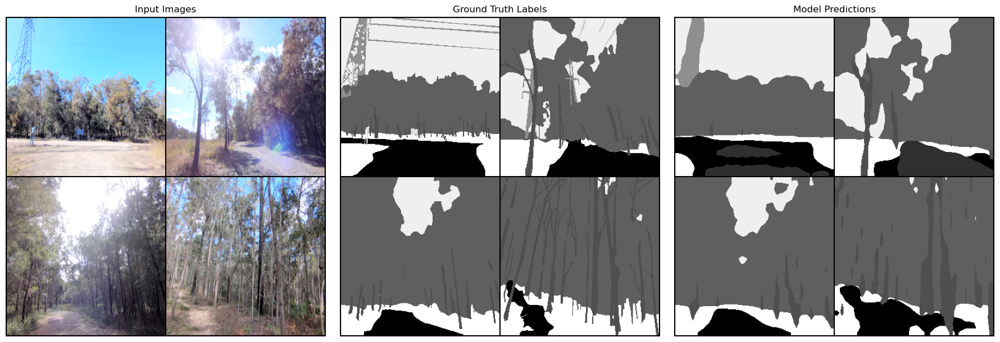

Epoch 8/10


Training:   1%|          | 1/103 [00:02<03:50,  2.26s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.321]

1


Training:   2%|▏         | 2/103 [00:04<03:43,  2.21s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:   3%|▎         | 3/103 [00:06<03:45,  2.25s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.36] 

1


Training:   4%|▍         | 4/103 [00:08<03:43,  2.26s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.354]

1


Training:   5%|▍         | 5/103 [00:11<03:44,  2.29s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.349]

1


Training:   6%|▌         | 6/103 [00:13<03:41,  2.28s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.352]

1


Training:   7%|▋         | 7/103 [00:16<03:43,  2.32s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:   8%|▊         | 8/103 [00:18<03:42,  2.34s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.34] 

1


Training:   9%|▊         | 9/103 [00:20<03:37,  2.31s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.342]

1


Training:  10%|▉         | 10/103 [00:22<03:31,  2.27s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.342]

1


Training:  11%|█         | 11/103 [00:25<03:29,  2.27s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.34] 

1


Training:  12%|█▏        | 12/103 [00:27<03:27,  2.28s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.341]

1


Training:  13%|█▎        | 13/103 [00:29<03:28,  2.32s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.342]

1


Training:  14%|█▎        | 14/103 [00:32<03:25,  2.31s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.342]

1


Training:  15%|█▍        | 15/103 [00:34<03:23,  2.31s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.341]

1


Training:  16%|█▌        | 16/103 [00:36<03:18,  2.28s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.34] 

1


Training:  17%|█▋        | 17/103 [00:38<03:13,  2.25s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.341]

1


Training:  17%|█▋        | 18/103 [00:41<03:10,  2.24s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.341]

1


Training:  18%|█▊        | 19/103 [00:43<03:09,  2.25s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.341]

1


Training:  19%|█▉        | 20/103 [00:45<03:08,  2.27s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.341]

1


Training:  20%|██        | 21/103 [00:47<03:04,  2.25s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.34] 

1


Training:  21%|██▏       | 22/103 [00:50<03:01,  2.24s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.34]

1


Training:  22%|██▏       | 23/103 [00:52<02:57,  2.22s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.339]

1


Training:  23%|██▎       | 24/103 [00:54<02:59,  2.28s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.339]

1


Training:  24%|██▍       | 25/103 [00:57<03:04,  2.37s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.338]

1


Training:  25%|██▌       | 26/103 [00:59<02:58,  2.32s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.34] 

1


Training:  26%|██▌       | 27/103 [01:01<02:55,  2.31s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.34]

1


Training:  27%|██▋       | 28/103 [01:03<02:52,  2.30s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.34]

1


Training:  28%|██▊       | 29/103 [01:06<02:48,  2.28s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  29%|██▉       | 30/103 [01:08<02:44,  2.26s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.343]

1


Training:  30%|███       | 31/103 [01:10<02:41,  2.24s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.343]

1


Training:  31%|███       | 32/103 [01:12<02:38,  2.23s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  32%|███▏      | 33/103 [01:15<02:35,  2.22s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.343]

1


Training:  33%|███▎      | 34/103 [01:17<02:35,  2.25s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  34%|███▍      | 35/103 [01:19<02:33,  2.26s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  35%|███▍      | 36/103 [01:21<02:31,  2.26s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.346]

1


Training:  36%|███▌      | 37/103 [01:24<02:30,  2.29s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.346]

1


Training:  37%|███▋      | 38/103 [01:26<02:30,  2.32s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  38%|███▊      | 39/103 [01:28<02:29,  2.33s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  39%|███▉      | 40/103 [01:31<02:24,  2.30s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.346]

1


Training:  40%|███▉      | 41/103 [01:33<02:24,  2.33s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  41%|████      | 42/103 [01:36<02:26,  2.40s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  42%|████▏     | 43/103 [01:38<02:20,  2.35s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.346]

1


Training:  43%|████▎     | 44/103 [01:40<02:15,  2.30s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  44%|████▎     | 45/103 [01:42<02:14,  2.33s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.346]

1


Training:  45%|████▍     | 46/103 [01:45<02:13,  2.35s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.346]

1


Training:  46%|████▌     | 47/103 [01:47<02:11,  2.34s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.346]

1


Training:  47%|████▋     | 48/103 [01:50<02:07,  2.33s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.346]

1


Training:  48%|████▊     | 49/103 [01:52<02:09,  2.40s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  49%|████▊     | 50/103 [01:54<02:06,  2.39s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  50%|████▉     | 51/103 [01:57<02:02,  2.35s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  50%|█████     | 52/103 [01:59<01:58,  2.33s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  51%|█████▏    | 53/103 [02:01<01:56,  2.32s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  52%|█████▏    | 54/103 [02:04<01:54,  2.35s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  53%|█████▎    | 55/103 [02:06<01:51,  2.33s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.346]

1


Training:  54%|█████▍    | 56/103 [02:08<01:48,  2.32s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.347]

1


Training:  55%|█████▌    | 57/103 [02:11<01:46,  2.32s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.346]

1


Training:  56%|█████▋    | 58/103 [02:13<01:42,  2.29s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.346]

1


Training:  57%|█████▋    | 59/103 [02:15<01:39,  2.26s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.346]

1


Training:  58%|█████▊    | 60/103 [02:17<01:37,  2.26s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.346]

1


Training:  59%|█████▉    | 61/103 [02:20<01:36,  2.30s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  60%|██████    | 62/103 [02:22<01:33,  2.27s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  61%|██████    | 63/103 [02:24<01:30,  2.25s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  62%|██████▏   | 64/103 [02:26<01:28,  2.28s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  63%|██████▎   | 65/103 [02:29<01:26,  2.28s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  64%|██████▍   | 66/103 [02:31<01:24,  2.28s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  65%|██████▌   | 67/103 [02:33<01:22,  2.28s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  66%|██████▌   | 68/103 [02:35<01:18,  2.26s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  67%|██████▋   | 69/103 [02:38<01:18,  2.30s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  68%|██████▊   | 70/103 [02:40<01:18,  2.38s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  69%|██████▉   | 71/103 [02:43<01:14,  2.34s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  70%|██████▉   | 72/103 [02:45<01:12,  2.35s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  71%|███████   | 73/103 [02:47<01:11,  2.38s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  72%|███████▏  | 74/103 [02:50<01:07,  2.32s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  73%|███████▎  | 75/103 [02:52<01:04,  2.29s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  74%|███████▍  | 76/103 [02:54<01:03,  2.37s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  75%|███████▍  | 77/103 [02:57<01:00,  2.33s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:  76%|███████▌  | 78/103 [02:59<00:57,  2.29s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  77%|███████▋  | 79/103 [03:01<00:55,  2.32s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  78%|███████▊  | 80/103 [03:04<00:53,  2.31s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  79%|███████▊  | 81/103 [03:06<00:50,  2.30s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  80%|███████▉  | 82/103 [03:08<00:47,  2.28s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  81%|████████  | 83/103 [03:10<00:45,  2.28s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  82%|████████▏ | 84/103 [03:13<00:43,  2.29s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  83%|████████▎ | 85/103 [03:15<00:40,  2.27s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  83%|████████▎ | 86/103 [03:17<00:39,  2.31s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  84%|████████▍ | 87/103 [03:19<00:36,  2.27s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  85%|████████▌ | 88/103 [03:22<00:33,  2.25s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  86%|████████▋ | 89/103 [03:24<00:32,  2.33s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  87%|████████▋ | 90/103 [03:26<00:30,  2.32s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  88%|████████▊ | 91/103 [03:29<00:28,  2.34s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  89%|████████▉ | 92/103 [03:31<00:25,  2.34s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  90%|█████████ | 93/103 [03:33<00:23,  2.32s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  91%|█████████▏| 94/103 [03:36<00:21,  2.34s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  92%|█████████▏| 95/103 [03:38<00:19,  2.39s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  93%|█████████▎| 96/103 [03:41<00:16,  2.40s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]

1


Training:  94%|█████████▍| 97/103 [03:43<00:14,  2.36s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.343]

1


Training:  95%|█████████▌| 98/103 [03:45<00:11,  2.37s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.343]

1


Training:  96%|█████████▌| 99/103 [03:48<00:09,  2.32s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.343]

1


Training:  97%|█████████▋| 100/103 [03:50<00:06,  2.28s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.343]

1


Training:  98%|█████████▊| 101/103 [03:52<00:04,  2.26s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.343]

1


Training:  99%|█████████▉| 102/103 [03:54<00:02,  2.30s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.343]

1


Training: 100%|██████████| 103/103 [03:55<00:00,  2.29s/it, epoch=8, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.344]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:48<00:00,  2.20s/it, gpu_memory=6.18 GB, lr=0.0001, valid_loss=0.489]


Saved Best Model


compute_mIoU: 100%|██████████| 22/22 [00:48<00:00,  2.18s/it]


Validation metric:
mIoU: 27.99
mPA: 34.51
Accuracy: 82.55
plot valid image


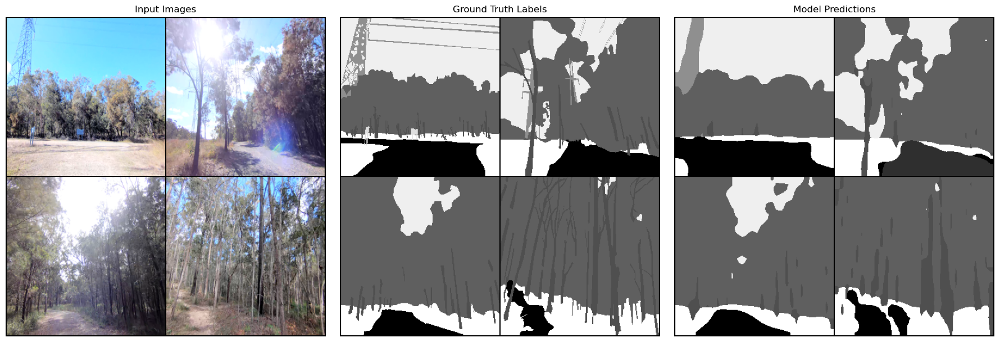

Epoch 9/10


Training:   1%|          | 1/103 [00:02<04:02,  2.38s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.37]

1


Training:   2%|▏         | 2/103 [00:04<03:54,  2.32s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.361]

1


Training:   3%|▎         | 3/103 [00:07<03:58,  2.38s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.351]

1


Training:   4%|▍         | 4/103 [00:09<03:55,  2.38s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.363]

1


Training:   5%|▍         | 5/103 [00:11<03:48,  2.33s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.349]

1


Training:   6%|▌         | 6/103 [00:13<03:41,  2.28s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.346]

1


Training:   7%|▋         | 7/103 [00:16<03:42,  2.32s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.345]

1


Training:   8%|▊         | 8/103 [00:18<03:36,  2.28s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.347]

1


Training:   9%|▊         | 9/103 [00:20<03:31,  2.25s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.341]

1


Training:  10%|▉         | 10/103 [00:22<03:28,  2.24s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.34]

1


Training:  11%|█         | 11/103 [00:25<03:24,  2.23s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.337]

1


Training:  12%|█▏        | 12/103 [00:27<03:22,  2.22s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.339]

1


Training:  13%|█▎        | 13/103 [00:29<03:23,  2.26s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.335]

1


Training:  14%|█▎        | 14/103 [00:32<03:23,  2.28s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.333]

1


Training:  15%|█▍        | 15/103 [00:34<03:20,  2.28s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.332]

1


Training:  16%|█▌        | 16/103 [00:36<03:17,  2.26s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.333]

1


Training:  17%|█▋        | 17/103 [00:38<03:13,  2.24s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.333]

1


Training:  17%|█▋        | 18/103 [00:40<03:09,  2.23s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.333]

1


Training:  18%|█▊        | 19/103 [00:43<03:10,  2.27s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.334]

1


Training:  19%|█▉        | 20/103 [00:45<03:08,  2.27s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.332]

1


Training:  20%|██        | 21/103 [00:48<03:10,  2.33s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.333]

1


Training:  21%|██▏       | 22/103 [00:50<03:13,  2.38s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.332]

1


Training:  22%|██▏       | 23/103 [00:52<03:08,  2.35s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.33] 

1


Training:  23%|██▎       | 24/103 [00:55<03:05,  2.34s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.331]

1


Training:  24%|██▍       | 25/103 [00:57<03:03,  2.35s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.331]

1


Training:  25%|██▌       | 26/103 [00:59<02:57,  2.31s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.331]

1


Training:  26%|██▌       | 27/103 [01:01<02:53,  2.28s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.331]

1


Training:  27%|██▋       | 28/103 [01:04<03:01,  2.42s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.33] 

1


Training:  28%|██▊       | 29/103 [01:06<02:55,  2.37s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.329]

1


Training:  29%|██▉       | 30/103 [01:09<02:53,  2.37s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.33] 

1


Training:  30%|███       | 31/103 [01:11<02:50,  2.37s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.329]

1


Training:  31%|███       | 32/103 [01:13<02:45,  2.34s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.329]

1


Training:  32%|███▏      | 33/103 [01:16<02:40,  2.29s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.329]

1


Training:  33%|███▎      | 34/103 [01:18<02:40,  2.33s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.328]

1


Training:  34%|███▍      | 35/103 [01:20<02:39,  2.35s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.327]

1


Training:  35%|███▍      | 36/103 [01:23<02:34,  2.31s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.326]

1


Training:  36%|███▌      | 37/103 [01:25<02:29,  2.27s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.325]

1


Training:  37%|███▋      | 38/103 [01:27<02:26,  2.25s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.325]

1


Training:  38%|███▊      | 39/103 [01:29<02:23,  2.24s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.325]

1


Training:  39%|███▉      | 40/103 [01:32<02:23,  2.28s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.326]

1


Training:  40%|███▉      | 41/103 [01:34<02:20,  2.27s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.325]

1


Training:  41%|████      | 42/103 [01:36<02:20,  2.30s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.325]

1


Training:  42%|████▏     | 43/103 [01:38<02:16,  2.27s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.326]

1


Training:  43%|████▎     | 44/103 [01:41<02:15,  2.30s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.326]

1


Training:  44%|████▎     | 45/103 [01:43<02:12,  2.28s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.326]

1


Training:  45%|████▍     | 46/103 [01:45<02:08,  2.26s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.326]

1


Training:  46%|████▌     | 47/103 [01:48<02:08,  2.30s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.325]

1


Training:  47%|████▋     | 48/103 [01:50<02:04,  2.27s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.325]

1


Training:  48%|████▊     | 49/103 [01:52<02:04,  2.30s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.324]

1


Training:  49%|████▊     | 50/103 [01:54<02:00,  2.28s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  50%|████▉     | 51/103 [01:57<01:58,  2.28s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  50%|█████     | 52/103 [01:59<01:56,  2.29s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  51%|█████▏    | 53/103 [02:01<01:54,  2.29s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.324]

1


Training:  52%|█████▏    | 54/103 [02:04<01:52,  2.29s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.324]

1


Training:  53%|█████▎    | 55/103 [02:06<01:48,  2.27s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.324]

1


Training:  54%|█████▍    | 56/103 [02:08<01:47,  2.29s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.324]

1


Training:  55%|█████▌    | 57/103 [02:10<01:44,  2.28s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.324]

1


Training:  56%|█████▋    | 58/103 [02:13<01:41,  2.26s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  57%|█████▋    | 59/103 [02:15<01:41,  2.30s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  58%|█████▊    | 60/103 [02:17<01:39,  2.32s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.322]

1


Training:  59%|█████▉    | 61/103 [02:20<01:36,  2.30s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.322]

1


Training:  60%|██████    | 62/103 [02:22<01:32,  2.27s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.322]

1


Training:  61%|██████    | 63/103 [02:24<01:30,  2.26s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  62%|██████▏   | 64/103 [02:26<01:28,  2.28s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  63%|██████▎   | 65/103 [02:29<01:26,  2.26s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  64%|██████▍   | 66/103 [02:31<01:22,  2.24s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  65%|██████▌   | 67/103 [02:33<01:21,  2.26s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  66%|██████▌   | 68/103 [02:35<01:19,  2.27s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  67%|██████▋   | 69/103 [02:38<01:18,  2.30s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  68%|██████▊   | 70/103 [02:40<01:17,  2.34s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  69%|██████▉   | 71/103 [02:43<01:15,  2.35s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  70%|██████▉   | 72/103 [02:45<01:14,  2.40s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  71%|███████   | 73/103 [02:47<01:11,  2.37s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  72%|███████▏  | 74/103 [02:50<01:07,  2.32s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  73%|███████▎  | 75/103 [02:52<01:04,  2.31s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.322]

1


Training:  74%|███████▍  | 76/103 [02:54<01:01,  2.28s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  75%|███████▍  | 77/103 [02:56<01:00,  2.32s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  76%|███████▌  | 78/103 [02:59<00:57,  2.31s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.324]

1


Training:  77%|███████▋  | 79/103 [03:01<00:55,  2.30s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.324]

1


Training:  78%|███████▊  | 80/103 [03:04<00:54,  2.36s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  79%|███████▊  | 81/103 [03:06<00:51,  2.35s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.324]

1


Training:  80%|███████▉  | 82/103 [03:08<00:50,  2.39s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.324]

1


Training:  81%|████████  | 83/103 [03:11<00:48,  2.43s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  82%|████████▏ | 84/103 [03:13<00:46,  2.45s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.324]

1


Training:  83%|████████▎ | 85/103 [03:16<00:43,  2.43s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  83%|████████▎ | 86/103 [03:18<00:41,  2.42s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  84%|████████▍ | 87/103 [03:21<00:38,  2.42s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  85%|████████▌ | 88/103 [03:23<00:35,  2.39s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  86%|████████▋ | 89/103 [03:25<00:32,  2.35s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  87%|████████▋ | 90/103 [03:27<00:30,  2.35s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  88%|████████▊ | 91/103 [03:30<00:27,  2.33s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  89%|████████▉ | 92/103 [03:32<00:25,  2.29s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  90%|█████████ | 93/103 [03:34<00:22,  2.28s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.322]

1


Training:  91%|█████████▏| 94/103 [03:37<00:20,  2.28s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  92%|█████████▏| 95/103 [03:39<00:18,  2.27s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  93%|█████████▎| 96/103 [03:41<00:16,  2.30s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  94%|█████████▍| 97/103 [03:43<00:13,  2.28s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  95%|█████████▌| 98/103 [03:46<00:11,  2.30s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  96%|█████████▌| 99/103 [03:48<00:09,  2.29s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  97%|█████████▋| 100/103 [03:50<00:06,  2.30s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.323]

1


Training:  98%|█████████▊| 101/103 [03:53<00:04,  2.28s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.322]

1


Training:  99%|█████████▉| 102/103 [03:55<00:02,  2.32s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.322]

1


Training: 100%|██████████| 103/103 [03:56<00:00,  2.29s/it, epoch=9, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.322]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:48<00:00,  2.21s/it, gpu_memory=6.18 GB, lr=0.0001, valid_loss=0.489]


Epoch 10/10


Training:   1%|          | 1/103 [00:02<03:52,  2.28s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.316]

1


Training:   2%|▏         | 2/103 [00:04<03:52,  2.30s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.324]

1


Training:   3%|▎         | 3/103 [00:06<03:47,  2.27s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.324]

1


Training:   4%|▍         | 4/103 [00:09<03:42,  2.25s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.331]

1


Training:   5%|▍         | 5/103 [00:11<03:38,  2.23s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.326]

1


Training:   6%|▌         | 6/103 [00:13<03:39,  2.26s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.329]

1


Training:   7%|▋         | 7/103 [00:15<03:40,  2.30s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.326]

1


Training:   8%|▊         | 8/103 [00:18<03:38,  2.30s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.322]

1


Training:   9%|▊         | 9/103 [00:20<03:36,  2.30s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.317]

1


Training:  10%|▉         | 10/103 [00:22<03:33,  2.30s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.317]

1


Training:  11%|█         | 11/103 [00:25<03:28,  2.26s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.313]

1


Training:  12%|█▏        | 12/103 [00:27<03:29,  2.31s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.314]

1


Training:  13%|█▎        | 13/103 [00:29<03:24,  2.28s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.312]

1


Training:  14%|█▎        | 14/103 [00:31<03:23,  2.28s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.31] 

1


Training:  15%|█▍        | 15/103 [00:34<03:26,  2.35s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.312]

1


Training:  16%|█▌        | 16/103 [00:36<03:25,  2.36s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.31] 

1


Training:  17%|█▋        | 17/103 [00:39<03:19,  2.32s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.31]

1


Training:  17%|█▋        | 18/103 [00:41<03:18,  2.33s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.308]

1


Training:  18%|█▊        | 19/103 [00:43<03:13,  2.30s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.308]

1


Training:  19%|█▉        | 20/103 [00:45<03:08,  2.27s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.307]

1


Training:  20%|██        | 21/103 [00:48<03:04,  2.25s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.308]

1


Training:  21%|██▏       | 22/103 [00:50<03:04,  2.27s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.307]

1


Training:  22%|██▏       | 23/103 [00:52<03:04,  2.31s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.307]

1


Training:  23%|██▎       | 24/103 [00:55<03:01,  2.30s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.307]

1


Training:  24%|██▍       | 25/103 [00:57<02:58,  2.29s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.308]

1


Training:  25%|██▌       | 26/103 [00:59<02:57,  2.30s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.309]

1


Training:  26%|██▌       | 27/103 [01:01<02:55,  2.31s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.308]

1


Training:  27%|██▋       | 28/103 [01:04<02:52,  2.30s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.307]

1


Training:  28%|██▊       | 29/103 [01:06<02:47,  2.27s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.306]

1


Training:  29%|██▉       | 30/103 [01:08<02:44,  2.25s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.305]

1


Training:  30%|███       | 31/103 [01:10<02:40,  2.23s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.305]

1


Training:  31%|███       | 32/103 [01:13<02:37,  2.22s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.305]

1


Training:  32%|███▏      | 33/103 [01:15<02:36,  2.24s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.306]

1


Training:  33%|███▎      | 34/103 [01:17<02:35,  2.25s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.307]

1


Training:  34%|███▍      | 35/103 [01:19<02:32,  2.25s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.307]

1


Training:  35%|███▍      | 36/103 [01:21<02:29,  2.23s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.306]

1


Training:  36%|███▌      | 37/103 [01:24<02:30,  2.29s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.306]

1


Training:  37%|███▋      | 38/103 [01:26<02:28,  2.29s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.305]

1


Training:  38%|███▊      | 39/103 [01:28<02:26,  2.28s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.305]

1


Training:  39%|███▉      | 40/103 [01:31<02:23,  2.27s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.304]

1


Training:  40%|███▉      | 41/103 [01:33<02:19,  2.24s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  41%|████      | 42/103 [01:35<02:19,  2.29s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  42%|████▏     | 43/103 [01:38<02:19,  2.33s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  43%|████▎     | 44/103 [01:40<02:22,  2.41s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  44%|████▎     | 45/103 [01:43<02:19,  2.41s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  45%|████▍     | 46/103 [01:45<02:16,  2.40s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  46%|████▌     | 47/103 [01:47<02:10,  2.34s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  47%|████▋     | 48/103 [01:50<02:06,  2.30s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.302]

1


Training:  48%|████▊     | 49/103 [01:52<02:02,  2.27s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.302]

1


Training:  49%|████▊     | 50/103 [01:54<01:59,  2.25s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  50%|████▉     | 51/103 [01:56<01:58,  2.29s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.304]

1


Training:  50%|█████     | 52/103 [01:59<01:55,  2.27s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.305]

1


Training:  51%|█████▏    | 53/103 [02:01<01:54,  2.28s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.305]

1


Training:  52%|█████▏    | 54/103 [02:03<01:51,  2.28s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.305]

1


Training:  53%|█████▎    | 55/103 [02:05<01:50,  2.31s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.305]

1


Training:  54%|█████▍    | 56/103 [02:08<01:49,  2.33s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.305]

1


Training:  55%|█████▌    | 57/103 [02:10<01:46,  2.31s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.305]

1


Training:  56%|█████▋    | 58/103 [02:13<01:45,  2.34s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.305]

1


Training:  57%|█████▋    | 59/103 [02:15<01:43,  2.35s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.305]

1


Training:  58%|█████▊    | 60/103 [02:17<01:39,  2.31s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.304]

1


Training:  59%|█████▉    | 61/103 [02:19<01:36,  2.30s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.304]

1


Training:  60%|██████    | 62/103 [02:22<01:34,  2.30s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.304]

1


Training:  61%|██████    | 63/103 [02:24<01:30,  2.27s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  62%|██████▏   | 64/103 [02:26<01:29,  2.29s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  63%|██████▎   | 65/103 [02:29<01:28,  2.32s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  64%|██████▍   | 66/103 [02:31<01:25,  2.31s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  65%|██████▌   | 67/103 [02:33<01:24,  2.34s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.302]

1


Training:  66%|██████▌   | 68/103 [02:36<01:21,  2.33s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.302]

1


Training:  67%|██████▋   | 69/103 [02:38<01:18,  2.32s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.302]

1


Training:  68%|██████▊   | 70/103 [02:40<01:16,  2.33s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.302]

1


Training:  69%|██████▉   | 71/103 [02:42<01:13,  2.30s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.301]

1


Training:  70%|██████▉   | 72/103 [02:45<01:11,  2.32s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.301]

1


Training:  71%|███████   | 73/103 [02:47<01:10,  2.35s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.302]

1


Training:  72%|███████▏  | 74/103 [02:50<01:08,  2.36s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.301]

1


Training:  73%|███████▎  | 75/103 [02:52<01:05,  2.33s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.301]

1


Training:  74%|███████▍  | 76/103 [02:54<01:02,  2.33s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.301]

1


Training:  75%|███████▍  | 77/103 [02:57<01:01,  2.35s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.301]

1


Training:  76%|███████▌  | 78/103 [02:59<00:59,  2.38s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.301]

1


Training:  77%|███████▋  | 79/103 [03:01<00:55,  2.33s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.301]

1


Training:  78%|███████▊  | 80/103 [03:04<00:53,  2.34s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.302]

1


Training:  79%|███████▊  | 81/103 [03:06<00:50,  2.30s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.302]

1


Training:  80%|███████▉  | 82/103 [03:08<00:47,  2.27s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.302]

1


Training:  81%|████████  | 83/103 [03:10<00:45,  2.29s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.302]

1


Training:  82%|████████▏ | 84/103 [03:13<00:43,  2.27s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.302]

1


Training:  83%|████████▎ | 85/103 [03:15<00:42,  2.36s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.302]

1


Training:  83%|████████▎ | 86/103 [03:17<00:39,  2.33s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.302]

1


Training:  84%|████████▍ | 87/103 [03:20<00:36,  2.30s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.302]

1


Training:  85%|████████▌ | 88/103 [03:22<00:34,  2.27s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.302]

1


Training:  86%|████████▋ | 89/103 [03:24<00:31,  2.24s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  87%|████████▋ | 90/103 [03:26<00:29,  2.27s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  88%|████████▊ | 91/103 [03:29<00:27,  2.27s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  89%|████████▉ | 92/103 [03:31<00:25,  2.31s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  90%|█████████ | 93/103 [03:33<00:23,  2.31s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  91%|█████████▏| 94/103 [03:36<00:20,  2.30s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  92%|█████████▏| 95/103 [03:38<00:18,  2.33s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.303]

1


Training:  93%|█████████▎| 96/103 [03:40<00:16,  2.35s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.304]

1


Training:  94%|█████████▍| 97/103 [03:43<00:14,  2.42s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.304]

1


Training:  95%|█████████▌| 98/103 [03:45<00:12,  2.42s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.304]

1


Training:  96%|█████████▌| 99/103 [03:48<00:09,  2.46s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.304]

1


Training:  97%|█████████▋| 100/103 [03:50<00:07,  2.41s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.304]

1


Training:  98%|█████████▊| 101/103 [03:53<00:04,  2.39s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.304]

1


Training:  99%|█████████▉| 102/103 [03:55<00:02,  2.39s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.304]

1


Training: 100%|██████████| 103/103 [03:56<00:00,  2.29s/it, epoch=10, gpu_mem=6.18 GB, lr=0.0001, train_loss=0.304]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:48<00:00,  2.20s/it, gpu_memory=6.18 GB, lr=0.0001, valid_loss=0.505]


In [25]:
model_deeplabv3.to(device)

optimizer = optim.Adam(model_deeplabv3.parameters(), lr=1e-4, weight_decay=1e-6)

runner = ModelTrainValid(model_deeplabv3, device, num_classes, train_loader, val_loader, test_loader, optimizer)
model_deeplabv3, history_deeplabv3 = runner.do_training(num_epochs=10, save_name='deeplabv3')

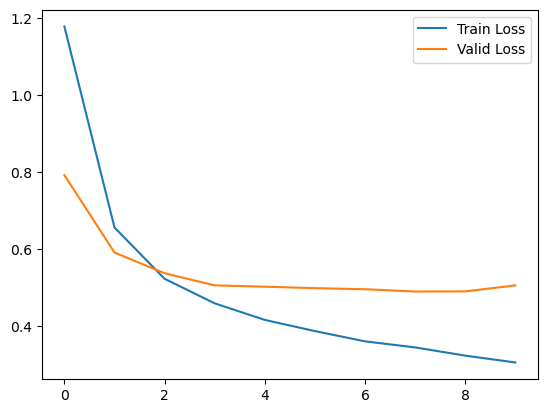

In [26]:
df = pd.DataFrame(history_deeplabv3)
df.plot()
plt.show()

### test

In [27]:
IoUs, PA_Recall, Precision = runner.mIoU_compute(runner.test_loader)

compute_mIoU: 100%|██████████| 22/22 [00:49<00:00,  2.23s/it]

Validation metric:
mIoU: 29.74
mPA: 37.82
Accuracy: 82.82


In [28]:
result_data_deeplabv3 = {name_classes[i]: (IoUs[i], PA_Recall[i], Precision[i]) for i in range(num_classes)}

result_df_deeplabv3 = pd.DataFrame(result_data_deeplabv3).T
result_df_deeplabv3.rename(columns={0: 'IoU', 1:'PA_Recal', 2:'Precision'}, inplace=True)
result_df_deeplabv3

,IoU,PA_Recal,Precision
unlabelled,0.000000,0.000000,0.000000
asphalt,0.000000,0.000000,0.000000
dirt,0.628293,0.766735,0.776770
mud,0.093182,0.225150,0.137171
water,0.676176,0.798269,0.815531
gravel,0.661418,0.955268,0.682558
other-terrain,0.014982,0.015029,0.828431
tree-trunk,0.409373,0.492334,0.708406
tree-foliage,0.816517,0.932113,0.868144
bush,0.129607,0.145681,0.540153


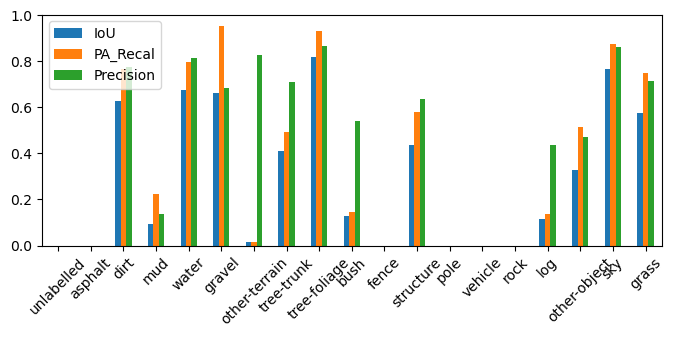

In [29]:
result_df_deeplabv3.plot(kind='bar', figsize=(8, 3), rot=45)
plt.show()

## Ensemble

D:\Anaconda\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
D:\Anaconda\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=FCN_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=FCN_ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
D:\Anaconda\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=DeepLabV3_ResNet50_Weights.COCO_WITH_VOC_LABELS_V1`. You can also use `weights=DeepLabV3_ResNet50_Weights.DEFAULT` to get the mo

Epoch 1/10


Training:   1%|          | 1/103 [00:02<04:10,  2.46s/it, epoch=1, gpu_mem=11.23 GB, lr=0.0001, train_loss=2.99]

1


Training:   2%|▏         | 2/103 [00:04<03:56,  2.34s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=2.69]

1


Training:   3%|▎         | 3/103 [00:07<03:54,  2.35s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=2.51]

1


Training:   4%|▍         | 4/103 [00:09<03:57,  2.39s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=2.34]

1


Training:   5%|▍         | 5/103 [00:11<03:54,  2.39s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=2.18]

1


Training:   6%|▌         | 6/103 [00:14<03:57,  2.45s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=2.06]

1


Training:   7%|▋         | 7/103 [00:17<04:00,  2.50s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.96]

1


Training:   8%|▊         | 8/103 [00:19<03:55,  2.48s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.88]

1


Training:   9%|▊         | 9/103 [00:21<03:50,  2.45s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.79]

1


Training:  10%|▉         | 10/103 [00:24<03:47,  2.44s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.72]

1


Training:  11%|█         | 11/103 [00:26<03:43,  2.42s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.67]

1


Training:  12%|█▏        | 12/103 [00:29<03:46,  2.49s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.62]

1


Training:  13%|█▎        | 13/103 [00:31<03:44,  2.50s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.58]

1


Training:  14%|█▎        | 14/103 [00:34<03:39,  2.47s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.54]

1


Training:  15%|█▍        | 15/103 [00:36<03:35,  2.44s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.5] 

1


Training:  16%|█▌        | 16/103 [00:39<03:31,  2.43s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.46]

1


Training:  17%|█▋        | 17/103 [00:41<03:29,  2.44s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.43]

1


Training:  17%|█▋        | 18/103 [00:44<03:31,  2.49s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.4] 

1


Training:  18%|█▊        | 19/103 [00:46<03:25,  2.45s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.37]

1


Training:  19%|█▉        | 20/103 [00:48<03:20,  2.42s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.35]

1


Training:  20%|██        | 21/103 [00:51<03:19,  2.43s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.32]

1


Training:  21%|██▏       | 22/103 [00:53<03:16,  2.42s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.3] 

1


Training:  22%|██▏       | 23/103 [00:56<03:12,  2.41s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.28]

1


Training:  23%|██▎       | 24/103 [00:58<03:09,  2.39s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.26]

1


Training:  24%|██▍       | 25/103 [01:01<03:13,  2.48s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.24]

1


Training:  25%|██▌       | 26/103 [01:03<03:07,  2.44s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.22]

1


Training:  26%|██▌       | 27/103 [01:05<03:04,  2.43s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.2] 

1


Training:  27%|██▋       | 28/103 [01:08<02:58,  2.38s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.18]

1


Training:  28%|██▊       | 29/103 [01:10<02:59,  2.43s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.17]

1


Training:  29%|██▉       | 30/103 [01:12<02:53,  2.38s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.15]

1


Training:  30%|███       | 31/103 [01:15<02:51,  2.38s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.14]

1


Training:  31%|███       | 32/103 [01:17<02:49,  2.38s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.12]

1


Training:  32%|███▏      | 33/103 [01:20<02:46,  2.37s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.12]

1


Training:  33%|███▎      | 34/103 [01:22<02:44,  2.39s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.11]

1


Training:  34%|███▍      | 35/103 [01:24<02:39,  2.34s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.09]

1


Training:  35%|███▍      | 36/103 [01:27<02:36,  2.34s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.08]

1


Training:  36%|███▌      | 37/103 [01:29<02:35,  2.35s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.07]

1


Training:  37%|███▋      | 38/103 [01:31<02:35,  2.38s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.06]

1


Training:  38%|███▊      | 39/103 [01:34<02:35,  2.44s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.05]

1


Training:  39%|███▉      | 40/103 [01:36<02:34,  2.45s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.04]

1


Training:  40%|███▉      | 41/103 [01:39<02:30,  2.43s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.03]

1


Training:  41%|████      | 42/103 [01:41<02:31,  2.48s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.02]

1


Training:  42%|████▏     | 43/103 [01:44<02:27,  2.46s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1.01]

1


Training:  43%|████▎     | 44/103 [01:46<02:23,  2.44s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=1]   

1


Training:  44%|████▎     | 45/103 [01:49<02:20,  2.43s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.994]

1


Training:  45%|████▍     | 46/103 [01:51<02:20,  2.46s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.986]

1


Training:  46%|████▌     | 47/103 [01:54<02:16,  2.44s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.978]

1


Training:  47%|████▋     | 48/103 [01:56<02:14,  2.45s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.971]

1


Training:  48%|████▊     | 49/103 [01:58<02:11,  2.43s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.963]

1


Training:  49%|████▊     | 50/103 [02:01<02:08,  2.42s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.955]

1


Training:  50%|████▉     | 51/103 [02:03<02:08,  2.47s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.953]

1


Training:  50%|█████     | 52/103 [02:06<02:04,  2.44s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.946]

1


Training:  51%|█████▏    | 53/103 [02:09<02:07,  2.55s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.939]

1


Training:  52%|█████▏    | 54/103 [02:11<02:03,  2.51s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.932]

1


Training:  53%|█████▎    | 55/103 [02:13<01:58,  2.46s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.926]

1


Training:  54%|█████▍    | 56/103 [02:16<01:58,  2.52s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.922]

1


Training:  55%|█████▌    | 57/103 [02:18<01:54,  2.48s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.915]

1


Training:  56%|█████▋    | 58/103 [02:21<01:48,  2.41s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.911]

1


Training:  57%|█████▋    | 59/103 [02:23<01:45,  2.40s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.906]

1


Training:  58%|█████▊    | 60/103 [02:25<01:43,  2.40s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.901]

1


Training:  59%|█████▉    | 61/103 [02:28<01:40,  2.40s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.896]

1


Training:  60%|██████    | 62/103 [02:30<01:41,  2.47s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.891]

1


Training:  61%|██████    | 63/103 [02:33<01:37,  2.43s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.886]

1


Training:  62%|██████▏   | 64/103 [02:35<01:33,  2.41s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.882]

1


Training:  63%|██████▎   | 65/103 [02:38<01:32,  2.42s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.877]

1


Training:  64%|██████▍   | 66/103 [02:40<01:28,  2.40s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.873]

1


Training:  65%|██████▌   | 67/103 [02:42<01:26,  2.40s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.868]

1


Training:  66%|██████▌   | 68/103 [02:45<01:24,  2.42s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.863]

1


Training:  67%|██████▋   | 69/103 [02:47<01:21,  2.40s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.858]

1


Training:  68%|██████▊   | 70/103 [02:50<01:19,  2.41s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.854]

1


Training:  69%|██████▉   | 71/103 [02:52<01:16,  2.40s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.849]

1


Training:  70%|██████▉   | 72/103 [02:54<01:14,  2.39s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.845]

1


Training:  71%|███████   | 73/103 [02:57<01:12,  2.40s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.84] 

1


Training:  72%|███████▏  | 74/103 [02:59<01:10,  2.42s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.836]

1


Training:  73%|███████▎  | 75/103 [03:02<01:07,  2.40s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.833]

1


Training:  74%|███████▍  | 76/103 [03:04<01:04,  2.39s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.829]

1


Training:  75%|███████▍  | 77/103 [03:06<01:02,  2.39s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.827]

1


Training:  76%|███████▌  | 78/103 [03:09<00:59,  2.40s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.823]

1


Training:  77%|███████▋  | 79/103 [03:11<00:57,  2.40s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.819]

1


Training:  78%|███████▊  | 80/103 [03:13<00:54,  2.38s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.816]

1


Training:  79%|███████▊  | 81/103 [03:16<00:51,  2.36s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.814]

1


Training:  80%|███████▉  | 82/103 [03:18<00:50,  2.42s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.811]

1


Training:  81%|████████  | 83/103 [03:21<00:47,  2.40s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.807]

1


Training:  82%|████████▏ | 84/103 [03:23<00:46,  2.43s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.804]

1


Training:  83%|████████▎ | 85/103 [03:26<00:43,  2.41s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.8]  

1


Training:  83%|████████▎ | 86/103 [03:28<00:40,  2.40s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.797]

1


Training:  84%|████████▍ | 87/103 [03:30<00:38,  2.39s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.794]

1


Training:  85%|████████▌ | 88/103 [03:33<00:36,  2.47s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.792]

1


Training:  86%|████████▋ | 89/103 [03:35<00:33,  2.42s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.79] 

1


Training:  87%|████████▋ | 90/103 [03:38<00:31,  2.42s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.786]

1


Training:  88%|████████▊ | 91/103 [03:40<00:28,  2.38s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.783]

1


Training:  89%|████████▉ | 92/103 [03:42<00:25,  2.33s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.78] 

1


Training:  90%|█████████ | 93/103 [03:45<00:23,  2.34s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.778]

1


Training:  91%|█████████▏| 94/103 [03:47<00:21,  2.37s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.776]

1


Training:  92%|█████████▏| 95/103 [03:49<00:18,  2.37s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.772]

1


Training:  93%|█████████▎| 96/103 [03:52<00:16,  2.36s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.77] 

1


Training:  94%|█████████▍| 97/103 [03:54<00:14,  2.39s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.767]

1


Training:  95%|█████████▌| 98/103 [03:57<00:12,  2.46s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.764]

1


Training:  96%|█████████▌| 99/103 [03:59<00:09,  2.49s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.761]

1


Training:  97%|█████████▋| 100/103 [04:02<00:07,  2.52s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.759]

1


Training:  98%|█████████▊| 101/103 [04:04<00:04,  2.44s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.757]

1


Training:  99%|█████████▉| 102/103 [04:07<00:02,  2.42s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.754]

1


Training: 100%|██████████| 103/103 [04:07<00:00,  2.40s/it, epoch=1, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.753]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:48<00:00,  2.21s/it, gpu_memory=11.77 GB, lr=0.0001, valid_loss=0.535]


Saved Best Model


compute_mIoU: 100%|██████████| 22/22 [00:48<00:00,  2.20s/it]


Validation metric:
mIoU: 19.47
mPA: 27.09
Accuracy: 80.18
plot valid image


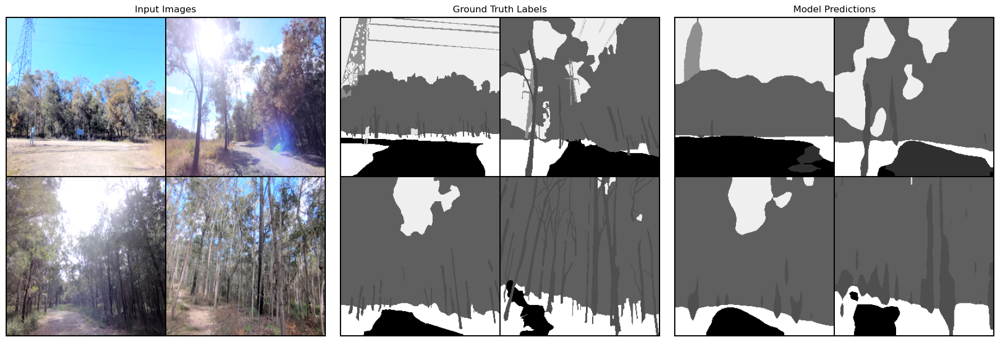

Epoch 2/10


Training:   1%|          | 1/103 [00:02<04:02,  2.38s/it, epoch=2, gpu_mem=11.77 GB, lr=0.0001, train_loss=0.455]

1


Training:   2%|▏         | 2/103 [00:04<04:09,  2.47s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.487]

1


Training:   3%|▎         | 3/103 [00:07<04:01,  2.42s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.496]

1


Training:   4%|▍         | 4/103 [00:09<03:53,  2.36s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.497]

1


Training:   5%|▍         | 5/103 [00:11<03:52,  2.38s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.499]

1


Training:   6%|▌         | 6/103 [00:14<03:50,  2.37s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.494]

1


Training:   7%|▋         | 7/103 [00:16<03:47,  2.37s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.486]

1


Training:   8%|▊         | 8/103 [00:18<03:42,  2.34s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.485]

1


Training:   9%|▊         | 9/103 [00:21<03:40,  2.34s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.496]

1


Training:  10%|▉         | 10/103 [00:23<03:39,  2.36s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.493]

1


Training:  11%|█         | 11/103 [00:25<03:34,  2.33s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.489]

1


Training:  12%|█▏        | 12/103 [00:28<03:32,  2.34s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.49] 

1


Training:  13%|█▎        | 13/103 [00:30<03:31,  2.35s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.49]

1


Training:  14%|█▎        | 14/103 [00:33<03:30,  2.36s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.498]

1


Training:  15%|█▍        | 15/103 [00:35<03:30,  2.39s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.502]

1


Training:  16%|█▌        | 16/103 [00:37<03:27,  2.38s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.5]  

1


Training:  17%|█▋        | 17/103 [00:40<03:24,  2.38s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.499]

1


Training:  17%|█▋        | 18/103 [00:42<03:22,  2.38s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.498]

1


Training:  18%|█▊        | 19/103 [00:44<03:17,  2.35s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.499]

1


Training:  19%|█▉        | 20/103 [00:47<03:21,  2.43s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.497]

1


Training:  20%|██        | 21/103 [00:50<03:22,  2.47s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.497]

1


Training:  21%|██▏       | 22/103 [00:52<03:18,  2.45s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.499]

1


Training:  22%|██▏       | 23/103 [00:54<03:14,  2.44s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.501]

1


Training:  23%|██▎       | 24/103 [00:57<03:16,  2.49s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.499]

1


Training:  24%|██▍       | 25/103 [00:59<03:10,  2.44s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.497]

1


Training:  25%|██▌       | 26/103 [01:02<03:04,  2.39s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.497]

1


Training:  26%|██▌       | 27/103 [01:04<03:02,  2.40s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.497]

1


Training:  27%|██▋       | 28/103 [01:06<02:59,  2.39s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.496]

1


Training:  28%|██▊       | 29/103 [01:09<02:55,  2.37s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.496]

1


Training:  29%|██▉       | 30/103 [01:11<02:53,  2.38s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.494]

1


Training:  30%|███       | 31/103 [01:13<02:49,  2.35s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.494]

1


Training:  31%|███       | 32/103 [01:16<02:48,  2.37s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.492]

1


Training:  32%|███▏      | 33/103 [01:18<02:45,  2.36s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.493]

1


Training:  33%|███▎      | 34/103 [01:21<02:42,  2.36s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.492]

1


Training:  34%|███▍      | 35/103 [01:23<02:38,  2.34s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.492]

1


Training:  35%|███▍      | 36/103 [01:25<02:37,  2.34s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.491]

1


Training:  36%|███▌      | 37/103 [01:28<02:35,  2.36s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.49] 

1


Training:  37%|███▋      | 38/103 [01:30<02:31,  2.33s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.488]

1


Training:  38%|███▊      | 39/103 [01:32<02:29,  2.33s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.486]

1


Training:  39%|███▉      | 40/103 [01:35<02:27,  2.34s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.486]

1


Training:  40%|███▉      | 41/103 [01:37<02:24,  2.33s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.485]

1


Training:  41%|████      | 42/103 [01:39<02:22,  2.34s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.483]

1


Training:  42%|████▏     | 43/103 [01:42<02:20,  2.34s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.483]

1


Training:  43%|████▎     | 44/103 [01:44<02:16,  2.31s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.481]

1


Training:  44%|████▎     | 45/103 [01:46<02:16,  2.35s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.481]

1


Training:  45%|████▍     | 46/103 [01:49<02:13,  2.35s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.481]

1


Training:  46%|████▌     | 47/103 [01:51<02:12,  2.37s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.481]

1


Training:  47%|████▋     | 48/103 [01:53<02:09,  2.36s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.481]

1


Training:  48%|████▊     | 49/103 [01:56<02:08,  2.38s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.48] 

1


Training:  49%|████▊     | 50/103 [01:58<02:06,  2.38s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.48]

1


Training:  50%|████▉     | 51/103 [02:00<02:01,  2.34s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.481]

1


Training:  50%|█████     | 52/103 [02:03<02:03,  2.41s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.48] 

1


Training:  51%|█████▏    | 53/103 [02:05<01:58,  2.37s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.48]

1


Training:  52%|█████▏    | 54/103 [02:08<01:59,  2.44s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.479]

1


Training:  53%|█████▎    | 55/103 [02:10<01:56,  2.42s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.478]

1


Training:  54%|█████▍    | 56/103 [02:13<01:53,  2.40s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.478]

1


Training:  55%|█████▌    | 57/103 [02:15<01:50,  2.40s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.478]

1


Training:  56%|█████▋    | 58/103 [02:17<01:46,  2.36s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.478]

1


Training:  57%|█████▋    | 59/103 [02:20<01:44,  2.37s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.479]

1


Training:  58%|█████▊    | 60/103 [02:22<01:41,  2.37s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.478]

1


Training:  59%|█████▉    | 61/103 [02:24<01:39,  2.37s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.478]

1


Training:  60%|██████    | 62/103 [02:27<01:35,  2.34s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.477]

1


Training:  61%|██████    | 63/103 [02:29<01:33,  2.34s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.478]

1


Training:  62%|██████▏   | 64/103 [02:31<01:32,  2.37s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.477]

1


Training:  63%|██████▎   | 65/103 [02:34<01:30,  2.38s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.477]

1


Training:  64%|██████▍   | 66/103 [02:36<01:27,  2.37s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.477]

1


Training:  65%|██████▌   | 67/103 [02:39<01:25,  2.38s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.477]

1


Training:  66%|██████▌   | 68/103 [02:41<01:23,  2.39s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.477]

1


Training:  67%|██████▋   | 69/103 [02:43<01:21,  2.38s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.476]

1


Training:  68%|██████▊   | 70/103 [02:46<01:18,  2.39s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.477]

1


Training:  69%|██████▉   | 71/103 [02:48<01:16,  2.40s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.477]

1


Training:  70%|██████▉   | 72/103 [02:50<01:12,  2.35s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.477]

1


Training:  71%|███████   | 73/103 [02:53<01:12,  2.41s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.477]

1


Training:  72%|███████▏  | 74/103 [02:56<01:11,  2.48s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.476]

1


Training:  73%|███████▎  | 75/103 [02:58<01:10,  2.53s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.474]

1


Training:  74%|███████▍  | 76/103 [03:01<01:08,  2.53s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.474]

1


Training:  75%|███████▍  | 77/103 [03:03<01:04,  2.50s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.473]

1


Training:  76%|███████▌  | 78/103 [03:06<01:01,  2.46s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.473]

1


Training:  77%|███████▋  | 79/103 [03:08<00:58,  2.45s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.473]

1


Training:  78%|███████▊  | 80/103 [03:11<00:57,  2.48s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.472]

1


Training:  79%|███████▊  | 81/103 [03:13<00:54,  2.46s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.472]

1


Training:  80%|███████▉  | 82/103 [03:15<00:51,  2.44s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.471]

1


Training:  81%|████████  | 83/103 [03:18<00:48,  2.42s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.471]

1


Training:  82%|████████▏ | 84/103 [03:21<00:48,  2.53s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.471]

1


Training:  83%|████████▎ | 85/103 [03:23<00:45,  2.52s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.471]

1


Training:  83%|████████▎ | 86/103 [03:25<00:42,  2.48s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.47] 

1


Training:  84%|████████▍ | 87/103 [03:28<00:39,  2.45s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.471]

1


Training:  85%|████████▌ | 88/103 [03:30<00:36,  2.43s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.471]

1


Training:  86%|████████▋ | 89/103 [03:33<00:33,  2.42s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.471]

1


Training:  87%|████████▋ | 90/103 [03:35<00:31,  2.41s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.471]

1


Training:  88%|████████▊ | 91/103 [03:37<00:28,  2.40s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.471]

1


Training:  89%|████████▉ | 92/103 [03:40<00:26,  2.39s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.471]

1


Training:  90%|█████████ | 93/103 [03:42<00:23,  2.36s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.47] 

1


Training:  91%|█████████▏| 94/103 [03:44<00:21,  2.38s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.47]

1


Training:  92%|█████████▏| 95/103 [03:47<00:18,  2.37s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.469]

1


Training:  93%|█████████▎| 96/103 [03:49<00:16,  2.38s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.469]

1


Training:  94%|█████████▍| 97/103 [03:52<00:14,  2.37s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.47] 

1


Training:  95%|█████████▌| 98/103 [03:54<00:11,  2.39s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.469]

1


Training:  96%|█████████▌| 99/103 [03:56<00:09,  2.40s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.469]

1


Training:  97%|█████████▋| 100/103 [03:59<00:07,  2.40s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.469]

1


Training:  98%|█████████▊| 101/103 [04:01<00:04,  2.39s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.469]

1


Training:  99%|█████████▉| 102/103 [04:03<00:02,  2.35s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.468]

1


Training: 100%|██████████| 103/103 [04:04<00:00,  2.37s/it, epoch=2, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.468]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:48<00:00,  2.22s/it, gpu_memory=11.91 GB, lr=0.0001, valid_loss=0.47] 


Saved Best Model


compute_mIoU: 100%|██████████| 22/22 [00:49<00:00,  2.27s/it]


Validation metric:
mIoU: 25.01
mPA: 31.74
Accuracy: 81.86
plot valid image


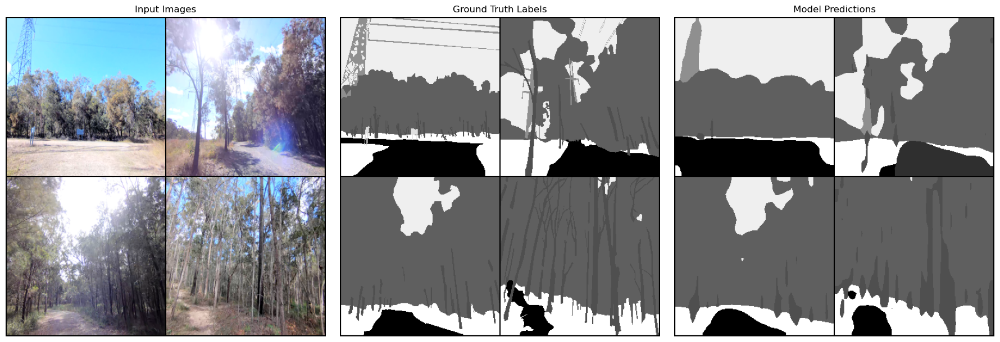

Epoch 3/10


Training:   1%|          | 1/103 [00:02<04:41,  2.76s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.422]

1


Training:   2%|▏         | 2/103 [00:05<04:16,  2.54s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.424]

1


Training:   3%|▎         | 3/103 [00:07<04:06,  2.47s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.422]

1


Training:   4%|▍         | 4/103 [00:09<03:59,  2.42s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.432]

1


Training:   5%|▍         | 5/103 [00:12<03:56,  2.41s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.431]

1


Training:   6%|▌         | 6/103 [00:14<03:51,  2.39s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.428]

1


Training:   7%|▋         | 7/103 [00:17<03:53,  2.43s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.426]

1


Training:   8%|▊         | 8/103 [00:19<03:49,  2.41s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.431]

1


Training:   9%|▊         | 9/103 [00:21<03:46,  2.41s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.427]

1


Training:  10%|▉         | 10/103 [00:24<03:42,  2.39s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.424]

1


Training:  11%|█         | 11/103 [00:26<03:40,  2.40s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.422]

1


Training:  12%|█▏        | 12/103 [00:29<03:37,  2.39s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.421]

1


Training:  13%|█▎        | 13/103 [00:31<03:35,  2.40s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.423]

1


Training:  14%|█▎        | 14/103 [00:33<03:33,  2.40s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.423]

1


Training:  15%|█▍        | 15/103 [00:36<03:41,  2.52s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.425]

1


Training:  16%|█▌        | 16/103 [00:38<03:32,  2.44s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.424]

1


Training:  17%|█▋        | 17/103 [00:41<03:27,  2.41s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.422]

1


Training:  17%|█▋        | 18/103 [00:43<03:23,  2.40s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.423]

1


Training:  18%|█▊        | 19/103 [00:46<03:22,  2.41s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.421]

1


Training:  19%|█▉        | 20/103 [00:48<03:18,  2.40s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.42] 

1


Training:  20%|██        | 21/103 [00:50<03:13,  2.36s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.419]

1


Training:  21%|██▏       | 22/103 [00:53<03:16,  2.42s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.417]

1


Training:  22%|██▏       | 23/103 [00:55<03:12,  2.40s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.417]

1


Training:  23%|██▎       | 24/103 [00:58<03:10,  2.41s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.416]

1


Training:  24%|██▍       | 25/103 [01:00<03:07,  2.40s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.417]

1


Training:  25%|██▌       | 26/103 [01:02<03:01,  2.36s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.418]

1


Training:  26%|██▌       | 27/103 [01:05<03:04,  2.42s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.418]

1


Training:  27%|██▋       | 28/103 [01:07<03:04,  2.46s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.417]

1


Training:  28%|██▊       | 29/103 [01:10<03:00,  2.44s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.416]

1


Training:  29%|██▉       | 30/103 [01:12<02:58,  2.44s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.416]

1


Training:  30%|███       | 31/103 [01:15<02:55,  2.43s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.416]

1


Training:  31%|███       | 32/103 [01:17<02:50,  2.41s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.415]

1


Training:  32%|███▏      | 33/103 [01:19<02:46,  2.37s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.415]

1


Training:  33%|███▎      | 34/103 [01:22<02:43,  2.37s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.415]

1


Training:  34%|███▍      | 35/103 [01:24<02:41,  2.37s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.414]

1


Training:  35%|███▍      | 36/103 [01:26<02:39,  2.39s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.413]

1


Training:  36%|███▌      | 37/103 [01:29<02:36,  2.38s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.413]

1


Training:  37%|███▋      | 38/103 [01:31<02:32,  2.35s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.413]

1


Training:  38%|███▊      | 39/103 [01:33<02:31,  2.36s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.414]

1


Training:  39%|███▉      | 40/103 [01:36<02:28,  2.36s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.413]

1


Training:  40%|███▉      | 41/103 [01:38<02:26,  2.36s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.413]

1


Training:  41%|████      | 42/103 [01:41<02:24,  2.37s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.414]

1


Training:  42%|████▏     | 43/103 [01:43<02:23,  2.39s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.415]

1


Training:  43%|████▎     | 44/103 [01:45<02:21,  2.40s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.415]

1


Training:  44%|████▎     | 45/103 [01:48<02:17,  2.38s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.415]

1


Training:  45%|████▍     | 46/103 [01:50<02:14,  2.35s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.415]

1


Training:  46%|████▌     | 47/103 [01:52<02:11,  2.35s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.414]

1


Training:  47%|████▋     | 48/103 [01:55<02:10,  2.37s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.414]

1


Training:  48%|████▊     | 49/103 [01:57<02:11,  2.44s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.414]

1


Training:  49%|████▊     | 50/103 [02:00<02:08,  2.42s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.415]

1


Training:  50%|████▉     | 51/103 [02:02<02:05,  2.42s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.415]

1


Training:  50%|█████     | 52/103 [02:05<02:02,  2.41s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.413]

1


Training:  51%|█████▏    | 53/103 [02:07<01:58,  2.36s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.414]

1


Training:  52%|█████▏    | 54/103 [02:09<01:58,  2.42s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.414]

1


Training:  53%|█████▎    | 55/103 [02:12<01:56,  2.42s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.414]

1


Training:  54%|█████▍    | 56/103 [02:14<01:53,  2.42s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.413]

1


Training:  55%|█████▌    | 57/103 [02:17<01:53,  2.46s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.413]

1


Training:  56%|█████▋    | 58/103 [02:19<01:49,  2.42s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.413]

1


Training:  57%|█████▋    | 59/103 [02:21<01:46,  2.42s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.413]

1


Training:  58%|█████▊    | 60/103 [02:24<01:41,  2.37s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.412]

1


Training:  59%|█████▉    | 61/103 [02:26<01:40,  2.39s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.413]

1


Training:  60%|██████    | 62/103 [02:29<01:37,  2.38s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.413]

1


Training:  61%|██████    | 63/103 [02:31<01:35,  2.38s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.412]

1


Training:  62%|██████▏   | 64/103 [02:33<01:31,  2.35s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.412]

1


Training:  63%|██████▎   | 65/103 [02:36<01:29,  2.36s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.411]

1


Training:  64%|██████▍   | 66/103 [02:38<01:27,  2.36s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.411]

1


Training:  65%|██████▌   | 67/103 [02:40<01:25,  2.38s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.411]

1


Training:  66%|██████▌   | 68/103 [02:43<01:23,  2.39s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.411]

1


Training:  67%|██████▋   | 69/103 [02:46<01:24,  2.49s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.411]

1


Training:  68%|██████▊   | 70/103 [02:48<01:20,  2.43s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.411]

1


Training:  69%|██████▉   | 71/103 [02:50<01:17,  2.41s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.411]

1


Training:  70%|██████▉   | 72/103 [02:53<01:14,  2.39s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.411]

1


Training:  71%|███████   | 73/103 [02:55<01:11,  2.40s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.411]

1


Training:  72%|███████▏  | 74/103 [02:57<01:08,  2.36s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.411]

1


Training:  73%|███████▎  | 75/103 [03:00<01:07,  2.42s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.411]

1


Training:  74%|███████▍  | 76/103 [03:02<01:05,  2.42s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.411]

1


Training:  75%|███████▍  | 77/103 [03:05<01:02,  2.41s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.411]

1


Training:  76%|███████▌  | 78/103 [03:07<01:00,  2.40s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.412]

1


Training:  77%|███████▋  | 79/103 [03:09<00:57,  2.38s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.412]

1


Training:  78%|███████▊  | 80/103 [03:12<00:55,  2.42s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.412]

1


Training:  79%|███████▊  | 81/103 [03:14<00:54,  2.46s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.412]

1


Training:  80%|███████▉  | 82/103 [03:17<00:51,  2.46s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.413]

1


Training:  81%|████████  | 83/103 [03:19<00:48,  2.43s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.413]

1


Training:  82%|████████▏ | 84/103 [03:21<00:45,  2.40s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.412]

1


Training:  83%|████████▎ | 85/103 [03:24<00:42,  2.37s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.413]

1


Training:  83%|████████▎ | 86/103 [03:26<00:40,  2.36s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.412]

1


Training:  84%|████████▍ | 87/103 [03:29<00:38,  2.38s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.413]

1


Training:  85%|████████▌ | 88/103 [03:31<00:35,  2.38s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.413]

1


Training:  86%|████████▋ | 89/103 [03:33<00:33,  2.39s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.414]

1


Training:  87%|████████▋ | 90/103 [03:36<00:31,  2.40s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.414]

1


Training:  88%|████████▊ | 91/103 [03:38<00:28,  2.39s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.414]

1


Training:  89%|████████▉ | 92/103 [03:40<00:26,  2.38s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.414]

1


Training:  90%|█████████ | 93/103 [03:43<00:23,  2.35s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.415]

1


Training:  91%|█████████▏| 94/103 [03:45<00:21,  2.34s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.415]

1


Training:  92%|█████████▏| 95/103 [03:48<00:19,  2.45s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.415]

1


Training:  93%|█████████▎| 96/103 [03:50<00:16,  2.42s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.416]

1


Training:  94%|█████████▍| 97/103 [03:53<00:14,  2.40s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.416]

1


Training:  95%|█████████▌| 98/103 [03:55<00:11,  2.36s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.416]

1


Training:  96%|█████████▌| 99/103 [03:57<00:09,  2.35s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.416]

1


Training:  97%|█████████▋| 100/103 [03:59<00:07,  2.36s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.416]

1


Training:  98%|█████████▊| 101/103 [04:02<00:04,  2.37s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.416]

1


Training:  99%|█████████▉| 102/103 [04:04<00:02,  2.40s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.416]

1


Training: 100%|██████████| 103/103 [04:05<00:00,  2.38s/it, epoch=3, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.416]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:48<00:00,  2.21s/it, gpu_memory=11.91 GB, lr=0.0001, valid_loss=0.458]


Saved Best Model


compute_mIoU: 100%|██████████| 22/22 [00:49<00:00,  2.26s/it]


Validation metric:
mIoU: 26.51
mPA: 33.41
Accuracy: 82.02
plot valid image


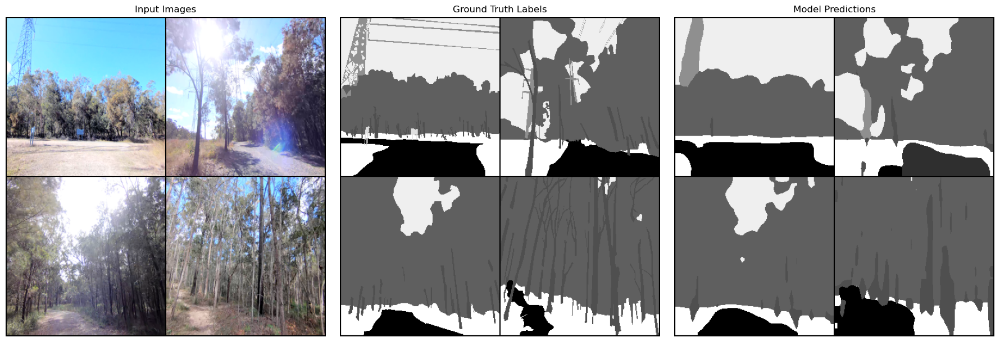

Epoch 4/10


Training:   1%|          | 1/103 [00:02<03:59,  2.35s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.389]

1


Training:   2%|▏         | 2/103 [00:04<03:57,  2.35s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.385]

1


Training:   3%|▎         | 3/103 [00:07<04:08,  2.49s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.375]

1


Training:   4%|▍         | 4/103 [00:09<04:02,  2.45s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.375]

1


Training:   5%|▍         | 5/103 [00:12<03:57,  2.42s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38] 

1


Training:   6%|▌         | 6/103 [00:14<03:54,  2.41s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38]

1


Training:   7%|▋         | 7/103 [00:16<03:51,  2.41s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.385]

1


Training:   8%|▊         | 8/103 [00:19<03:55,  2.48s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38] 

1


Training:   9%|▊         | 9/103 [00:22<03:54,  2.50s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  10%|▉         | 10/103 [00:24<03:54,  2.53s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.385]

1


Training:  11%|█         | 11/103 [00:27<03:49,  2.50s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  12%|█▏        | 12/103 [00:29<03:39,  2.42s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.382]

1


Training:  13%|█▎        | 13/103 [00:31<03:34,  2.39s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  14%|█▎        | 14/103 [00:33<03:27,  2.33s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.384]

1


Training:  15%|█▍        | 15/103 [00:36<03:21,  2.29s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.383]

1


Training:  16%|█▌        | 16/103 [00:38<03:19,  2.29s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.382]

1


Training:  17%|█▋        | 17/103 [00:40<03:14,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38] 

1


Training:  17%|█▋        | 18/103 [00:42<03:13,  2.28s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  18%|█▊        | 19/103 [00:45<03:09,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  19%|█▉        | 20/103 [00:47<03:05,  2.24s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  20%|██        | 21/103 [00:49<03:02,  2.23s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38] 

1


Training:  21%|██▏       | 22/103 [00:51<03:01,  2.24s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38]

1


Training:  22%|██▏       | 23/103 [00:54<03:01,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38]

1


Training:  23%|██▎       | 24/103 [00:56<02:58,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.382]

1


Training:  24%|██▍       | 25/103 [00:58<02:55,  2.25s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.384]

1


Training:  25%|██▌       | 26/103 [01:00<02:54,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.383]

1


Training:  26%|██▌       | 27/103 [01:03<02:50,  2.24s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.382]

1


Training:  27%|██▋       | 28/103 [01:05<02:48,  2.25s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  28%|██▊       | 29/103 [01:07<02:46,  2.25s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38] 

1


Training:  29%|██▉       | 30/103 [01:09<02:45,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38]

1


Training:  30%|███       | 31/103 [01:12<02:42,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38]

1


Training:  31%|███       | 32/103 [01:14<02:40,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38]

1


Training:  32%|███▏      | 33/103 [01:16<02:39,  2.28s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.382]

1


Training:  33%|███▎      | 34/103 [01:18<02:36,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.382]

1


Training:  34%|███▍      | 35/103 [01:21<02:35,  2.29s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  35%|███▍      | 36/103 [01:23<02:32,  2.28s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  36%|███▌      | 37/103 [01:25<02:29,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38] 

1


Training:  37%|███▋      | 38/103 [01:28<02:27,  2.28s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38]

1


Training:  38%|███▊      | 39/103 [01:30<02:25,  2.28s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38]

1


Training:  39%|███▉      | 40/103 [01:32<02:24,  2.29s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  40%|███▉      | 41/103 [01:34<02:21,  2.28s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38] 

1


Training:  41%|████      | 42/103 [01:37<02:18,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38]

1


Training:  42%|████▏     | 43/103 [01:39<02:16,  2.28s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38]

1


Training:  43%|████▎     | 44/103 [01:41<02:14,  2.28s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  44%|████▎     | 45/103 [01:44<02:12,  2.29s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38] 

1


Training:  45%|████▍     | 46/103 [01:46<02:08,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  46%|████▌     | 47/103 [01:48<02:06,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  47%|████▋     | 48/103 [01:50<02:04,  2.25s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  48%|████▊     | 49/103 [01:53<02:02,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  49%|████▊     | 50/103 [01:55<02:00,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.378]

1


Training:  50%|████▉     | 51/103 [01:57<01:57,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.377]

1


Training:  50%|█████     | 52/103 [01:59<01:55,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.378]

1


Training:  51%|█████▏    | 53/103 [02:02<01:53,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.378]

1


Training:  52%|█████▏    | 54/103 [02:04<01:50,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.377]

1


Training:  53%|█████▎    | 55/103 [02:06<01:49,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.377]

1


Training:  54%|█████▍    | 56/103 [02:08<01:46,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.378]

1


Training:  55%|█████▌    | 57/103 [02:11<01:43,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.378]

1


Training:  56%|█████▋    | 58/103 [02:13<01:42,  2.28s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  57%|█████▋    | 59/103 [02:15<01:40,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  58%|█████▊    | 60/103 [02:18<01:38,  2.30s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  59%|█████▉    | 61/103 [02:20<01:35,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  60%|██████    | 62/103 [02:22<01:32,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38] 

1


Training:  61%|██████    | 63/103 [02:24<01:29,  2.24s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38]

1


Training:  62%|██████▏   | 64/103 [02:27<01:28,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  63%|██████▎   | 65/103 [02:29<01:24,  2.23s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  64%|██████▍   | 66/103 [02:31<01:23,  2.25s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  65%|██████▌   | 67/103 [02:33<01:20,  2.25s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  66%|██████▌   | 68/103 [02:36<01:19,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  67%|██████▋   | 69/103 [02:38<01:16,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  68%|██████▊   | 70/103 [02:40<01:13,  2.23s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38] 

1


Training:  69%|██████▉   | 71/103 [02:42<01:11,  2.24s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  70%|██████▉   | 72/103 [02:45<01:10,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  71%|███████   | 73/103 [02:47<01:07,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  72%|███████▏  | 74/103 [02:49<01:05,  2.25s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  73%|███████▎  | 75/103 [02:51<01:03,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.381]

1


Training:  74%|███████▍  | 76/103 [02:54<01:01,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38] 

1


Training:  75%|███████▍  | 77/103 [02:56<00:58,  2.25s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38]

1


Training:  76%|███████▌  | 78/103 [02:58<00:56,  2.24s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38]

1


Training:  77%|███████▋  | 79/103 [03:00<00:54,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38]

1


Training:  78%|███████▊  | 80/103 [03:03<00:52,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38]

1


Training:  79%|███████▊  | 81/103 [03:05<00:49,  2.25s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.38]

1


Training:  80%|███████▉  | 82/103 [03:07<00:47,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  81%|████████  | 83/103 [03:09<00:45,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  82%|████████▏ | 84/103 [03:12<00:43,  2.28s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  83%|████████▎ | 85/103 [03:14<00:40,  2.28s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  83%|████████▎ | 86/103 [03:16<00:38,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.378]

1


Training:  84%|████████▍ | 87/103 [03:19<00:36,  2.28s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  85%|████████▌ | 88/103 [03:21<00:33,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  86%|████████▋ | 89/103 [03:23<00:31,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  87%|████████▋ | 90/103 [03:25<00:29,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.379]

1


Training:  88%|████████▊ | 91/103 [03:28<00:27,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.378]

1


Training:  89%|████████▉ | 92/103 [03:30<00:25,  2.29s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.378]

1


Training:  90%|█████████ | 93/103 [03:32<00:22,  2.28s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.377]

1


Training:  91%|█████████▏| 94/103 [03:34<00:20,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.377]

1


Training:  92%|█████████▏| 95/103 [03:37<00:18,  2.28s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.377]

1


Training:  93%|█████████▎| 96/103 [03:39<00:15,  2.25s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.377]

1


Training:  94%|█████████▍| 97/103 [03:41<00:13,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.378]

1


Training:  95%|█████████▌| 98/103 [03:43<00:11,  2.28s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.377]

1


Training:  96%|█████████▌| 99/103 [03:46<00:09,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.378]

1


Training:  97%|█████████▋| 100/103 [03:48<00:06,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.378]

1


Training:  98%|█████████▊| 101/103 [03:50<00:04,  2.28s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.378]

1


Training:  99%|█████████▉| 102/103 [03:52<00:02,  2.26s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.378]

1


Training: 100%|██████████| 103/103 [03:53<00:00,  2.27s/it, epoch=4, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.378]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:46<00:00,  2.10s/it, gpu_memory=11.91 GB, lr=0.0001, valid_loss=0.451]


Saved Best Model


compute_mIoU: 100%|██████████| 22/22 [00:46<00:00,  2.12s/it]


Validation metric:
mIoU: 30.56
mPA: 36.35
Accuracy: 82.42
plot valid image


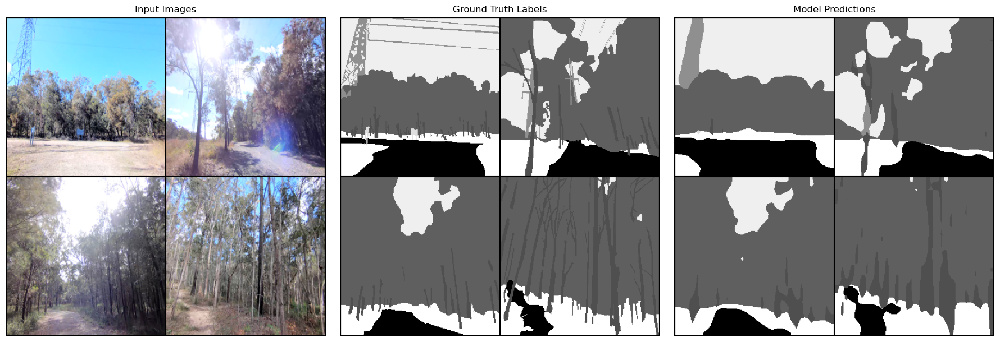

Epoch 5/10


Training:   1%|          | 1/103 [00:02<04:07,  2.42s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.361]

1


Training:   2%|▏         | 2/103 [00:04<03:52,  2.30s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.347]

1


Training:   3%|▎         | 3/103 [00:06<03:47,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.35] 

1


Training:   4%|▍         | 4/103 [00:09<03:45,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.349]

1


Training:   5%|▍         | 5/103 [00:11<03:43,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.357]

1


Training:   6%|▌         | 6/103 [00:13<03:42,  2.30s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.363]

1


Training:   7%|▋         | 7/103 [00:16<03:39,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.362]

1


Training:   8%|▊         | 8/103 [00:18<03:35,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.363]

1


Training:   9%|▊         | 9/103 [00:20<03:34,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.359]

1


Training:  10%|▉         | 10/103 [00:22<03:28,  2.24s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.357]

1


Training:  11%|█         | 11/103 [00:25<03:27,  2.25s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.352]

1


Training:  12%|█▏        | 12/103 [00:27<03:24,  2.25s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.35] 

1


Training:  13%|█▎        | 13/103 [00:29<03:24,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.354]

1


Training:  14%|█▎        | 14/103 [00:31<03:20,  2.26s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.353]

1


Training:  15%|█▍        | 15/103 [00:34<03:17,  2.24s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.351]

1


Training:  16%|█▌        | 16/103 [00:36<03:15,  2.25s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.352]

1


Training:  17%|█▋        | 17/103 [00:38<03:15,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.355]

1


Training:  17%|█▋        | 18/103 [00:40<03:12,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.354]

1


Training:  18%|█▊        | 19/103 [00:43<03:11,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.355]

1


Training:  19%|█▉        | 20/103 [00:45<03:06,  2.25s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.356]

1


Training:  20%|██        | 21/103 [00:47<03:06,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.357]

1


Training:  21%|██▏       | 22/103 [00:49<03:04,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.356]

1


Training:  22%|██▏       | 23/103 [00:52<03:01,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.355]

1


Training:  23%|██▎       | 24/103 [00:54<02:58,  2.26s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.354]

1


Training:  24%|██▍       | 25/103 [00:56<02:57,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.353]

1


Training:  25%|██▌       | 26/103 [00:59<02:54,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.352]

1


Training:  26%|██▌       | 27/103 [01:01<02:51,  2.26s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.352]

1


Training:  27%|██▋       | 28/103 [01:03<02:50,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.354]

1


Training:  28%|██▊       | 29/103 [01:05<02:46,  2.25s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.352]

1


Training:  29%|██▉       | 30/103 [01:08<02:44,  2.26s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.351]

1


Training:  30%|███       | 31/103 [01:10<02:41,  2.25s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.351]

1


Training:  31%|███       | 32/103 [01:12<02:40,  2.26s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.35] 

1


Training:  32%|███▏      | 33/103 [01:14<02:38,  2.26s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.349]

1


Training:  33%|███▎      | 34/103 [01:17<02:37,  2.29s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.35] 

1


Training:  34%|███▍      | 35/103 [01:19<02:34,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.349]

1


Training:  35%|███▍      | 36/103 [01:21<02:31,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.35] 

1


Training:  36%|███▌      | 37/103 [01:23<02:30,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.348]

1


Training:  37%|███▋      | 38/103 [01:26<02:27,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.349]

1


Training:  38%|███▊      | 39/103 [01:28<02:24,  2.26s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.349]

1


Training:  39%|███▉      | 40/103 [01:30<02:23,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.349]

1


Training:  40%|███▉      | 41/103 [01:33<02:20,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.349]

1


Training:  41%|████      | 42/103 [01:35<02:19,  2.29s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.348]

1


Training:  42%|████▏     | 43/103 [01:37<02:16,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.348]

1


Training:  43%|████▎     | 44/103 [01:39<02:12,  2.25s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.347]

1


Training:  44%|████▎     | 45/103 [01:42<02:10,  2.25s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.347]

1


Training:  45%|████▍     | 46/103 [01:44<02:07,  2.24s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.347]

1


Training:  46%|████▌     | 47/103 [01:46<02:06,  2.26s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.347]

1


Training:  47%|████▋     | 48/103 [01:48<02:04,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  48%|████▊     | 49/103 [01:51<02:03,  2.29s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.347]

1


Training:  49%|████▊     | 50/103 [01:53<02:00,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  50%|████▉     | 51/103 [01:55<01:57,  2.26s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  50%|█████     | 52/103 [01:57<01:55,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  51%|█████▏    | 53/103 [02:00<01:53,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  52%|█████▏    | 54/103 [02:02<01:50,  2.26s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  53%|█████▎    | 55/103 [02:04<01:49,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  54%|█████▍    | 56/103 [02:07<01:46,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  55%|█████▌    | 57/103 [02:09<01:45,  2.29s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  56%|█████▋    | 58/103 [02:11<01:42,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  57%|█████▋    | 59/103 [02:13<01:39,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  58%|█████▊    | 60/103 [02:16<01:36,  2.25s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  59%|█████▉    | 61/103 [02:18<01:35,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  60%|██████    | 62/103 [02:20<01:33,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  61%|██████    | 63/103 [02:22<01:31,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  62%|██████▏   | 64/103 [02:25<01:28,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  63%|██████▎   | 65/103 [02:27<01:26,  2.26s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  64%|██████▍   | 66/103 [02:29<01:23,  2.25s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  65%|██████▌   | 67/103 [02:31<01:21,  2.26s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  66%|██████▌   | 68/103 [02:34<01:18,  2.24s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  67%|██████▋   | 69/103 [02:36<01:16,  2.25s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  68%|██████▊   | 70/103 [02:38<01:14,  2.25s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  69%|██████▉   | 71/103 [02:40<01:12,  2.26s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  70%|██████▉   | 72/103 [02:43<01:09,  2.24s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  71%|███████   | 73/103 [02:45<01:07,  2.24s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  72%|███████▏  | 74/103 [02:47<01:05,  2.25s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  73%|███████▎  | 75/103 [02:49<01:03,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  74%|███████▍  | 76/103 [02:52<01:00,  2.26s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  75%|███████▍  | 77/103 [02:54<00:58,  2.25s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  76%|███████▌  | 78/103 [02:56<00:56,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  77%|███████▋  | 79/103 [02:58<00:54,  2.26s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  78%|███████▊  | 80/103 [03:01<00:52,  2.29s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  79%|███████▊  | 81/103 [03:03<00:50,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  80%|███████▉  | 82/103 [03:05<00:47,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  81%|████████  | 83/103 [03:08<00:45,  2.29s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  82%|████████▏ | 84/103 [03:10<00:43,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  83%|████████▎ | 85/103 [03:12<00:41,  2.29s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.346]

1


Training:  83%|████████▎ | 86/103 [03:14<00:38,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  84%|████████▍ | 87/103 [03:17<00:36,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  85%|████████▌ | 88/103 [03:19<00:34,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  86%|████████▋ | 89/103 [03:21<00:31,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  87%|████████▋ | 90/103 [03:24<00:29,  2.29s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  88%|████████▊ | 91/103 [03:26<00:27,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  89%|████████▉ | 92/103 [03:28<00:24,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  90%|█████████ | 93/103 [03:30<00:22,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  91%|█████████▏| 94/103 [03:33<00:20,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  92%|█████████▏| 95/103 [03:35<00:18,  2.26s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  93%|█████████▎| 96/103 [03:37<00:15,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  94%|█████████▍| 97/103 [03:39<00:13,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  95%|█████████▌| 98/103 [03:42<00:11,  2.30s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  96%|█████████▌| 99/103 [03:44<00:09,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  97%|█████████▋| 100/103 [03:46<00:06,  2.29s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  98%|█████████▊| 101/103 [03:49<00:04,  2.28s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training:  99%|█████████▉| 102/103 [03:51<00:02,  2.27s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]

1


Training: 100%|██████████| 103/103 [03:51<00:00,  2.25s/it, epoch=5, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.345]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:46<00:00,  2.10s/it, gpu_memory=11.91 GB, lr=0.0001, valid_loss=0.472]


Epoch 6/10


Training:   1%|          | 1/103 [00:02<03:52,  2.28s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.338]

1


Training:   2%|▏         | 2/103 [00:04<03:49,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.35] 

1


Training:   3%|▎         | 3/103 [00:06<03:47,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.358]

1


Training:   4%|▍         | 4/103 [00:09<03:46,  2.29s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.357]

1


Training:   5%|▍         | 5/103 [00:11<03:42,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.348]

1


Training:   6%|▌         | 6/103 [00:13<03:37,  2.24s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.34] 

1


Training:   7%|▋         | 7/103 [00:15<03:34,  2.23s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.332]

1


Training:   8%|▊         | 8/103 [00:18<03:32,  2.24s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.328]

1


Training:   9%|▊         | 9/103 [00:20<03:32,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.327]

1


Training:  10%|▉         | 10/103 [00:22<03:30,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.328]

1


Training:  11%|█         | 11/103 [00:24<03:29,  2.28s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.33] 

1


Training:  12%|█▏        | 12/103 [00:27<03:26,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.332]

1


Training:  13%|█▎        | 13/103 [00:29<03:23,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.332]

1


Training:  14%|█▎        | 14/103 [00:31<03:19,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.332]

1


Training:  15%|█▍        | 15/103 [00:33<03:18,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.331]

1


Training:  16%|█▌        | 16/103 [00:36<03:16,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.331]

1


Training:  17%|█▋        | 17/103 [00:38<03:16,  2.29s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.332]

1


Training:  17%|█▋        | 18/103 [00:40<03:14,  2.29s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.333]

1


Training:  18%|█▊        | 19/103 [00:43<03:13,  2.30s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.332]

1


Training:  19%|█▉        | 20/103 [00:45<03:08,  2.28s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.33] 

1


Training:  20%|██        | 21/103 [00:47<03:05,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.331]

1


Training:  21%|██▏       | 22/103 [00:49<03:02,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.331]

1


Training:  22%|██▏       | 23/103 [00:52<02:58,  2.24s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.33] 

1


Training:  23%|██▎       | 24/103 [00:54<02:55,  2.23s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.33]

1


Training:  24%|██▍       | 25/103 [00:56<02:55,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.329]

1


Training:  25%|██▌       | 26/103 [00:58<02:53,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.33] 

1


Training:  26%|██▌       | 27/103 [01:01<02:52,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.329]

1


Training:  27%|██▋       | 28/103 [01:03<02:49,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.33] 

1


Training:  28%|██▊       | 29/103 [01:05<02:47,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.33]

1


Training:  29%|██▉       | 30/103 [01:07<02:46,  2.28s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.332]

1


Training:  30%|███       | 31/103 [01:10<02:44,  2.28s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.332]

1


Training:  31%|███       | 32/103 [01:12<02:40,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.331]

1


Training:  32%|███▏      | 33/103 [01:14<02:38,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.33] 

1


Training:  33%|███▎      | 34/103 [01:16<02:34,  2.24s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.331]

1


Training:  34%|███▍      | 35/103 [01:19<02:33,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.33] 

1


Training:  35%|███▍      | 36/103 [01:21<02:30,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.331]

1


Training:  36%|███▌      | 37/103 [01:23<02:27,  2.24s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.33] 

1


Training:  37%|███▋      | 38/103 [01:25<02:27,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.33]

1


Training:  38%|███▊      | 39/103 [01:28<02:24,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.331]

1


Training:  39%|███▉      | 40/103 [01:30<02:21,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.331]

1


Training:  40%|███▉      | 41/103 [01:32<02:20,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.331]

1


Training:  41%|████      | 42/103 [01:34<02:16,  2.24s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.331]

1


Training:  42%|████▏     | 43/103 [01:37<02:14,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.331]

1


Training:  43%|████▎     | 44/103 [01:39<02:12,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.331]

1


Training:  44%|████▎     | 45/103 [01:41<02:11,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.333]

1


Training:  45%|████▍     | 46/103 [01:43<02:08,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.332]

1


Training:  46%|████▌     | 47/103 [01:46<02:07,  2.28s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.331]

1


Training:  47%|████▋     | 48/103 [01:48<02:05,  2.28s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.331]

1


Training:  48%|████▊     | 49/103 [01:50<02:03,  2.29s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.331]

1


Training:  49%|████▊     | 50/103 [01:53<02:01,  2.28s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.331]

1


Training:  50%|████▉     | 51/103 [01:55<01:57,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.33] 

1


Training:  50%|█████     | 52/103 [01:57<01:56,  2.29s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.33]

1


Training:  51%|█████▏    | 53/103 [01:59<01:53,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.33]

1


Training:  52%|█████▏    | 54/103 [02:02<01:50,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.33]

1


Training:  53%|█████▎    | 55/103 [02:04<01:49,  2.28s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.33]

1


Training:  54%|█████▍    | 56/103 [02:06<01:46,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.329]

1


Training:  55%|█████▌    | 57/103 [02:08<01:43,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.329]

1


Training:  56%|█████▋    | 58/103 [02:11<01:42,  2.28s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.329]

1


Training:  57%|█████▋    | 59/103 [02:13<01:39,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.329]

1


Training:  58%|█████▊    | 60/103 [02:15<01:37,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.329]

1


Training:  59%|█████▉    | 61/103 [02:18<01:35,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.329]

1


Training:  60%|██████    | 62/103 [02:20<01:33,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.33] 

1


Training:  61%|██████    | 63/103 [02:22<01:30,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.329]

1


Training:  62%|██████▏   | 64/103 [02:24<01:28,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.329]

1


Training:  63%|██████▎   | 65/103 [02:27<01:26,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.329]

1


Training:  64%|██████▍   | 66/103 [02:29<01:24,  2.29s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.329]

1


Training:  65%|██████▌   | 67/103 [02:31<01:22,  2.29s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.33] 

1


Training:  66%|██████▌   | 68/103 [02:34<01:20,  2.30s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.329]

1


Training:  67%|██████▋   | 69/103 [02:36<01:17,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.329]

1


Training:  68%|██████▊   | 70/103 [02:38<01:14,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.329]

1


Training:  69%|██████▉   | 71/103 [02:40<01:12,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.329]

1


Training:  70%|██████▉   | 72/103 [02:43<01:10,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.329]

1


Training:  71%|███████   | 73/103 [02:45<01:08,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.328]

1


Training:  72%|███████▏  | 74/103 [02:47<01:05,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.328]

1


Training:  73%|███████▎  | 75/103 [02:49<01:03,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.328]

1


Training:  74%|███████▍  | 76/103 [02:52<01:01,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.328]

1


Training:  75%|███████▍  | 77/103 [02:54<00:58,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.329]

1


Training:  76%|███████▌  | 78/103 [02:56<00:56,  2.28s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.328]

1


Training:  77%|███████▋  | 79/103 [02:58<00:54,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.328]

1


Training:  78%|███████▊  | 80/103 [03:01<00:51,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.328]

1


Training:  79%|███████▊  | 81/103 [03:03<00:49,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.328]

1


Training:  80%|███████▉  | 82/103 [03:05<00:47,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.328]

1


Training:  81%|████████  | 83/103 [03:07<00:45,  2.27s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.328]

1


Training:  82%|████████▏ | 84/103 [03:10<00:43,  2.28s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.328]

1


Training:  83%|████████▎ | 85/103 [03:12<00:40,  2.28s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.328]

1


Training:  83%|████████▎ | 86/103 [03:14<00:38,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.327]

1


Training:  84%|████████▍ | 87/103 [03:17<00:36,  2.28s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.327]

1


Training:  85%|████████▌ | 88/103 [03:19<00:34,  2.28s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.328]

1


Training:  86%|████████▋ | 89/103 [03:21<00:31,  2.29s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.327]

1


Training:  87%|████████▋ | 90/103 [03:23<00:29,  2.28s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.327]

1


Training:  88%|████████▊ | 91/103 [03:26<00:27,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.327]

1


Training:  89%|████████▉ | 92/103 [03:28<00:25,  2.29s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.327]

1


Training:  90%|█████████ | 93/103 [03:30<00:22,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.327]

1


Training:  91%|█████████▏| 94/103 [03:32<00:20,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.327]

1


Training:  92%|█████████▏| 95/103 [03:35<00:17,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.327]

1


Training:  93%|█████████▎| 96/103 [03:37<00:15,  2.23s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.327]

1


Training:  94%|█████████▍| 97/103 [03:39<00:13,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.327]

1


Training:  95%|█████████▌| 98/103 [03:41<00:11,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.327]

1


Training:  96%|█████████▌| 99/103 [03:44<00:09,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.327]

1


Training:  97%|█████████▋| 100/103 [03:46<00:06,  2.28s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.327]

1


Training:  98%|█████████▊| 101/103 [03:48<00:04,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.327]

1


Training:  99%|█████████▉| 102/103 [03:50<00:02,  2.26s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.327]

1


Training: 100%|██████████| 103/103 [03:51<00:00,  2.25s/it, epoch=6, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.327]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:46<00:00,  2.10s/it, gpu_memory=11.91 GB, lr=0.0001, valid_loss=0.469]


Epoch 7/10


Training:   1%|          | 1/103 [00:02<03:58,  2.34s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.315]

1


Training:   2%|▏         | 2/103 [00:04<03:53,  2.31s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:   3%|▎         | 3/103 [00:06<03:46,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.302]

1


Training:   4%|▍         | 4/103 [00:09<03:43,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.314]

1


Training:   5%|▍         | 5/103 [00:11<03:43,  2.28s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.308]

1


Training:   6%|▌         | 6/103 [00:13<03:39,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:   7%|▋         | 7/103 [00:15<03:39,  2.29s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:   8%|▊         | 8/103 [00:18<03:36,  2.28s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.307]

1


Training:   9%|▊         | 9/103 [00:20<03:32,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  10%|▉         | 10/103 [00:22<03:29,  2.25s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  11%|█         | 11/103 [00:24<03:25,  2.24s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  12%|█▏        | 12/103 [00:27<03:22,  2.23s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  13%|█▎        | 13/103 [00:29<03:23,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.302]

1


Training:  14%|█▎        | 14/103 [00:31<03:21,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.303]

1


Training:  15%|█▍        | 15/103 [00:34<03:20,  2.28s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.303]

1


Training:  16%|█▌        | 16/103 [00:36<03:16,  2.25s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  17%|█▋        | 17/103 [00:38<03:13,  2.25s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  17%|█▋        | 18/103 [00:40<03:10,  2.25s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:  18%|█▊        | 19/103 [00:42<03:10,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:  19%|█▉        | 20/103 [00:45<03:05,  2.24s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  20%|██        | 21/103 [00:47<03:04,  2.25s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  21%|██▏       | 22/103 [00:49<03:01,  2.24s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  22%|██▏       | 23/103 [00:52<03:01,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.303]

1


Training:  23%|██▎       | 24/103 [00:54<02:57,  2.24s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.303]

1


Training:  24%|██▍       | 25/103 [00:56<02:54,  2.23s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.302]

1


Training:  25%|██▌       | 26/103 [00:58<02:51,  2.23s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.302]

1


Training:  26%|██▌       | 27/103 [01:00<02:50,  2.24s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  27%|██▋       | 28/103 [01:03<02:49,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  28%|██▊       | 29/103 [01:05<02:46,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.303]

1


Training:  29%|██▉       | 30/103 [01:07<02:44,  2.25s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.303]

1


Training:  30%|███       | 31/103 [01:09<02:40,  2.24s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.303]

1


Training:  31%|███       | 32/103 [01:12<02:40,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.303]

1


Training:  32%|███▏      | 33/103 [01:14<02:38,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  33%|███▎      | 34/103 [01:16<02:35,  2.25s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.302]

1


Training:  34%|███▍      | 35/103 [01:19<02:34,  2.28s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  35%|███▍      | 36/103 [01:21<02:32,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  36%|███▌      | 37/103 [01:23<02:30,  2.28s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:  37%|███▋      | 38/103 [01:25<02:27,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  38%|███▊      | 39/103 [01:28<02:24,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  39%|███▉      | 40/103 [01:30<02:23,  2.28s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.307]

1


Training:  40%|███▉      | 41/103 [01:32<02:20,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.307]

1


Training:  41%|████      | 42/103 [01:34<02:17,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.307]

1


Training:  42%|████▏     | 43/103 [01:37<02:16,  2.28s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.307]

1


Training:  43%|████▎     | 44/103 [01:39<02:12,  2.24s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.307]

1


Training:  44%|████▎     | 45/103 [01:41<02:10,  2.25s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.307]

1


Training:  45%|████▍     | 46/103 [01:43<02:08,  2.25s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:  46%|████▌     | 47/103 [01:46<02:06,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:  47%|████▋     | 48/103 [01:48<02:04,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:  48%|████▊     | 49/103 [01:50<02:01,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  49%|████▊     | 50/103 [01:53<02:01,  2.28s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:  50%|████▉     | 51/103 [01:55<01:57,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  50%|█████     | 52/103 [01:57<01:54,  2.25s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:  51%|█████▏    | 53/103 [01:59<01:53,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.307]

1


Training:  52%|█████▏    | 54/103 [02:01<01:49,  2.23s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:  53%|█████▎    | 55/103 [02:04<01:48,  2.25s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:  54%|█████▍    | 56/103 [02:06<01:45,  2.25s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:  55%|█████▌    | 57/103 [02:08<01:44,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:  56%|█████▋    | 58/103 [02:11<01:41,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:  57%|█████▋    | 59/103 [02:13<01:39,  2.25s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:  58%|█████▊    | 60/103 [02:15<01:36,  2.24s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:  59%|█████▉    | 61/103 [02:17<01:35,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  60%|██████    | 62/103 [02:20<01:32,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  61%|██████    | 63/103 [02:22<01:31,  2.28s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  62%|██████▏   | 64/103 [02:24<01:28,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  63%|██████▎   | 65/103 [02:26<01:25,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  64%|██████▍   | 66/103 [02:29<01:24,  2.28s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  65%|██████▌   | 67/103 [02:31<01:21,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  66%|██████▌   | 68/103 [02:33<01:19,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  67%|██████▋   | 69/103 [02:35<01:17,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  68%|██████▊   | 70/103 [02:38<01:14,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  69%|██████▉   | 71/103 [02:40<01:12,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  70%|██████▉   | 72/103 [02:42<01:09,  2.24s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  71%|███████   | 73/103 [02:44<01:07,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  72%|███████▏  | 74/103 [02:47<01:05,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  73%|███████▎  | 75/103 [02:49<01:03,  2.25s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  74%|███████▍  | 76/103 [02:51<01:01,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  75%|███████▍  | 77/103 [02:54<00:59,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  76%|███████▌  | 78/103 [02:56<00:57,  2.28s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.304]

1


Training:  77%|███████▋  | 79/103 [02:58<00:54,  2.28s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  78%|███████▊  | 80/103 [03:00<00:52,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  79%|███████▊  | 81/103 [03:03<00:50,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  80%|███████▉  | 82/103 [03:05<00:47,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  81%|████████  | 83/103 [03:07<00:45,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  82%|████████▏ | 84/103 [03:09<00:43,  2.28s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  83%|████████▎ | 85/103 [03:12<00:40,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  83%|████████▎ | 86/103 [03:14<00:38,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  84%|████████▍ | 87/103 [03:16<00:36,  2.28s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  85%|████████▌ | 88/103 [03:18<00:33,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  86%|████████▋ | 89/103 [03:21<00:31,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  87%|████████▋ | 90/103 [03:23<00:29,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  88%|████████▊ | 91/103 [03:25<00:27,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  89%|████████▉ | 92/103 [03:28<00:24,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  90%|█████████ | 93/103 [03:30<00:22,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  91%|█████████▏| 94/103 [03:32<00:20,  2.26s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  92%|█████████▏| 95/103 [03:34<00:18,  2.25s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  93%|█████████▎| 96/103 [03:37<00:15,  2.24s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  94%|█████████▍| 97/103 [03:39<00:13,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:  95%|█████████▌| 98/103 [03:41<00:11,  2.27s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:  96%|█████████▌| 99/103 [03:43<00:09,  2.29s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training:  97%|█████████▋| 100/103 [03:46<00:06,  2.28s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  98%|█████████▊| 101/103 [03:48<00:04,  2.29s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.305]

1


Training:  99%|█████████▉| 102/103 [03:50<00:02,  2.25s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]

1


Training: 100%|██████████| 103/103 [03:51<00:00,  2.25s/it, epoch=7, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.306]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:46<00:00,  2.10s/it, gpu_memory=11.91 GB, lr=0.0001, valid_loss=0.482]


Epoch 8/10


Training:   1%|          | 1/103 [00:02<04:08,  2.43s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.289]

1


Training:   2%|▏         | 2/103 [00:04<03:57,  2.36s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.285]

1


Training:   3%|▎         | 3/103 [00:06<03:50,  2.31s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.292]

1


Training:   4%|▍         | 4/103 [00:09<03:45,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.292]

1


Training:   5%|▍         | 5/103 [00:11<03:43,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:   6%|▌         | 6/103 [00:13<03:40,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:   7%|▋         | 7/103 [00:16<03:37,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.299]

1


Training:   8%|▊         | 8/103 [00:18<03:36,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.302]

1


Training:   9%|▊         | 9/103 [00:20<03:33,  2.27s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.299]

1


Training:  10%|▉         | 10/103 [00:22<03:30,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.3] 

1


Training:  11%|█         | 11/103 [00:25<03:29,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.299]

1


Training:  12%|█▏        | 12/103 [00:27<03:25,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.3]  

1


Training:  13%|█▎        | 13/103 [00:29<03:21,  2.23s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.3]

1


Training:  14%|█▎        | 14/103 [00:31<03:18,  2.23s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.299]

1


Training:  15%|█▍        | 15/103 [00:34<03:16,  2.24s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.299]

1


Training:  16%|█▌        | 16/103 [00:36<03:17,  2.27s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.3]  

1


Training:  17%|█▋        | 17/103 [00:38<03:14,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.301]

1


Training:  17%|█▋        | 18/103 [00:40<03:13,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.302]

1


Training:  18%|█▊        | 19/103 [00:43<03:11,  2.27s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.302]

1


Training:  19%|█▉        | 20/103 [00:45<03:07,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.3]  

1


Training:  20%|██        | 21/103 [00:47<03:06,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.3]

1


Training:  21%|██▏       | 22/103 [00:49<03:03,  2.27s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.3]

1


Training:  22%|██▏       | 23/103 [00:52<03:00,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.298]

1


Training:  23%|██▎       | 24/103 [00:54<02:59,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.298]

1


Training:  24%|██▍       | 25/103 [00:56<02:56,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.296]

1


Training:  25%|██▌       | 26/103 [00:58<02:54,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.295]

1


Training:  26%|██▌       | 27/103 [01:01<02:50,  2.24s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.294]

1


Training:  27%|██▋       | 28/103 [01:03<02:49,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.293]

1


Training:  28%|██▊       | 29/103 [01:05<02:46,  2.24s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.293]

1


Training:  29%|██▉       | 30/103 [01:07<02:44,  2.25s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.294]

1


Training:  30%|███       | 31/103 [01:10<02:41,  2.24s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.292]

1


Training:  31%|███       | 32/103 [01:12<02:40,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.292]

1


Training:  32%|███▏      | 33/103 [01:14<02:38,  2.27s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.292]

1


Training:  33%|███▎      | 34/103 [01:16<02:35,  2.25s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.292]

1


Training:  34%|███▍      | 35/103 [01:19<02:34,  2.27s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  35%|███▍      | 36/103 [01:21<02:30,  2.24s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.292]

1


Training:  36%|███▌      | 37/103 [01:23<02:28,  2.25s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  37%|███▋      | 38/103 [01:25<02:25,  2.25s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  38%|███▊      | 39/103 [01:28<02:25,  2.27s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.292]

1


Training:  39%|███▉      | 40/103 [01:30<02:22,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.292]

1


Training:  40%|███▉      | 41/103 [01:32<02:21,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.292]

1


Training:  41%|████      | 42/103 [01:35<02:18,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  42%|████▏     | 43/103 [01:37<02:15,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  43%|████▎     | 44/103 [01:39<02:14,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.292]

1


Training:  44%|████▎     | 45/103 [01:41<02:11,  2.27s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.292]

1


Training:  45%|████▍     | 46/103 [01:44<02:08,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.292]

1


Training:  46%|████▌     | 47/103 [01:46<02:08,  2.30s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.292]

1


Training:  47%|████▋     | 48/103 [01:48<02:07,  2.31s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.292]

1


Training:  48%|████▊     | 49/103 [01:51<02:04,  2.30s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  49%|████▊     | 50/103 [01:53<02:00,  2.27s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  50%|████▉     | 51/103 [01:55<01:58,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  50%|█████     | 52/103 [01:57<01:54,  2.25s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  51%|█████▏    | 53/103 [02:00<01:52,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  52%|█████▏    | 54/103 [02:02<01:50,  2.25s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29] 

1


Training:  53%|█████▎    | 55/103 [02:04<01:49,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  54%|█████▍    | 56/103 [02:06<01:46,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  55%|█████▌    | 57/103 [02:09<01:44,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  56%|█████▋    | 58/103 [02:11<01:42,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29] 

1


Training:  57%|█████▋    | 59/103 [02:13<01:39,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.289]

1


Training:  58%|█████▊    | 60/103 [02:15<01:36,  2.25s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29] 

1


Training:  59%|█████▉    | 61/103 [02:18<01:35,  2.27s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  60%|██████    | 62/103 [02:20<01:32,  2.25s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  61%|██████    | 63/103 [02:22<01:30,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  62%|██████▏   | 64/103 [02:25<01:28,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  63%|██████▎   | 65/103 [02:27<01:26,  2.27s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  64%|██████▍   | 66/103 [02:29<01:24,  2.29s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  65%|██████▌   | 67/103 [02:31<01:21,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  66%|██████▌   | 68/103 [02:34<01:19,  2.27s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  67%|██████▋   | 69/103 [02:36<01:17,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  68%|██████▊   | 70/103 [02:38<01:14,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  69%|██████▉   | 71/103 [02:40<01:11,  2.24s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  70%|██████▉   | 72/103 [02:43<01:08,  2.23s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  71%|███████   | 73/103 [02:45<01:06,  2.20s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  72%|███████▏  | 74/103 [02:47<01:04,  2.22s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29] 

1


Training:  73%|███████▎  | 75/103 [02:49<01:02,  2.24s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  74%|███████▍  | 76/103 [02:52<01:01,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  75%|███████▍  | 77/103 [02:54<00:58,  2.24s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29] 

1


Training:  76%|███████▌  | 78/103 [02:56<00:56,  2.24s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  77%|███████▋  | 79/103 [02:58<00:53,  2.24s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  78%|███████▊  | 80/103 [03:01<00:52,  2.27s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  79%|███████▊  | 81/103 [03:03<00:49,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.291]

1


Training:  80%|███████▉  | 82/103 [03:05<00:47,  2.25s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29] 

1


Training:  81%|████████  | 83/103 [03:07<00:45,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  82%|████████▏ | 84/103 [03:10<00:43,  2.27s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  83%|████████▎ | 85/103 [03:12<00:40,  2.25s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  83%|████████▎ | 86/103 [03:14<00:38,  2.27s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.289]

1


Training:  84%|████████▍ | 87/103 [03:16<00:36,  2.27s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.289]

1


Training:  85%|████████▌ | 88/103 [03:19<00:34,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29] 

1


Training:  86%|████████▋ | 89/103 [03:21<00:31,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  87%|████████▋ | 90/103 [03:23<00:29,  2.29s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.289]

1


Training:  88%|████████▊ | 91/103 [03:26<00:27,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.289]

1


Training:  89%|████████▉ | 92/103 [03:28<00:24,  2.27s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.289]

1


Training:  90%|█████████ | 93/103 [03:30<00:22,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29] 

1


Training:  91%|█████████▏| 94/103 [03:32<00:20,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  92%|█████████▏| 95/103 [03:35<00:18,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  93%|█████████▎| 96/103 [03:37<00:15,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  94%|█████████▍| 97/103 [03:39<00:13,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  95%|█████████▌| 98/103 [03:41<00:11,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  96%|█████████▌| 99/103 [03:44<00:09,  2.27s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  97%|█████████▋| 100/103 [03:46<00:06,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  98%|█████████▊| 101/103 [03:48<00:04,  2.26s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training:  99%|█████████▉| 102/103 [03:51<00:02,  2.28s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]

1


Training: 100%|██████████| 103/103 [03:51<00:00,  2.25s/it, epoch=8, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.29]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:46<00:00,  2.11s/it, gpu_memory=11.91 GB, lr=0.0001, valid_loss=0.489]


Epoch 9/10


Training:   1%|          | 1/103 [00:02<04:04,  2.39s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.288]

1


Training:   2%|▏         | 2/103 [00:04<03:55,  2.33s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.279]

1


Training:   3%|▎         | 3/103 [00:06<03:49,  2.30s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.282]

1


Training:   4%|▍         | 4/103 [00:09<03:47,  2.30s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.276]

1


Training:   5%|▍         | 5/103 [00:11<03:43,  2.28s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.276]

1


Training:   6%|▌         | 6/103 [00:13<03:40,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:   7%|▋         | 7/103 [00:16<03:38,  2.28s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.269]

1


Training:   8%|▊         | 8/103 [00:18<03:35,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.266]

1


Training:   9%|▊         | 9/103 [00:20<03:32,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.268]

1


Training:  10%|▉         | 10/103 [00:22<03:31,  2.28s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.268]

1


Training:  11%|█         | 11/103 [00:25<03:27,  2.25s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.269]

1


Training:  12%|█▏        | 12/103 [00:27<03:22,  2.22s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.268]

1


Training:  13%|█▎        | 13/103 [00:29<03:21,  2.24s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.268]

1


Training:  14%|█▎        | 14/103 [00:31<03:19,  2.24s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.269]

1


Training:  15%|█▍        | 15/103 [00:34<03:19,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.27] 

1


Training:  16%|█▌        | 16/103 [00:36<03:17,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.272]

1


Training:  17%|█▋        | 17/103 [00:38<03:16,  2.28s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  17%|█▋        | 18/103 [00:40<03:13,  2.28s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  18%|█▊        | 19/103 [00:43<03:12,  2.29s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  19%|█▉        | 20/103 [00:45<03:09,  2.28s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  20%|██        | 21/103 [00:47<03:08,  2.29s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  21%|██▏       | 22/103 [00:50<03:05,  2.29s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  22%|██▏       | 23/103 [00:52<03:04,  2.30s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  23%|██▎       | 24/103 [00:54<02:58,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.272]

1


Training:  24%|██▍       | 25/103 [00:56<02:57,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  25%|██▌       | 26/103 [00:59<02:54,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.276]

1


Training:  26%|██▌       | 27/103 [01:01<02:53,  2.28s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:  27%|██▋       | 28/103 [01:03<02:50,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.276]

1


Training:  28%|██▊       | 29/103 [01:05<02:46,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.276]

1


Training:  29%|██▉       | 30/103 [01:08<02:46,  2.28s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.277]

1


Training:  30%|███       | 31/103 [01:10<02:43,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.276]

1


Training:  31%|███       | 32/103 [01:12<02:40,  2.25s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:  32%|███▏      | 33/103 [01:15<02:39,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:  33%|███▎      | 34/103 [01:17<02:36,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:  34%|███▍      | 35/103 [01:19<02:33,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  35%|███▍      | 36/103 [01:21<02:32,  2.28s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  36%|███▌      | 37/103 [01:24<02:29,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  37%|███▋      | 38/103 [01:26<02:26,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:  38%|███▊      | 39/103 [01:28<02:25,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:  39%|███▉      | 40/103 [01:30<02:22,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:  40%|███▉      | 41/103 [01:33<02:20,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  41%|████      | 42/103 [01:35<02:18,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:  42%|████▏     | 43/103 [01:37<02:14,  2.24s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:  43%|████▎     | 44/103 [01:39<02:12,  2.25s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  44%|████▎     | 45/103 [01:42<02:09,  2.22s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  45%|████▍     | 46/103 [01:44<02:07,  2.23s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:  46%|████▌     | 47/103 [01:46<02:05,  2.23s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  47%|████▋     | 48/103 [01:48<02:04,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  48%|████▊     | 49/103 [01:51<02:02,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:  49%|████▊     | 50/103 [01:53<02:00,  2.28s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:  50%|████▉     | 51/103 [01:55<01:58,  2.28s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:  50%|█████     | 52/103 [01:57<01:55,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  51%|█████▏    | 53/103 [02:00<01:54,  2.28s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:  52%|█████▏    | 54/103 [02:02<01:51,  2.28s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:  53%|█████▎    | 55/103 [02:04<01:50,  2.29s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:  54%|█████▍    | 56/103 [02:07<01:46,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  55%|█████▌    | 57/103 [02:09<01:43,  2.25s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  56%|█████▋    | 58/103 [02:11<01:41,  2.25s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  57%|█████▋    | 59/103 [02:13<01:39,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  58%|█████▊    | 60/103 [02:16<01:37,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:  59%|█████▉    | 61/103 [02:18<01:34,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.275]

1


Training:  60%|██████    | 62/103 [02:20<01:33,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  61%|██████    | 63/103 [02:22<01:30,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  62%|██████▏   | 64/103 [02:25<01:27,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  63%|██████▎   | 65/103 [02:27<01:26,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  64%|██████▍   | 66/103 [02:29<01:22,  2.23s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  65%|██████▌   | 67/103 [02:31<01:21,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  66%|██████▌   | 68/103 [02:34<01:18,  2.25s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  67%|██████▋   | 69/103 [02:36<01:17,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  68%|██████▊   | 70/103 [02:38<01:14,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  69%|██████▉   | 71/103 [02:40<01:11,  2.25s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  70%|██████▉   | 72/103 [02:43<01:09,  2.24s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  71%|███████   | 73/103 [02:45<01:08,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  72%|███████▏  | 74/103 [02:47<01:05,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  73%|███████▎  | 75/103 [02:49<01:02,  2.25s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  74%|███████▍  | 76/103 [02:52<01:00,  2.24s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  75%|███████▍  | 77/103 [02:54<00:58,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  76%|███████▌  | 78/103 [02:56<00:55,  2.23s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  77%|███████▋  | 79/103 [02:58<00:53,  2.25s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  78%|███████▊  | 80/103 [03:01<00:51,  2.24s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  79%|███████▊  | 81/103 [03:03<00:49,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  80%|███████▉  | 82/103 [03:05<00:47,  2.25s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  81%|████████  | 83/103 [03:07<00:45,  2.25s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  82%|████████▏ | 84/103 [03:10<00:43,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  83%|████████▎ | 85/103 [03:12<00:40,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  83%|████████▎ | 86/103 [03:14<00:38,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  84%|████████▍ | 87/103 [03:16<00:36,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  85%|████████▌ | 88/103 [03:19<00:34,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  86%|████████▋ | 89/103 [03:21<00:32,  2.29s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  87%|████████▋ | 90/103 [03:23<00:29,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  88%|████████▊ | 91/103 [03:26<00:27,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  89%|████████▉ | 92/103 [03:28<00:24,  2.25s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  90%|█████████ | 93/103 [03:30<00:22,  2.24s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  91%|█████████▏| 94/103 [03:32<00:20,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.274]

1


Training:  92%|█████████▏| 95/103 [03:35<00:18,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  93%|█████████▎| 96/103 [03:37<00:15,  2.25s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  94%|█████████▍| 97/103 [03:39<00:13,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  95%|█████████▌| 98/103 [03:41<00:11,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  96%|█████████▌| 99/103 [03:44<00:09,  2.25s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  97%|█████████▋| 100/103 [03:46<00:06,  2.24s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  98%|█████████▊| 101/103 [03:48<00:04,  2.26s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training:  99%|█████████▉| 102/103 [03:50<00:02,  2.27s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]

1


Training: 100%|██████████| 103/103 [03:51<00:00,  2.25s/it, epoch=9, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.273]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:46<00:00,  2.10s/it, gpu_memory=11.91 GB, lr=0.0001, valid_loss=0.488]


Epoch 10/10


Training:   1%|          | 1/103 [00:02<03:59,  2.35s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.247]

1


Training:   2%|▏         | 2/103 [00:04<03:53,  2.31s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.249]

1


Training:   3%|▎         | 3/103 [00:06<03:47,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.259]

1


Training:   4%|▍         | 4/103 [00:09<03:43,  2.26s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:   5%|▍         | 5/103 [00:11<03:43,  2.28s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:   6%|▌         | 6/103 [00:13<03:37,  2.24s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.258]

1


Training:   7%|▋         | 7/103 [00:15<03:37,  2.26s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.255]

1


Training:   8%|▊         | 8/103 [00:18<03:37,  2.28s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.258]

1


Training:   9%|▊         | 9/103 [00:20<03:30,  2.24s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  10%|▉         | 10/103 [00:22<03:29,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  11%|█         | 11/103 [00:24<03:27,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  12%|█▏        | 12/103 [00:27<03:26,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  13%|█▎        | 13/103 [00:29<03:24,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.26] 

1


Training:  14%|█▎        | 14/103 [00:31<03:23,  2.29s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.26]

1


Training:  15%|█▍        | 15/103 [00:34<03:20,  2.28s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.26]

1


Training:  16%|█▌        | 16/103 [00:36<03:17,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  17%|█▋        | 17/103 [00:38<03:16,  2.28s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  17%|█▋        | 18/103 [00:40<03:11,  2.26s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  18%|█▊        | 19/103 [00:43<03:10,  2.26s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  19%|█▉        | 20/103 [00:45<03:09,  2.29s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  20%|██        | 21/103 [00:47<03:06,  2.28s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  21%|██▏       | 22/103 [00:50<03:05,  2.29s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  22%|██▏       | 23/103 [00:52<03:01,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  23%|██▎       | 24/103 [00:54<02:58,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  24%|██▍       | 25/103 [00:56<02:57,  2.28s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  25%|██▌       | 26/103 [00:58<02:53,  2.26s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  26%|██▌       | 27/103 [01:01<02:51,  2.26s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  27%|██▋       | 28/103 [01:03<02:48,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  28%|██▊       | 29/103 [01:05<02:47,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  29%|██▉       | 30/103 [01:08<02:44,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  30%|███       | 31/103 [01:10<02:41,  2.24s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  31%|███       | 32/103 [01:12<02:39,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  32%|███▏      | 33/103 [01:14<02:38,  2.26s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  33%|███▎      | 34/103 [01:17<02:36,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  34%|███▍      | 35/103 [01:19<02:35,  2.29s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  35%|███▍      | 36/103 [01:21<02:28,  2.22s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  36%|███▌      | 37/103 [01:23<02:28,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  37%|███▋      | 38/103 [01:26<02:26,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  38%|███▊      | 39/103 [01:28<02:24,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  39%|███▉      | 40/103 [01:30<02:23,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.26] 

1


Training:  40%|███▉      | 41/103 [01:32<02:20,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  41%|████      | 42/103 [01:35<02:19,  2.29s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.26] 

1


Training:  42%|████▏     | 43/103 [01:37<02:16,  2.28s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  43%|████▎     | 44/103 [01:39<02:13,  2.26s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.26] 

1


Training:  44%|████▎     | 45/103 [01:41<02:11,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.26]

1


Training:  45%|████▍     | 46/103 [01:44<02:09,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.26]

1


Training:  46%|████▌     | 47/103 [01:46<02:06,  2.26s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  47%|████▋     | 48/103 [01:48<02:04,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  48%|████▊     | 49/103 [01:50<02:00,  2.24s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  49%|████▊     | 50/103 [01:53<01:59,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  50%|████▉     | 51/103 [01:55<01:56,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  50%|█████     | 52/103 [01:57<01:55,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  51%|█████▏    | 53/103 [01:59<01:52,  2.24s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  52%|█████▏    | 54/103 [02:02<01:50,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  53%|█████▎    | 55/103 [02:04<01:47,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  54%|█████▍    | 56/103 [02:06<01:46,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  55%|█████▌    | 57/103 [02:08<01:43,  2.24s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  56%|█████▋    | 58/103 [02:11<01:39,  2.22s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  57%|█████▋    | 59/103 [02:13<01:38,  2.24s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  58%|█████▊    | 60/103 [02:15<01:36,  2.24s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.26] 

1


Training:  59%|█████▉    | 61/103 [02:17<01:34,  2.26s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.26]

1


Training:  60%|██████    | 62/103 [02:20<01:32,  2.26s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  61%|██████    | 63/103 [02:22<01:31,  2.28s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  62%|██████▏   | 64/103 [02:24<01:28,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  63%|██████▎   | 65/103 [02:27<01:26,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  64%|██████▍   | 66/103 [02:29<01:24,  2.28s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  65%|██████▌   | 67/103 [02:31<01:21,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  66%|██████▌   | 68/103 [02:33<01:19,  2.26s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.261]

1


Training:  67%|██████▋   | 69/103 [02:36<01:17,  2.28s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  68%|██████▊   | 70/103 [02:38<01:15,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  69%|██████▉   | 71/103 [02:40<01:13,  2.29s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  70%|██████▉   | 72/103 [02:43<01:10,  2.28s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  71%|███████   | 73/103 [02:45<01:08,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  72%|███████▏  | 74/103 [02:47<01:05,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  73%|███████▎  | 75/103 [02:49<01:03,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  74%|███████▍  | 76/103 [02:52<01:01,  2.26s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  75%|███████▍  | 77/103 [02:54<00:59,  2.28s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  76%|███████▌  | 78/103 [02:56<00:56,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  77%|███████▋  | 79/103 [02:58<00:54,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  78%|███████▊  | 80/103 [03:01<00:51,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  79%|███████▊  | 81/103 [03:03<00:49,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  80%|███████▉  | 82/103 [03:05<00:47,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  81%|████████  | 83/103 [03:07<00:44,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  82%|████████▏ | 84/103 [03:10<00:42,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  83%|████████▎ | 85/103 [03:12<00:40,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  83%|████████▎ | 86/103 [03:14<00:38,  2.24s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  84%|████████▍ | 87/103 [03:16<00:35,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  85%|████████▌ | 88/103 [03:19<00:33,  2.24s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  86%|████████▋ | 89/103 [03:21<00:31,  2.26s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  87%|████████▋ | 90/103 [03:23<00:29,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  88%|████████▊ | 91/103 [03:25<00:27,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  89%|████████▉ | 92/103 [03:28<00:24,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.263]

1


Training:  90%|█████████ | 93/103 [03:30<00:22,  2.26s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  91%|█████████▏| 94/103 [03:32<00:20,  2.23s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  92%|█████████▏| 95/103 [03:34<00:17,  2.24s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  93%|█████████▎| 96/103 [03:37<00:15,  2.24s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  94%|█████████▍| 97/103 [03:39<00:13,  2.26s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  95%|█████████▌| 98/103 [03:41<00:11,  2.26s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  96%|█████████▌| 99/103 [03:43<00:08,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  97%|█████████▋| 100/103 [03:46<00:06,  2.26s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  98%|█████████▊| 101/103 [03:48<00:04,  2.27s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training:  99%|█████████▉| 102/103 [03:50<00:02,  2.25s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]

1


Training: 100%|██████████| 103/103 [03:51<00:00,  2.24s/it, epoch=10, gpu_mem=11.91 GB, lr=0.0001, train_loss=0.262]


1


Validating:   0%|          | 0/22 [00:00<?, ?it/s]

2


Validating: 100%|██████████| 22/22 [00:45<00:00,  2.09s/it, gpu_memory=11.91 GB, lr=0.0001, valid_loss=0.502]


In [30]:
from torchvision.models.segmentation.fcn import FCNHead
from torchvision.models.segmentation.deeplabv3 import DeepLabHead
import pandas as pd

model_fcn = torchvision.models.segmentation.fcn_resnet50(pretrained=True)
model_fcn.classifier = FCNHead(2048, 128)

model_deeplabv3 = torchvision.models.segmentation.deeplabv3_resnet50(pretrained=True)
model_deeplabv3.classifier = DeepLabHead(2048, 128)


class MyEnsembleModel(nn.Module):
    def __init__(self, model1, model2, num_classes):
        super(MyEnsembleModel, self).__init__()
        self.model1 = model1
        self.model2 = model2
        self.cnn = nn.Conv2d(128, num_classes, kernel_size=(1, 1), stride=(1, 1))
    def forward(self,x):
        v1 = self.model1(x)['out']
        v2 = self.model2(x)['out']
        x = v1+v2
        x = self.cnn(x)
        return {'out': x}
        
my_model = MyEnsembleModel(model_fcn, model_deeplabv3, num_classes)


my_model.to(device)

optimizer = optim.Adam(my_model.parameters(), lr=1e-4, weight_decay=1e-6)

runner = ModelTrainValid(my_model, device, num_classes, train_loader, val_loader, test_loader, optimizer)
model_model_my, history_model_my = runner.do_training(num_epochs=10, save_name='model_my')


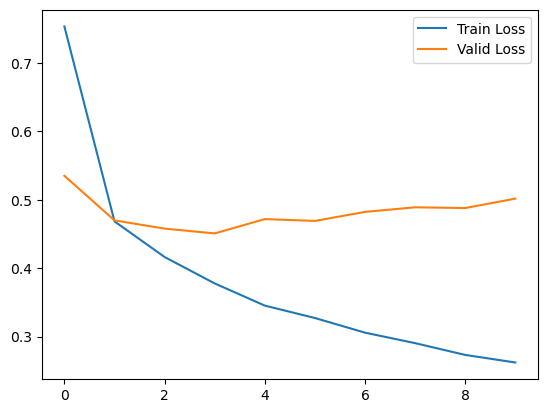

In [31]:
df = pd.DataFrame(history_model_my)
df.plot()
plt.show()

### test

In [32]:
IoUs, PA_Recall, Precision = runner.mIoU_compute(runner.test_loader)

result_data_my = {name_classes[i]: (IoUs[i], PA_Recall[i], Precision[i]) for i in range(num_classes)}

result_df_my = pd.DataFrame(result_data_my).T
result_df_my.rename(columns={0: 'IoU', 1:'PA_Recal', 2:'Precision'}, inplace=True)
result_df_my

compute_mIoU: 100%|██████████| 22/22 [00:47<00:00,  2.17s/it]

Validation metric:
mIoU: 30.91
mPA: 37.08
Accuracy: 82.80


,IoU,PA_Recal,Precision
unlabelled,0.000000,0.000000,0.000000
asphalt,0.000000,0.000000,0.000000
dirt,0.625590,0.770294,0.769061
mud,0.145283,0.209709,0.321070
water,0.686004,0.791856,0.836916
gravel,0.656644,0.685994,0.938829
other-terrain,0.063233,0.063317,0.979367
tree-trunk,0.424117,0.530050,0.679705
tree-foliage,0.816640,0.923067,0.876283
bush,0.151664,0.181315,0.481166


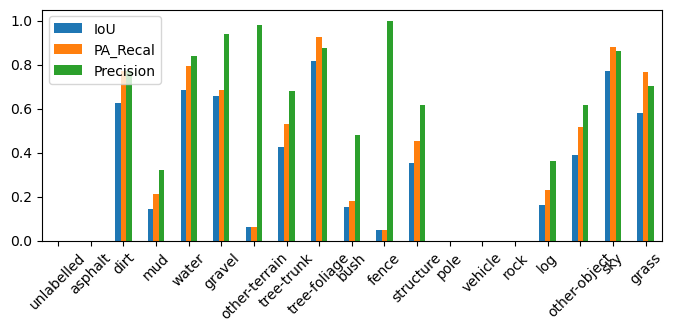

In [33]:
result_df_my.plot(kind='bar', figsize=(8, 3), rot=45)
plt.show()